In [2]:
#Création matrice modèle
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tqdm import tqdm

ratings=pd.read_csv('../../../dataset/ml-20m/ratings.csv')
df_ref=pd.read_csv('../../new_dataset/correspondances_Id_movie')

list_movieId=pd.read_csv('../reduced_list_movieId.txt', header=None, names=["movieId_ref"])
list_userId=pd.read_csv('../reduced_list_userId.txt', header=None, names=["userId"])

In [3]:
# Ajout de movieId_ref dans fichier ratings, et suppression infos inutiles
ratings.index=ratings.movieId
df_ref.index=df_ref.movieId
ratings=ratings.join(df_ref.movieId_ref)
ratings=ratings.drop(["timestamp", "movieId"], axis=1)
ratings=ratings.dropna(subset=["movieId_ref"])
print(len(ratings.movieId_ref.unique()))
ratings.movieId_ref=ratings.movieId_ref.astype(int)
ratings.head()

23608


,userId,rating,movieId_ref
movieId,,,
1,3,4.0,1
1,6,5.0,1
1,8,4.0,1
1,10,4.0,1
1,11,4.5,1


In [4]:
liste1=list(list_movieId.movieId_ref)
liste2=list(list_userId.userId)

#Réduction des données avec les movies set Id sélectionnés dans fichier reduction_Dataset
ratings=ratings[(ratings.movieId_ref.isin(liste1))]
ratings=ratings[(ratings.userId.isin(liste2))]
print(ratings.shape)
print(len(ratings.userId.unique()))
print(len(ratings.movieId_ref.unique()))

#Renumérotation des movieId et user Id de manière continue
ratings_user=ratings.groupby("userId").count()
ratings_user["userId_red"]=np.arange(1,22813)
ratings=ratings.join(ratings_user.userId_red, on="userId")
ratings.head(40)

ratings_movie=ratings.groupby("movieId_ref").count()
ratings_movie["movieId_red"]=np.arange(1,3221)
ratings=ratings.join(ratings_movie.movieId_red, on="movieId_ref")
ratings.head(40)

ratings=ratings.sort_values(by='userId_red')
ratings=ratings.drop(["movieId_ref", "userId"], axis=1)

(567692, 3)
22812
3220


In [5]:
ratings.head()
ratings.describe()

,rating,userId_red,movieId_red
count,567692.000000,567692.000000,567692.000000
mean,3.499027,11405.873098,660.028549
std,1.054596,6590.331316,672.072800
min,0.500000,1.000000,1.000000
25%,3.000000,5694.000000,185.000000
50%,3.500000,11329.000000,412.000000
75%,4.000000,17167.000000,900.000000
max,5.000000,22812.000000,3220.000000


In [6]:
#séparer jeu de test jeu d entrainement
train_data, test_data=train_test_split(ratings, test_size=0.2)

In [7]:
#Définition du nombre de users et du nombre de films

n_users = ratings.userId_red.unique().shape[0]
n_movies = ratings.movieId_red.unique().shape[0]
print ("Nombre d'utilisateurs : " + str(n_users) + " | Nombre de films : " + str(n_movies))

Nombre d'utilisateurs : 22812 | Nombre de films : 3220


In [8]:
# Création de 2 matrices modèles train et test

matrice_train=np.zeros((n_users, n_movies))
for line in train_data.itertuples():
    matrice_train[line[2]-1, line[3]-1]=line[1]

matrice_test=np.zeros((n_users, n_movies))
for line in test_data.itertuples():
    matrice_test[line[2]-1, line[3]-1]=line[1]

In [9]:
matrice_train.shape

(22812, 3220)

In [11]:
#matrices creuses
matrice_train[:10,:10]
from scipy import sparse
matrix_train_s = sparse.csr_matrix(matrice_train)
del 

In [14]:
from sklearn.metrics.pairwise import cosine_similarity
movie_similarity = cosine_similarity(matrix_train_s)

# Filtrage collaboratif :
movie-based filtering


In [9]:
#Création des matrices de similarité
from sklearn.metrics.pairwise import cosine_similarity
movie_similarity=cosine_similarity(matrice_train.T)
movie_similarity.shape

(3220, 3220)

In [1]:
#Calcul des prédictions
def pred_movie(ratings, movie_similarity, k):    
    pred = np.zeros(ratings.shape)
    print(pred.shape)
    for i in tqdm(range(ratings.shape[1])):     
        top_k_movies = np.argsort(movie_similarity[:,i])[-1:-k-1:-1]  
        for u in range(ratings.shape[0]):
            pred[u,i]=movie_similarity[i,:][top_k_movies].dot((ratings[u,:][top_k_movies]).T)
            pred[u,i]/=np.sum(np.abs(movie_similarity[i,:][top_k_movies]))+0.000001     
    return pred 


def get_rmse(pred, actual):
    pred = pred[actual.nonzero()].flatten() # Ignore nonzero terms.
    actual = actual[actual.nonzero()].flatten()
    return np.sqrt(mean_squared_error(pred, actual))

  0%|          | 0/3220 [00:00<?, ?it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 23%|██▎       | 5249/22812 [00:00<00:00, 52489.92it/s]



(22812, 3220)


 51%|█████     | 11544/22812 [00:00<00:00, 55241.80it/s]

 79%|███████▉  | 18027/22812 [00:00<00:00, 57805.07it/s]

  0%|          | 1/3220 [00:00<20:28,  2.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9264/22812 [00:00<00:00, 92631.70it/s]

 82%|████████▏ | 18730/22812 [00:00<00:00, 93230.70it/s]

  0%|          | 2/3220 [00:00<18:22,  2.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8729/22812 [00:00<00:00, 87287.17it/s]

 78%|███████▊  | 17711/22812 [00:00<00:00, 88029.08it/s]

  0%|          | 3/3220 [00:00<17:09,  3.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8197/22812 [00:00<00:00, 81969.10it/s]

 75%|███████▌  | 17148/22812 [00:00<00:00, 84093.28it/s]

  0%|          | 4/3220 [00:01<16:18,  3.29it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8311/22812 [00:00<00:00, 83109.48it/s]

 72%|███████▏  | 16469/22812 [00:00<00:00, 82641.86it/s]

  0%|          | 5/3220 [00:01<15:50,  3.38it/s]

  

  2%|▏         | 56/3220 [00:14<12:38,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9487/22812 [00:00<00:00, 94868.96it/s]

 83%|████████▎ | 18914/22812 [00:00<00:00, 94687.62it/s]

  2%|▏         | 57/3220 [00:14<12:42,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9928/22812 [00:00<00:00, 99275.12it/s]

 87%|████████▋ | 19875/22812 [00:00<00:00, 99331.41it/s]

  2%|▏         | 58/3220 [00:14<12:40,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9118/22812 [00:00<00:00, 91174.65it/s]

 83%|████████▎ | 19005/22812 [00:00<00:00, 93353.11it/s]

  2%|▏         | 59/3220 [00:15<12:45,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8933/22812 [00:00<00:00, 89322.63it/s]

 80%|████████  | 18283/22812 [00:00<00:00, 90535.39it/s]

  2%|▏         | 60/3220 [00:15<12:59,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9925/22812 [00:00<00:00, 99247.02it/s]

 88%|████████

 42%|████▏     | 9629/22812 [00:00<00:00, 96287.11it/s]

 85%|████████▍ | 19292/22812 [00:00<00:00, 96387.68it/s]

  3%|▎         | 112/3220 [00:28<12:28,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10098/22812 [00:00<00:00, 100973.84it/s]

 84%|████████▎ | 19096/22812 [00:00<00:00, 97402.03it/s] 

  4%|▎         | 113/3220 [00:28<12:31,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9792/22812 [00:00<00:00, 97916.36it/s]

 84%|████████▍ | 19250/22812 [00:00<00:00, 96885.56it/s]

  4%|▎         | 114/3220 [00:28<12:34,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8705/22812 [00:00<00:00, 87045.52it/s]

 84%|████████▍ | 19106/22812 [00:00<00:00, 91523.00it/s]

  4%|▎         | 115/3220 [00:28<12:34,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9865/22812 [00:00<00:00, 98644.21it/s]

 84%|████████▎ | 19097/22812 [00:00<00:00, 96642.85it/s]

  4%|▎         | 116/3220 [00:28<12:38,  4

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9706/22812 [00:00<00:00, 97059.86it/s]

 85%|████████▍ | 19292/22812 [00:00<00:00, 96691.77it/s]

  4%|▍         | 140/3220 [00:34<12:25,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9185/22812 [00:00<00:00, 91845.27it/s]

 83%|████████▎ | 19015/22812 [00:00<00:00, 93690.09it/s]

  4%|▍         | 141/3220 [00:35<12:27,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9466/22812 [00:00<00:00, 94650.61it/s]

 84%|████████▎ | 19079/22812 [00:00<00:00, 95086.83it/s]

  4%|▍         | 142/3220 [00:35<12:31,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9930/22812 [00:00<00:00, 99295.83it/s]

 85%|████████▌ | 19431/22812 [00:00<00:00, 97966.44it/s]

  4%|▍         | 143/3220 [00:35<12:30,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9183/22812 [00:00<00:00, 91826.37it/s]

 83%|████████▎ | 18832/22812 [00:00<00:00, 93174.49it/s]

  

  6%|▌         | 195/3220 [00:48<12:23,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9493/22812 [00:00<00:00, 94926.47it/s]

 85%|████████▍ | 19388/22812 [00:00<00:00, 96090.63it/s]

  6%|▌         | 196/3220 [00:48<12:19,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9338/22812 [00:00<00:00, 93371.63it/s]

 80%|████████  | 18324/22812 [00:00<00:00, 92289.41it/s]

  6%|▌         | 197/3220 [00:48<12:31,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9225/22812 [00:00<00:00, 92246.35it/s]

 82%|████████▏ | 18788/22812 [00:00<00:00, 93235.47it/s]

  6%|▌         | 198/3220 [00:49<12:29,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9800/22812 [00:00<00:00, 97991.22it/s]

 83%|████████▎ | 18920/22812 [00:00<00:00, 95849.06it/s]

  6%|▌         | 199/3220 [00:49<12:28,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10074/22812 [00:00<00:00, 100734.09it/s]

 87%|█

 43%|████▎     | 9898/22812 [00:00<00:00, 98976.08it/s]

 86%|████████▌ | 19654/22812 [00:00<00:00, 98543.93it/s]

  8%|▊         | 251/3220 [01:02<11:57,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8805/22812 [00:00<00:00, 88042.11it/s]

 81%|████████  | 18394/22812 [00:00<00:00, 90256.64it/s]

  8%|▊         | 252/3220 [01:02<12:04,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8805/22812 [00:00<00:00, 88045.47it/s]

 82%|████████▏ | 18650/22812 [00:00<00:00, 90925.55it/s]

  8%|▊         | 253/3220 [01:02<12:11,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9442/22812 [00:00<00:00, 94412.66it/s]

 87%|████████▋ | 19769/22812 [00:00<00:00, 96904.52it/s]

  8%|▊         | 254/3220 [01:02<12:04,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9284/22812 [00:00<00:00, 92836.33it/s]

 81%|████████▏ | 18590/22812 [00:00<00:00, 92902.48it/s]

  8%|▊         | 255/3220 [01:03<12:06,  4.08

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9661/22812 [00:00<00:00, 96605.02it/s]

 86%|████████▋ | 19717/22812 [00:00<00:00, 97755.91it/s]

  9%|▊         | 279/3220 [01:08<11:50,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9180/22812 [00:00<00:00, 91792.43it/s]

 83%|████████▎ | 18890/22812 [00:00<00:00, 93318.23it/s]

  9%|▊         | 280/3220 [01:09<11:52,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9244/22812 [00:00<00:00, 92437.22it/s]

 82%|████████▏ | 18644/22812 [00:00<00:00, 92900.01it/s]

  9%|▊         | 281/3220 [01:09<11:56,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9219/22812 [00:00<00:00, 92184.37it/s]

 81%|████████  | 18430/22812 [00:00<00:00, 92161.22it/s]

  9%|▉         | 282/3220 [01:09<12:03,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9486/22812 [00:00<00:00, 94853.08it/s]

 84%|████████▍ | 19230/22812 [00:00<00:00, 95611.56it/s]

  

 10%|█         | 334/3220 [01:22<11:41,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10042/22812 [00:00<00:00, 100412.91it/s]

 87%|████████▋ | 19744/22812 [00:00<00:00, 99367.57it/s] 

 10%|█         | 335/3220 [01:22<11:39,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9134/22812 [00:00<00:00, 91333.55it/s]

 81%|████████  | 18434/22812 [00:00<00:00, 91825.07it/s]

 10%|█         | 336/3220 [01:22<11:46,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9135/22812 [00:00<00:00, 91348.13it/s]

 83%|████████▎ | 19032/22812 [00:00<00:00, 93506.70it/s]

 10%|█         | 337/3220 [01:23<11:50,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9609/22812 [00:00<00:00, 96083.22it/s]

 87%|████████▋ | 19843/22812 [00:00<00:00, 97877.31it/s]

 10%|█         | 338/3220 [01:23<11:41,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10017/22812 [00:00<00:00, 100165.80it/s]

 86

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9535/22812 [00:00<00:00, 95346.00it/s]

 83%|████████▎ | 18968/22812 [00:00<00:00, 95036.61it/s]

 12%|█▏        | 390/3220 [01:35<11:36,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10025/22812 [00:00<00:00, 100242.21it/s]

 87%|████████▋ | 19912/22812 [00:00<00:00, 99821.98it/s] 

 12%|█▏        | 391/3220 [01:36<11:34,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9423/22812 [00:00<00:00, 94224.47it/s]

 84%|████████▎ | 19091/22812 [00:00<00:00, 94944.83it/s]

 12%|█▏        | 392/3220 [01:36<11:34,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 9986/22812 [00:00<00:00, 99857.95it/s]

 89%|████████▉ | 20294/22812 [00:00<00:00, 100801.48it/s]

 12%|█▏        | 393/3220 [01:36<11:27,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9170/22812 [00:00<00:00, 91693.53it/s]

 85%|████████▍ | 19336/22812 [00:00<00:00, 94470.46it/s]

 14%|█▍        | 445/3220 [01:49<11:15,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9521/22812 [00:00<00:00, 95202.15it/s]

 85%|████████▌ | 19407/22812 [00:00<00:00, 96267.37it/s]

 14%|█▍        | 446/3220 [01:49<11:12,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8893/22812 [00:00<00:00, 88926.69it/s]

 81%|████████▏ | 18538/22812 [00:00<00:00, 91057.46it/s]

 14%|█▍        | 447/3220 [01:49<11:20,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9417/22812 [00:00<00:00, 94165.15it/s]

 83%|████████▎ | 18990/22812 [00:00<00:00, 94626.69it/s]

 14%|█▍        | 448/3220 [01:50<11:22,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8843/22812 [00:00<00:00, 88423.55it/s]

 82%|████████▏ | 18776/22812 [00:00<00:00, 91435.22it/s]

 14%|█▍        | 449/3220 [01:50<11:27,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9824/22812 [00:00<00:00, 98239.86it/s]

 87%|███

 41%|████▏     | 9419/22812 [00:00<00:00, 94183.35it/s]

 85%|████████▌ | 19476/22812 [00:00<00:00, 96010.32it/s]

 16%|█▌        | 501/3220 [02:03<11:07,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9509/22812 [00:00<00:00, 95088.96it/s]

 86%|████████▌ | 19507/22812 [00:00<00:00, 96502.50it/s]

 16%|█▌        | 502/3220 [02:03<11:03,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10095/22812 [00:00<00:00, 100940.95it/s]

 86%|████████▋ | 19689/22812 [00:00<00:00, 99384.51it/s] 

 16%|█▌        | 503/3220 [02:03<11:00,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9614/22812 [00:00<00:00, 96139.17it/s]

 84%|████████▍ | 19195/22812 [00:00<00:00, 96038.15it/s]

 16%|█▌        | 504/3220 [02:03<11:01,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10136/22812 [00:00<00:00, 101355.99it/s]

 90%|████████▉ | 20461/22812 [00:00<00:00, 101916.52it/s]

 16%|█▌        | 505/3220 [02:04<10:50,

 86%|████████▌ | 19657/22812 [00:00<00:00, 99183.99it/s] 

 17%|█▋        | 556/3220 [02:16<10:47,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9876/22812 [00:00<00:00, 98753.74it/s]

 85%|████████▍ | 19284/22812 [00:00<00:00, 97302.09it/s]

 17%|█▋        | 557/3220 [02:16<10:50,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9509/22812 [00:00<00:00, 95085.33it/s]

 87%|████████▋ | 19779/22812 [00:00<00:00, 97248.23it/s]

 17%|█▋        | 558/3220 [02:16<10:45,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9460/22812 [00:00<00:00, 94597.38it/s]

 81%|████████  | 18497/22812 [00:00<00:00, 93270.89it/s]

 17%|█▋        | 559/3220 [02:17<10:52,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9857/22812 [00:00<00:00, 98564.92it/s]

 86%|████████▋ | 19684/22812 [00:00<00:00, 98475.65it/s]

 17%|█▋        | 560/3220 [02:17<10:49,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|█

 19%|█▉        | 611/3220 [02:29<10:31,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10192/22812 [00:00<00:00, 101918.15it/s]

 86%|████████▋ | 19725/22812 [00:00<00:00, 99846.42it/s] 

 19%|█▉        | 612/3220 [02:30<10:28,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9510/22812 [00:00<00:00, 95096.01it/s]

 85%|████████▍ | 19291/22812 [00:00<00:00, 95882.72it/s]

 19%|█▉        | 613/3220 [02:30<10:29,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9255/22812 [00:00<00:00, 92547.22it/s]

 84%|████████▍ | 19138/22812 [00:00<00:00, 94344.38it/s]

 19%|█▉        | 614/3220 [02:30<10:31,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9493/22812 [00:00<00:00, 94923.30it/s]

 83%|████████▎ | 18902/22812 [00:00<00:00, 94670.63it/s]

 19%|█▉        | 615/3220 [02:30<10:38,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9694/22812 [00:00<00:00, 96938.24it/s]

 86%|

 83%|████████▎ | 19027/22812 [00:00<00:00, 93822.82it/s]

 21%|██        | 667/3220 [02:43<10:18,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9128/22812 [00:00<00:00, 91279.22it/s]

 84%|████████▍ | 19202/22812 [00:00<00:00, 93923.36it/s]

 21%|██        | 668/3220 [02:43<10:19,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9020/22812 [00:00<00:00, 90197.29it/s]

 82%|████████▏ | 18761/22812 [00:00<00:00, 92244.61it/s]

 21%|██        | 669/3220 [02:43<10:23,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9632/22812 [00:00<00:00, 96316.88it/s]

 86%|████████▌ | 19512/22812 [00:00<00:00, 97048.09it/s]

 21%|██        | 670/3220 [02:44<10:20,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8850/22812 [00:00<00:00, 88498.19it/s]

 80%|████████  | 18250/22812 [00:00<00:00, 90077.88it/s]

 21%|██        | 671/3220 [02:44<10:26,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|██

 22%|██▏       | 722/3220 [02:56<10:08,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9071/22812 [00:00<00:00, 90705.33it/s]

 84%|████████▍ | 19257/22812 [00:00<00:00, 93783.49it/s]

 22%|██▏       | 723/3220 [02:57<10:05,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9750/22812 [00:00<00:00, 97493.82it/s]

 86%|████████▌ | 19646/22812 [00:00<00:00, 97924.20it/s]

 22%|██▏       | 724/3220 [02:57<10:07,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9181/22812 [00:00<00:00, 91808.12it/s]

 80%|████████  | 18346/22812 [00:00<00:00, 91753.23it/s]

 23%|██▎       | 725/3220 [02:57<10:18,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9461/22812 [00:00<00:00, 94608.96it/s]

 85%|████████▍ | 19315/22812 [00:00<00:00, 95753.90it/s]

 23%|██▎       | 726/3220 [02:57<10:14,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9711/22812 [00:00<00:00, 97105.93it/s]

 85%|███

 89%|████████▉ | 20393/22812 [00:00<00:00, 101759.48it/s]

 24%|██▍       | 778/3220 [03:10<09:44,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9413/22812 [00:00<00:00, 94121.56it/s]

 86%|████████▌ | 19590/22812 [00:00<00:00, 96291.78it/s]

 24%|██▍       | 779/3220 [03:10<09:46,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9955/22812 [00:00<00:00, 99549.86it/s]

 88%|████████▊ | 20177/22812 [00:00<00:00, 100335.25it/s]

 24%|██▍       | 780/3220 [03:11<09:44,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9662/22812 [00:00<00:00, 96611.34it/s]

 81%|████████▏ | 18560/22812 [00:00<00:00, 94185.90it/s]

 24%|██▍       | 781/3220 [03:11<09:51,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10106/22812 [00:00<00:00, 101052.87it/s]

 88%|████████▊ | 20032/22812 [00:00<00:00, 100505.51it/s]

 24%|██▍       | 782/3220 [03:11<09:47,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 26%|██▌       | 833/3220 [03:24<09:45,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10053/22812 [00:00<00:00, 100520.99it/s]

 88%|████████▊ | 19969/22812 [00:00<00:00, 100084.60it/s]

 26%|██▌       | 834/3220 [03:24<09:39,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9078/22812 [00:00<00:00, 90769.27it/s]

 82%|████████▏ | 18732/22812 [00:00<00:00, 92425.93it/s]

 26%|██▌       | 835/3220 [03:24<09:44,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9397/22812 [00:00<00:00, 93966.06it/s]

 84%|████████▍ | 19190/22812 [00:00<00:00, 95118.91it/s]

 26%|██▌       | 836/3220 [03:24<09:44,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10176/22812 [00:00<00:00, 101756.22it/s]

 88%|████████▊ | 20087/22812 [00:00<00:00, 100947.29it/s]

 26%|██▌       | 837/3220 [03:25<09:39,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8469/22812 [00:00<00:00, 84683.01it/s]

 7

 83%|████████▎ | 18935/22812 [00:00<00:00, 94061.74it/s]

 28%|██▊       | 889/3220 [03:37<09:34,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9572/22812 [00:00<00:00, 95718.04it/s]

 86%|████████▌ | 19674/22812 [00:00<00:00, 97246.13it/s]

 28%|██▊       | 890/3220 [03:37<09:30,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8746/22812 [00:00<00:00, 87452.16it/s]

 79%|███████▉  | 18061/22812 [00:00<00:00, 89085.45it/s]

 28%|██▊       | 891/3220 [03:38<09:40,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9056/22812 [00:00<00:00, 90552.75it/s]

 84%|████████▍ | 19171/22812 [00:00<00:00, 93487.03it/s]

 28%|██▊       | 892/3220 [03:38<09:38,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9385/22812 [00:00<00:00, 93848.97it/s]

 83%|████████▎ | 18975/22812 [00:00<00:00, 94449.78it/s]

 28%|██▊       | 893/3220 [03:38<09:40,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|██

 29%|██▉       | 944/3220 [03:51<09:13,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9476/22812 [00:00<00:00, 94756.25it/s]

 84%|████████▍ | 19274/22812 [00:00<00:00, 95696.36it/s]

 29%|██▉       | 945/3220 [03:51<09:13,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9415/22812 [00:00<00:00, 94148.97it/s]

 82%|████████▏ | 18612/22812 [00:00<00:00, 93483.32it/s]

 29%|██▉       | 946/3220 [03:51<09:20,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9539/22812 [00:00<00:00, 95384.41it/s]

 82%|████████▏ | 18774/22812 [00:00<00:00, 94453.31it/s]

 29%|██▉       | 947/3220 [03:51<09:20,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9605/22812 [00:00<00:00, 96048.03it/s]

 82%|████████▏ | 18788/22812 [00:00<00:00, 94742.45it/s]

 29%|██▉       | 948/3220 [03:52<09:20,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9017/22812 [00:00<00:00, 90168.37it/s]

 81%|███

 79%|███████▉  | 18044/22812 [00:00<00:00, 88787.30it/s]

 31%|███       | 1000/3220 [04:05<09:09,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9885/22812 [00:00<00:00, 98841.14it/s]

 87%|████████▋ | 19915/22812 [00:00<00:00, 99273.72it/s]

 31%|███       | 1001/3220 [04:05<09:02,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9202/22812 [00:00<00:00, 92013.51it/s]

 86%|████████▌ | 19566/22812 [00:00<00:00, 95216.67it/s]

 31%|███       | 1002/3220 [04:05<08:58,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9665/22812 [00:00<00:00, 96642.49it/s]

 82%|████████▏ | 18669/22812 [00:00<00:00, 94561.65it/s]

 31%|███       | 1003/3220 [04:05<09:02,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9900/22812 [00:00<00:00, 98992.31it/s]

 86%|████████▌ | 19588/22812 [00:00<00:00, 98347.18it/s]

 31%|███       | 1004/3220 [04:05<08:59,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 33%|███▎      | 1055/3220 [04:18<08:43,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9776/22812 [00:00<00:00, 97752.17it/s]

 88%|████████▊ | 20136/22812 [00:00<00:00, 99434.26it/s]

 33%|███▎      | 1056/3220 [04:18<08:38,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 9984/22812 [00:00<00:00, 99835.10it/s]

 85%|████████▍ | 19309/22812 [00:00<00:00, 97763.67it/s]

 33%|███▎      | 1057/3220 [04:18<08:42,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8971/22812 [00:00<00:00, 89709.87it/s]

 80%|████████  | 18255/22812 [00:00<00:00, 90623.89it/s]

 33%|███▎      | 1058/3220 [04:19<08:52,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9448/22812 [00:00<00:00, 94477.16it/s]

 85%|████████▍ | 19355/22812 [00:00<00:00, 95809.63it/s]

 33%|███▎      | 1059/3220 [04:19<08:50,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9312/22812 [00:00<00:00, 93116.09it/s]

 83

 34%|███▍      | 1110/3220 [04:31<08:32,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9659/22812 [00:00<00:00, 96587.33it/s]

 85%|████████▍ | 19309/22812 [00:00<00:00, 96560.24it/s]

 35%|███▍      | 1111/3220 [04:31<08:32,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8361/22812 [00:00<00:00, 83606.69it/s]

 81%|████████  | 18513/22812 [00:00<00:00, 88278.90it/s]

 35%|███▍      | 1112/3220 [04:32<08:38,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9330/22812 [00:00<00:00, 93295.42it/s]

 80%|████████  | 18265/22812 [00:00<00:00, 92073.34it/s]

 35%|███▍      | 1113/3220 [04:32<08:47,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8907/22812 [00:00<00:00, 89067.54it/s]

 82%|████████▏ | 18685/22812 [00:00<00:00, 91512.21it/s]

 35%|███▍      | 1114/3220 [04:32<08:46,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9446/22812 [00:00<00:00, 94458.06it/s]

 84

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9312/22812 [00:00<00:00, 93119.87it/s]

 83%|████████▎ | 19044/22812 [00:00<00:00, 94332.86it/s]

 36%|███▌      | 1166/3220 [04:45<08:27,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10393/22812 [00:00<00:00, 103926.88it/s]

 89%|████████▉ | 20316/22812 [00:00<00:00, 102470.22it/s]

 36%|███▌      | 1167/3220 [04:45<08:19,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8905/22812 [00:00<00:00, 89049.24it/s]

 80%|███████▉  | 18171/22812 [00:00<00:00, 90102.53it/s]

 36%|███▋      | 1168/3220 [04:45<08:26,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9107/22812 [00:00<00:00, 91060.97it/s]

 83%|████████▎ | 18889/22812 [00:00<00:00, 92986.91it/s]

 36%|███▋      | 1169/3220 [04:46<08:26,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9729/22812 [00:00<00:00, 97285.92it/s]

 84%|████████▍ | 19211/22812 [00:00<00:00, 96531.89it

 39%|███▉      | 8906/22812 [00:00<00:00, 89056.26it/s]

 82%|████████▏ | 18801/22812 [00:00<00:00, 91809.27it/s]

 38%|███▊      | 1221/3220 [04:58<08:13,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 9985/22812 [00:00<00:00, 99847.00it/s]

 84%|████████▍ | 19186/22812 [00:00<00:00, 97357.99it/s]

 38%|███▊      | 1222/3220 [04:59<08:13,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9688/22812 [00:00<00:00, 96876.40it/s]

 86%|████████▌ | 19508/22812 [00:00<00:00, 97269.12it/s]

 38%|███▊      | 1223/3220 [04:59<08:09,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9312/22812 [00:00<00:00, 93116.31it/s]

 82%|████████▏ | 18819/22812 [00:00<00:00, 93684.78it/s]

 38%|███▊      | 1224/3220 [04:59<08:11,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8963/22812 [00:00<00:00, 89628.59it/s]

 81%|████████▏ | 18555/22812 [00:00<00:00, 91426.27it/s]

 38%|███▊      | 1225/3220 [04:59<08:14, 

 88%|████████▊ | 19968/22812 [00:00<00:00, 98103.96it/s]

 40%|███▉      | 1276/3220 [05:12<07:47,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9203/22812 [00:00<00:00, 92023.51it/s]

 81%|████████▏ | 18572/22812 [00:00<00:00, 92507.88it/s]

 40%|███▉      | 1277/3220 [05:12<07:52,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9834/22812 [00:00<00:00, 98334.00it/s]

 85%|████████▌ | 19493/22812 [00:00<00:00, 97803.40it/s]

 40%|███▉      | 1278/3220 [05:12<07:52,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8877/22812 [00:00<00:00, 88765.64it/s]

 81%|████████  | 18423/22812 [00:00<00:00, 90672.96it/s]

 40%|███▉      | 1279/3220 [05:13<07:57,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9736/22812 [00:00<00:00, 97351.27it/s]

 84%|████████▍ | 19154/22812 [00:00<00:00, 96367.91it/s]

 40%|███▉      | 1280/3220 [05:13<07:57,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 41%|████▏     | 1331/3220 [05:26<07:57,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8773/22812 [00:00<00:00, 87728.20it/s]

 80%|████████  | 18256/22812 [00:00<00:00, 89742.38it/s]

 41%|████▏     | 1332/3220 [05:26<07:59,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9211/22812 [00:00<00:00, 92109.65it/s]

 81%|████████▏ | 18539/22812 [00:00<00:00, 92455.78it/s]

 41%|████▏     | 1333/3220 [05:26<07:56,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8865/22812 [00:00<00:00, 88647.55it/s]

 79%|███████▉  | 18126/22812 [00:00<00:00, 89779.57it/s]

 41%|████▏     | 1334/3220 [05:26<07:57,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10050/22812 [00:00<00:00, 100493.87it/s]

 86%|████████▌ | 19552/22812 [00:00<00:00, 98786.57it/s] 

 41%|████▏     | 1335/3220 [05:27<07:51,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9170/22812 [00:00<00:00, 91690.03it/s]



 43%|████▎     | 1386/3220 [05:39<07:43,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9150/22812 [00:00<00:00, 91495.51it/s]

 82%|████████▏ | 18772/22812 [00:00<00:00, 92860.94it/s]

 43%|████▎     | 1387/3220 [05:40<07:40,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9749/22812 [00:00<00:00, 97483.12it/s]

 86%|████████▌ | 19531/22812 [00:00<00:00, 97581.04it/s]

 43%|████▎     | 1388/3220 [05:40<07:34,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9816/22812 [00:00<00:00, 98157.99it/s]

 84%|████████▍ | 19211/22812 [00:00<00:00, 96855.71it/s]

 43%|████▎     | 1389/3220 [05:40<07:30,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9041/22812 [00:00<00:00, 90404.48it/s]

 82%|████████▏ | 18620/22812 [00:00<00:00, 91954.16it/s]

 43%|████▎     | 1390/3220 [05:40<07:33,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9706/22812 [00:00<00:00, 97053.38it/s]

 86

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9050/22812 [00:00<00:00, 90491.02it/s]

 80%|████████  | 18266/22812 [00:00<00:00, 90983.18it/s]

 45%|████▍     | 1442/3220 [05:53<07:32,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8304/22812 [00:00<00:00, 83034.93it/s]

 76%|███████▋  | 17421/22812 [00:00<00:00, 85316.68it/s]

 45%|████▍     | 1443/3220 [05:53<07:39,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8420/22812 [00:00<00:00, 84196.67it/s]

 75%|███████▍  | 17005/22812 [00:00<00:00, 84685.73it/s]

 45%|████▍     | 1444/3220 [05:54<07:44,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8888/22812 [00:00<00:00, 88871.82it/s]

 83%|████████▎ | 18888/22812 [00:00<00:00, 91939.75it/s]

 45%|████▍     | 1445/3220 [05:54<07:37,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9658/22812 [00:00<00:00, 96575.95it/s]

 83%|████████▎ | 18873/22812 [00:00<00:00, 95203.20it/s]

 41%|████      | 9391/22812 [00:00<00:00, 93909.87it/s]

 86%|████████▌ | 19606/22812 [00:00<00:00, 96237.84it/s]

 46%|████▋     | 1497/3220 [06:07<06:59,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9364/22812 [00:00<00:00, 93638.08it/s]

 85%|████████▌ | 19454/22812 [00:00<00:00, 95703.66it/s]

 47%|████▋     | 1498/3220 [06:07<06:58,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9608/22812 [00:00<00:00, 96075.05it/s]

 86%|████████▌ | 19672/22812 [00:00<00:00, 97398.80it/s]

 47%|████▋     | 1499/3220 [06:08<06:58,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9788/22812 [00:00<00:00, 97878.23it/s]

 85%|████████▍ | 19330/22812 [00:00<00:00, 97126.60it/s]

 47%|████▋     | 1500/3220 [06:08<06:58,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9511/22812 [00:00<00:00, 95109.18it/s]

 86%|████████▋ | 19714/22812 [00:00<00:00, 97084.23it/s]

 47%|████▋     | 1501/3220 [06:08<06:55, 

 79%|███████▉  | 18074/22812 [00:00<00:00, 89835.69it/s]

 48%|████▊     | 1552/3220 [06:21<07:01,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9551/22812 [00:00<00:00, 95503.49it/s]

 82%|████████▏ | 18711/22812 [00:00<00:00, 94297.01it/s]

 48%|████▊     | 1553/3220 [06:21<07:05,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9848/22812 [00:00<00:00, 98478.92it/s]

 80%|████████  | 18310/22812 [00:00<00:00, 93866.64it/s]

 48%|████▊     | 1554/3220 [06:21<07:06,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8454/22812 [00:00<00:00, 84537.46it/s]

 76%|███████▌  | 17301/22812 [00:00<00:00, 85678.20it/s]

 48%|████▊     | 1555/3220 [06:22<07:12,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9472/22812 [00:00<00:00, 94719.86it/s]

 86%|████████▌ | 19662/22812 [00:00<00:00, 96763.16it/s]

 48%|████▊     | 1556/3220 [06:22<07:01,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 50%|████▉     | 1607/3220 [06:35<06:53,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9085/22812 [00:00<00:00, 90849.87it/s]

 80%|███████▉  | 18184/22812 [00:00<00:00, 90889.94it/s]

 50%|████▉     | 1608/3220 [06:35<06:55,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10047/22812 [00:00<00:00, 100466.98it/s]

 87%|████████▋ | 19871/22812 [00:00<00:00, 99787.44it/s] 

 50%|████▉     | 1609/3220 [06:35<06:45,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9889/22812 [00:00<00:00, 98882.31it/s]

 87%|████████▋ | 19881/22812 [00:00<00:00, 99182.15it/s]

 50%|█████     | 1610/3220 [06:35<06:37,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9408/22812 [00:00<00:00, 94079.19it/s]

 82%|████████▏ | 18745/22812 [00:00<00:00, 93864.73it/s]

 50%|█████     | 1611/3220 [06:36<06:38,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9150/22812 [00:00<00:00, 91498.12it/s]



 52%|█████▏    | 1662/3220 [06:49<06:42,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8400/22812 [00:00<00:00, 83990.87it/s]

 78%|███████▊  | 17818/22812 [00:00<00:00, 86807.34it/s]

 52%|█████▏    | 1663/3220 [06:49<06:42,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▌     | 10285/22812 [00:00<00:00, 102842.99it/s]

 86%|████████▌ | 19628/22812 [00:00<00:00, 99825.43it/s] 

 52%|█████▏    | 1664/3220 [06:49<06:35,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9398/22812 [00:00<00:00, 93973.37it/s]

 83%|████████▎ | 18881/22812 [00:00<00:00, 94213.02it/s]

 52%|█████▏    | 1665/3220 [06:49<06:31,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9618/22812 [00:00<00:00, 96173.21it/s]

 83%|████████▎ | 18933/22812 [00:00<00:00, 95245.52it/s]

 52%|█████▏    | 1666/3220 [06:50<06:29,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8792/22812 [00:00<00:00, 87912.96it/s]



  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9755/22812 [00:00<00:00, 97548.00it/s]

 86%|████████▌ | 19580/22812 [00:00<00:00, 97754.65it/s]

 53%|█████▎    | 1718/3220 [07:03<06:11,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9381/22812 [00:00<00:00, 93802.49it/s]

 78%|███████▊  | 17863/22812 [00:00<00:00, 90906.56it/s]

 53%|█████▎    | 1719/3220 [07:03<06:15,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9252/22812 [00:00<00:00, 92515.68it/s]

 77%|███████▋  | 17519/22812 [00:00<00:00, 89323.63it/s]

 53%|█████▎    | 1720/3220 [07:03<06:20,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8646/22812 [00:00<00:00, 86454.93it/s]

 80%|████████  | 18340/22812 [00:00<00:00, 89324.12it/s]

 53%|█████▎    | 1721/3220 [07:03<06:20,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9686/22812 [00:00<00:00, 96851.32it/s]

 85%|████████▌ | 19461/22812 [00:00<00:00, 97116.31it/s]

 39%|███▊      | 8838/22812 [00:00<00:00, 88374.61it/s]

 81%|████████  | 18420/22812 [00:00<00:00, 90480.80it/s]

 55%|█████▌    | 1773/3220 [07:16<05:59,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9782/22812 [00:00<00:00, 97817.99it/s]

 85%|████████▍ | 19286/22812 [00:00<00:00, 96965.03it/s]

 55%|█████▌    | 1774/3220 [07:17<05:57,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9742/22812 [00:00<00:00, 97419.86it/s]

 82%|████████▏ | 18787/22812 [00:00<00:00, 95216.33it/s]

 55%|█████▌    | 1775/3220 [07:17<05:58,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9117/22812 [00:00<00:00, 91163.78it/s]

 80%|████████  | 18359/22812 [00:00<00:00, 91534.22it/s]

 55%|█████▌    | 1776/3220 [07:17<06:01,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8915/22812 [00:00<00:00, 89149.87it/s]

 80%|███████▉  | 18211/22812 [00:00<00:00, 90255.53it/s]

 55%|█████▌    | 1777/3220 [07:17<06:01, 

 82%|████████▏ | 18679/22812 [00:00<00:00, 93658.80it/s]

 57%|█████▋    | 1828/3220 [07:30<05:45,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9206/22812 [00:00<00:00, 92055.48it/s]

 82%|████████▏ | 18725/22812 [00:00<00:00, 92973.12it/s]

 57%|█████▋    | 1829/3220 [07:30<05:45,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9792/22812 [00:00<00:00, 97914.26it/s]

 87%|████████▋ | 19857/22812 [00:00<00:00, 98716.84it/s]

 57%|█████▋    | 1830/3220 [07:31<05:45,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9021/22812 [00:00<00:00, 90199.98it/s]

 81%|████████  | 18461/22812 [00:00<00:00, 91417.32it/s]

 57%|█████▋    | 1831/3220 [07:31<05:45,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9679/22812 [00:00<00:00, 96788.25it/s]

 85%|████████▍ | 19374/22812 [00:00<00:00, 96834.60it/s]

 57%|█████▋    | 1832/3220 [07:31<05:42,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 58%|█████▊    | 1883/3220 [07:44<05:29,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9222/22812 [00:00<00:00, 92219.87it/s]

 82%|████████▏ | 18750/22812 [00:00<00:00, 93116.05it/s]

 59%|█████▊    | 1884/3220 [07:44<05:29,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8827/22812 [00:00<00:00, 88262.09it/s]

 81%|████████  | 18391/22812 [00:00<00:00, 90352.09it/s]

 59%|█████▊    | 1885/3220 [07:44<05:32,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9445/22812 [00:00<00:00, 94445.14it/s]

 82%|████████▏ | 18675/22812 [00:00<00:00, 93788.64it/s]

 59%|█████▊    | 1886/3220 [07:44<05:31,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9370/22812 [00:00<00:00, 93689.81it/s]

 84%|████████▍ | 19224/22812 [00:00<00:00, 95093.09it/s]

 59%|█████▊    | 1887/3220 [07:45<05:28,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9049/22812 [00:00<00:00, 90486.42it/s]

 81

 60%|██████    | 1938/3220 [07:57<05:29,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9736/22812 [00:00<00:00, 97358.24it/s]

 83%|████████▎ | 18978/22812 [00:00<00:00, 95817.42it/s]

 60%|██████    | 1939/3220 [07:58<05:25,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7968/22812 [00:00<00:00, 79675.33it/s]

 74%|███████▍  | 16890/22812 [00:00<00:00, 82315.10it/s]

 60%|██████    | 1940/3220 [07:58<05:32,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9617/22812 [00:00<00:00, 96162.30it/s]

 82%|████████▏ | 18721/22812 [00:00<00:00, 94563.45it/s]

 60%|██████    | 1941/3220 [07:58<05:28,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9073/22812 [00:00<00:00, 90722.52it/s]

 81%|████████  | 18380/22812 [00:00<00:00, 91412.40it/s]

 60%|██████    | 1942/3220 [07:59<05:26,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8943/22812 [00:00<00:00, 89428.17it/s]

 82

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8724/22812 [00:00<00:00, 87234.68it/s]

 81%|████████  | 18387/22812 [00:00<00:00, 89853.96it/s]

 62%|██████▏   | 1994/3220 [08:12<05:07,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8446/22812 [00:00<00:00, 84457.26it/s]

 77%|███████▋  | 17643/22812 [00:00<00:00, 86574.10it/s]

 62%|██████▏   | 1995/3220 [08:12<05:12,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9160/22812 [00:00<00:00, 91592.66it/s]

 80%|███████▉  | 18195/22812 [00:00<00:00, 91214.93it/s]

 62%|██████▏   | 1996/3220 [08:12<05:12,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9627/22812 [00:00<00:00, 96264.35it/s]

 79%|███████▉  | 18121/22812 [00:00<00:00, 92559.47it/s]

 62%|██████▏   | 1997/3220 [08:12<05:12,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8335/22812 [00:00<00:00, 83345.11it/s]

 80%|███████▉  | 18246/22812 [00:00<00:00, 87516.74it/s]

 39%|███▉      | 8911/22812 [00:00<00:00, 89107.11it/s]

 81%|████████  | 18406/22812 [00:00<00:00, 90780.66it/s]

 64%|██████▎   | 2049/3220 [08:25<04:51,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9878/22812 [00:00<00:00, 98773.03it/s]

 86%|████████▌ | 19596/22812 [00:00<00:00, 98284.64it/s]

 64%|██████▎   | 2050/3220 [08:26<04:47,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8831/22812 [00:00<00:00, 88302.08it/s]

 77%|███████▋  | 17611/22812 [00:00<00:00, 88150.31it/s]

 64%|██████▎   | 2051/3220 [08:26<04:54,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9682/22812 [00:00<00:00, 96812.01it/s]

 84%|████████▍ | 19159/22812 [00:00<00:00, 96189.77it/s]

 64%|██████▎   | 2052/3220 [08:26<04:51,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9388/22812 [00:00<00:00, 93879.19it/s]

 80%|████████  | 18303/22812 [00:00<00:00, 92405.93it/s]

 64%|██████▍   | 2053/3220 [08:26<04:51, 

 89%|████████▉ | 20321/22812 [00:00<00:00, 101494.98it/s]

 65%|██████▌   | 2104/3220 [08:39<04:28,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9164/22812 [00:00<00:00, 91638.12it/s]

 81%|████████  | 18480/22812 [00:00<00:00, 92088.36it/s]

 65%|██████▌   | 2105/3220 [08:39<04:32,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 9991/22812 [00:00<00:00, 99903.19it/s]

 85%|████████▍ | 19301/22812 [00:00<00:00, 97750.48it/s]

 65%|██████▌   | 2106/3220 [08:39<04:31,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9345/22812 [00:00<00:00, 93446.08it/s]

 77%|███████▋  | 17654/22812 [00:00<00:00, 90077.65it/s]

 65%|██████▌   | 2107/3220 [08:40<04:38,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9188/22812 [00:00<00:00, 91876.14it/s]

 83%|████████▎ | 19018/22812 [00:00<00:00, 93710.98it/s]

 65%|██████▌   | 2108/3220 [08:40<04:36,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 

 67%|██████▋   | 2159/3220 [08:53<04:22,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9750/22812 [00:00<00:00, 97491.26it/s]

 87%|████████▋ | 19919/22812 [00:00<00:00, 98711.44it/s]

 67%|██████▋   | 2160/3220 [08:53<04:18,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9071/22812 [00:00<00:00, 90709.87it/s]

 79%|███████▉  | 17969/22812 [00:00<00:00, 90180.58it/s]

 67%|██████▋   | 2161/3220 [08:53<04:23,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9117/22812 [00:00<00:00, 91161.83it/s]

 81%|████████▏ | 18560/22812 [00:00<00:00, 92115.54it/s]

 67%|██████▋   | 2162/3220 [08:53<04:22,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9899/22812 [00:00<00:00, 98987.97it/s]

 88%|████████▊ | 20028/22812 [00:00<00:00, 99665.72it/s]

 67%|██████▋   | 2163/3220 [08:54<04:18,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8721/22812 [00:00<00:00, 87207.38it/s]

 79

 69%|██████▉   | 2214/3220 [09:06<04:12,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8905/22812 [00:00<00:00, 89049.02it/s]

 77%|███████▋  | 17523/22812 [00:00<00:00, 88167.97it/s]

 69%|██████▉   | 2215/3220 [09:07<04:15,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9399/22812 [00:00<00:00, 93984.49it/s]

 81%|████████▏ | 18546/22812 [00:00<00:00, 93211.42it/s]

 69%|██████▉   | 2216/3220 [09:07<04:14,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9059/22812 [00:00<00:00, 90580.80it/s]

 80%|████████  | 18255/22812 [00:00<00:00, 90989.96it/s]

 69%|██████▉   | 2217/3220 [09:07<04:14,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9475/22812 [00:00<00:00, 94747.15it/s]

 84%|████████▎ | 19096/22812 [00:00<00:00, 95178.24it/s]

 69%|██████▉   | 2218/3220 [09:07<04:11,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9434/22812 [00:00<00:00, 94334.24it/s]

 87

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 9004/22812 [00:00<00:00, 90036.22it/s]

 82%|████████▏ | 18665/22812 [00:00<00:00, 91911.67it/s]

 70%|███████   | 2270/3220 [09:20<03:54,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9491/22812 [00:00<00:00, 94908.05it/s]

 86%|████████▌ | 19563/22812 [00:00<00:00, 96577.81it/s]

 71%|███████   | 2271/3220 [09:21<03:53,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10001/22812 [00:00<00:00, 100001.04it/s]

 86%|████████▌ | 19555/22812 [00:00<00:00, 98617.14it/s] 

 71%|███████   | 2272/3220 [09:21<03:53,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9217/22812 [00:00<00:00, 92160.86it/s]

 80%|███████▉  | 18160/22812 [00:00<00:00, 91323.94it/s]

 71%|███████   | 2273/3220 [09:21<03:54,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9020/22812 [00:00<00:00, 90193.42it/s]

 81%|████████  | 18423/22812 [00:00<00:00, 91309.87it

 40%|███▉      | 9120/22812 [00:00<00:00, 91193.56it/s]

 82%|████████▏ | 18793/22812 [00:00<00:00, 92786.56it/s]

 72%|███████▏  | 2325/3220 [09:34<03:44,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9688/22812 [00:00<00:00, 96877.32it/s]

 84%|████████▎ | 19090/22812 [00:00<00:00, 95970.82it/s]

 72%|███████▏  | 2326/3220 [09:35<03:44,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8329/22812 [00:00<00:00, 83281.74it/s]

 75%|███████▍  | 17014/22812 [00:00<00:00, 84319.78it/s]

 72%|███████▏  | 2327/3220 [09:35<03:47,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9484/22812 [00:00<00:00, 94834.21it/s]

 81%|████████  | 18372/22812 [00:00<00:00, 92958.91it/s]

 72%|███████▏  | 2328/3220 [09:35<03:46,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9322/22812 [00:00<00:00, 93216.09it/s]

 80%|████████  | 18332/22812 [00:00<00:00, 92246.93it/s]

 72%|███████▏  | 2329/3220 [09:35<03:47, 

 83%|████████▎ | 18939/22812 [00:00<00:00, 92785.93it/s]

 74%|███████▍  | 2380/3220 [09:48<03:27,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8702/22812 [00:00<00:00, 87016.35it/s]

 81%|████████  | 18473/22812 [00:00<00:00, 89968.87it/s]

 74%|███████▍  | 2381/3220 [09:48<03:28,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9138/22812 [00:00<00:00, 91374.64it/s]

 79%|███████▉  | 18128/22812 [00:00<00:00, 90924.46it/s]

 74%|███████▍  | 2382/3220 [09:49<03:30,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9179/22812 [00:00<00:00, 91787.24it/s]

 80%|███████▉  | 18203/22812 [00:00<00:00, 91316.36it/s]

 74%|███████▍  | 2383/3220 [09:49<03:30,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8685/22812 [00:00<00:00, 86844.08it/s]

 81%|████████  | 18443/22812 [00:00<00:00, 89805.88it/s]

 74%|███████▍  | 2384/3220 [09:49<03:30,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 76%|███████▌  | 2435/3220 [10:02<03:13,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9612/22812 [00:00<00:00, 96118.03it/s]

 86%|████████▌ | 19611/22812 [00:00<00:00, 97247.45it/s]

 76%|███████▌  | 2436/3220 [10:02<03:11,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8966/22812 [00:00<00:00, 89653.89it/s]

 82%|████████▏ | 18798/22812 [00:00<00:00, 92084.79it/s]

 76%|███████▌  | 2437/3220 [10:02<03:12,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9269/22812 [00:00<00:00, 92680.59it/s]

 84%|████████▍ | 19153/22812 [00:00<00:00, 94444.42it/s]

 76%|███████▌  | 2438/3220 [10:03<03:11,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9642/22812 [00:00<00:00, 96411.36it/s]

 87%|████████▋ | 19860/22812 [00:00<00:00, 98069.58it/s]

 76%|███████▌  | 2439/3220 [10:03<03:09,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9557/22812 [00:00<00:00, 95567.13it/s]

 82

 77%|███████▋  | 2490/3220 [10:16<03:03,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9911/22812 [00:00<00:00, 99102.30it/s]

 85%|████████▍ | 19336/22812 [00:00<00:00, 97594.90it/s]

 77%|███████▋  | 2491/3220 [10:16<03:03,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9608/22812 [00:00<00:00, 96072.30it/s]

 82%|████████▏ | 18623/22812 [00:00<00:00, 94213.40it/s]

 77%|███████▋  | 2492/3220 [10:16<03:03,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9269/22812 [00:00<00:00, 92687.22it/s]

 81%|████████  | 18366/22812 [00:00<00:00, 92163.57it/s]

 77%|███████▋  | 2493/3220 [10:16<03:03,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9389/22812 [00:00<00:00, 93888.07it/s]

 83%|████████▎ | 18933/22812 [00:00<00:00, 94320.94it/s]

 77%|███████▋  | 2494/3220 [10:17<03:02,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9850/22812 [00:00<00:00, 98492.81it/s]

 84

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9658/22812 [00:00<00:00, 96577.10it/s]

 86%|████████▌ | 19626/22812 [00:00<00:00, 97485.20it/s]

 79%|███████▉  | 2546/3220 [10:29<02:44,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9677/22812 [00:00<00:00, 96768.02it/s]

 86%|████████▌ | 19546/22812 [00:00<00:00, 97335.02it/s]

 79%|███████▉  | 2547/3220 [10:30<02:43,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9431/22812 [00:00<00:00, 94308.07it/s]

 82%|████████▏ | 18750/22812 [00:00<00:00, 93969.05it/s]

 79%|███████▉  | 2548/3220 [10:30<02:45,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9581/22812 [00:00<00:00, 95801.41it/s]

 79%|███████▉  | 17966/22812 [00:00<00:00, 91872.02it/s]

 79%|███████▉  | 2549/3220 [10:30<02:48,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9581/22812 [00:00<00:00, 95805.29it/s]

 83%|████████▎ | 18859/22812 [00:00<00:00, 94876.66it/s]

 44%|████▍     | 10000/22812 [00:00<00:00, 99995.80it/s]

 83%|████████▎ | 18957/22812 [00:00<00:00, 96619.98it/s]

 81%|████████  | 2601/3220 [10:43<02:34,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8845/22812 [00:00<00:00, 88446.50it/s]

 83%|████████▎ | 18867/22812 [00:00<00:00, 91675.71it/s]

 81%|████████  | 2602/3220 [10:43<02:34,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9198/22812 [00:00<00:00, 91978.11it/s]

 82%|████████▏ | 18627/22812 [00:00<00:00, 92659.13it/s]

 81%|████████  | 2603/3220 [10:44<02:34,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8865/22812 [00:00<00:00, 88647.34it/s]

 82%|████████▏ | 18626/22812 [00:00<00:00, 91157.35it/s]

 81%|████████  | 2604/3220 [10:44<02:35,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8070/22812 [00:00<00:00, 80691.03it/s]

 77%|███████▋  | 17659/22812 [00:00<00:00, 84712.83it/s]

 81%|████████  | 2605/3220 [10:44<02:37,

 78%|███████▊  | 17815/22812 [00:00<00:00, 90422.96it/s]

 82%|████████▏ | 2656/3220 [10:57<02:22,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8877/22812 [00:00<00:00, 88768.18it/s]

 79%|███████▊  | 17914/22812 [00:00<00:00, 89241.94it/s]

 83%|████████▎ | 2657/3220 [10:57<02:24,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8807/22812 [00:00<00:00, 88069.03it/s]

 81%|████████  | 18411/22812 [00:00<00:00, 90299.53it/s]

 83%|████████▎ | 2658/3220 [10:58<02:23,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9326/22812 [00:00<00:00, 93255.42it/s]

 83%|████████▎ | 18926/22812 [00:00<00:00, 94059.69it/s]

 83%|████████▎ | 2659/3220 [10:58<02:21,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9725/22812 [00:00<00:00, 97247.08it/s]

 80%|████████  | 18294/22812 [00:00<00:00, 93463.27it/s]

 83%|████████▎ | 2660/3220 [10:58<02:21,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 84%|████████▍ | 2711/3220 [11:11<02:05,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9269/22812 [00:00<00:00, 92683.68it/s]

 82%|████████▏ | 18614/22812 [00:00<00:00, 92911.95it/s]

 84%|████████▍ | 2712/3220 [11:11<02:06,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9348/22812 [00:00<00:00, 93474.07it/s]

 84%|████████▎ | 19104/22812 [00:00<00:00, 94661.32it/s]

 84%|████████▍ | 2713/3220 [11:11<02:05,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9146/22812 [00:00<00:00, 91452.46it/s]

 81%|████████  | 18479/22812 [00:00<00:00, 92005.04it/s]

 84%|████████▍ | 2714/3220 [11:12<02:05,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9329/22812 [00:00<00:00, 93284.53it/s]

 83%|████████▎ | 18843/22812 [00:00<00:00, 93826.27it/s]

 84%|████████▍ | 2715/3220 [11:12<02:05,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8920/22812 [00:00<00:00, 89197.53it/s]

 83

 86%|████████▌ | 2766/3220 [11:24<01:51,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9105/22812 [00:00<00:00, 91046.40it/s]

 82%|████████▏ | 18716/22812 [00:00<00:00, 92507.50it/s]

 86%|████████▌ | 2767/3220 [11:25<01:51,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9797/22812 [00:00<00:00, 97961.22it/s]

 86%|████████▌ | 19586/22812 [00:00<00:00, 97938.12it/s]

 86%|████████▌ | 2768/3220 [11:25<01:50,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8856/22812 [00:00<00:00, 88554.38it/s]

 83%|████████▎ | 18918/22812 [00:00<00:00, 91840.57it/s]

 86%|████████▌ | 2769/3220 [11:25<01:50,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8398/22812 [00:00<00:00, 83971.67it/s]

 74%|███████▍  | 16877/22812 [00:00<00:00, 84214.99it/s]

 86%|████████▌ | 2770/3220 [11:25<01:53,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10408/22812 [00:00<00:00, 104073.65it/s]

 

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8548/22812 [00:00<00:00, 85471.52it/s]

 77%|███████▋  | 17622/22812 [00:00<00:00, 86985.94it/s]

 88%|████████▊ | 2822/3220 [11:38<01:39,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8304/22812 [00:00<00:00, 83033.15it/s]

 75%|███████▌  | 17159/22812 [00:00<00:00, 84613.23it/s]

 88%|████████▊ | 2823/3220 [11:38<01:41,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9492/22812 [00:00<00:00, 94918.96it/s]

 83%|████████▎ | 18851/22812 [00:00<00:00, 94513.96it/s]

 88%|████████▊ | 2824/3220 [11:38<01:39,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10424/22812 [00:00<00:00, 104232.89it/s]

 88%|████████▊ | 20034/22812 [00:00<00:00, 101650.79it/s]

 88%|████████▊ | 2825/3220 [11:38<01:37,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9788/22812 [00:00<00:00, 97872.16it/s]

 87%|████████▋ | 19917/22812 [00:00<00:00, 98866.38it

 41%|████      | 9319/22812 [00:00<00:00, 93179.87it/s]

 86%|████████▌ | 19608/22812 [00:00<00:00, 95892.97it/s]

 89%|████████▉ | 2877/3220 [11:51<01:23,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9739/22812 [00:00<00:00, 97388.00it/s]

 85%|████████▌ | 19460/22812 [00:00<00:00, 97295.33it/s]

 89%|████████▉ | 2878/3220 [11:51<01:22,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9602/22812 [00:00<00:00, 96016.43it/s]

 84%|████████▍ | 19172/22812 [00:00<00:00, 95917.53it/s]

 89%|████████▉ | 2879/3220 [11:52<01:22,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9493/22812 [00:00<00:00, 94928.96it/s]

 87%|████████▋ | 19916/22812 [00:00<00:00, 97528.91it/s]

 89%|████████▉ | 2880/3220 [11:52<01:21,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10519/22812 [00:00<00:00, 105189.85it/s]

 88%|████████▊ | 19962/22812 [00:00<00:00, 101711.56it/s]

 89%|████████▉ | 2881/3220 [11:52<01:2

 84%|████████▍ | 19194/22812 [00:00<00:00, 95625.67it/s]

 91%|█████████ | 2932/3220 [12:05<01:11,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8777/22812 [00:00<00:00, 87769.25it/s]

 81%|████████  | 18442/22812 [00:00<00:00, 90256.73it/s]

 91%|█████████ | 2933/3220 [12:05<01:11,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9465/22812 [00:00<00:00, 94642.42it/s]

 85%|████████▍ | 19366/22812 [00:00<00:00, 95899.76it/s]

 91%|█████████ | 2934/3220 [12:05<01:10,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9780/22812 [00:00<00:00, 97797.06it/s]

 84%|████████▍ | 19157/22812 [00:00<00:00, 96551.84it/s]

 91%|█████████ | 2935/3220 [12:05<01:11,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10258/22812 [00:00<00:00, 102579.85it/s]

 90%|█████████ | 20632/22812 [00:00<00:00, 102923.59it/s]

 91%|█████████ | 2936/3220 [12:06<01:09,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]


 93%|█████████▎| 2987/3220 [12:18<00:56,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▌     | 10347/22812 [00:00<00:00, 103461.71it/s]

 88%|████████▊ | 20024/22812 [00:00<00:00, 101357.05it/s]

 93%|█████████▎| 2988/3220 [12:18<00:55,  4.18it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10386/22812 [00:00<00:00, 103857.13it/s]

 91%|█████████ | 20734/22812 [00:00<00:00, 103743.36it/s]

 93%|█████████▎| 2989/3220 [12:18<00:54,  4.23it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10013/22812 [00:00<00:00, 100121.02it/s]

 86%|████████▌ | 19617/22812 [00:00<00:00, 98850.31it/s] 

 93%|█████████▎| 2990/3220 [12:19<00:54,  4.21it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8775/22812 [00:00<00:00, 87748.41it/s]

 77%|███████▋  | 17642/22812 [00:00<00:00, 88021.77it/s]

 93%|█████████▎| 2991/3220 [12:19<00:55,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9931/22812 [00:00<00:00, 99302.05i

 94%|█████████▍| 3042/3220 [12:32<00:43,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10442/22812 [00:00<00:00, 104410.64it/s]

 88%|████████▊ | 19966/22812 [00:00<00:00, 101466.80it/s]

 95%|█████████▍| 3043/3220 [12:32<00:42,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10163/22812 [00:00<00:00, 101626.70it/s]

 86%|████████▋ | 19702/22812 [00:00<00:00, 99670.77it/s] 

 95%|█████████▍| 3044/3220 [12:32<00:42,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9418/22812 [00:00<00:00, 94175.15it/s]

 80%|████████  | 18297/22812 [00:00<00:00, 92487.65it/s]

 95%|█████████▍| 3045/3220 [12:32<00:42,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8586/22812 [00:00<00:00, 85854.15it/s]

 78%|███████▊  | 17866/22812 [00:00<00:00, 87824.40it/s]

 95%|█████████▍| 3046/3220 [12:33<00:43,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8911/22812 [00:00<00:00, 89103.92it/s

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8881/22812 [00:00<00:00, 88803.10it/s]

 83%|████████▎ | 18862/22812 [00:00<00:00, 91840.72it/s]

 96%|█████████▌| 3098/3220 [12:46<00:30,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8859/22812 [00:00<00:00, 88585.65it/s]

 81%|████████▏ | 18535/22812 [00:00<00:00, 90888.39it/s]

 96%|█████████▌| 3099/3220 [12:46<00:30,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8853/22812 [00:00<00:00, 88525.65it/s]

 79%|███████▊  | 17922/22812 [00:00<00:00, 89160.04it/s]

 96%|█████████▋| 3100/3220 [12:46<00:30,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8487/22812 [00:00<00:00, 84860.77it/s]

 78%|███████▊  | 17714/22812 [00:00<00:00, 86952.79it/s]

 96%|█████████▋| 3101/3220 [12:46<00:30,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9457/22812 [00:00<00:00, 94566.03it/s]

 84%|████████▍ | 19263/22812 [00:00<00:00, 95586.62it/s]

 40%|████      | 9133/22812 [00:00<00:00, 91321.81it/s]

 81%|████████  | 18507/22812 [00:00<00:00, 92020.59it/s]

 98%|█████████▊| 3153/3220 [12:59<00:17,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8157/22812 [00:00<00:00, 81566.77it/s]

 78%|███████▊  | 17686/22812 [00:00<00:00, 85248.79it/s]

 98%|█████████▊| 3154/3220 [13:00<00:17,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9459/22812 [00:00<00:00, 94586.03it/s]

 84%|████████▎ | 19092/22812 [00:00<00:00, 95092.38it/s]

 98%|█████████▊| 3155/3220 [13:00<00:16,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9079/22812 [00:00<00:00, 90782.73it/s]

 80%|████████  | 18281/22812 [00:00<00:00, 91149.65it/s]

 98%|█████████▊| 3156/3220 [13:00<00:16,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9595/22812 [00:00<00:00, 95945.29it/s]

 83%|████████▎ | 18834/22812 [00:00<00:00, 94848.79it/s]

 98%|█████████▊| 3157/3220 [13:00<00:15, 

 82%|████████▏ | 18789/22812 [00:00<00:00, 92490.77it/s]

100%|█████████▉| 3208/3220 [13:13<00:02,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10028/22812 [00:00<00:00, 100271.73it/s]

 87%|████████▋ | 19959/22812 [00:00<00:00, 99979.42it/s] 

100%|█████████▉| 3209/3220 [13:13<00:02,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9675/22812 [00:00<00:00, 96746.86it/s]

 85%|████████▍ | 19351/22812 [00:00<00:00, 96748.20it/s]

100%|█████████▉| 3210/3220 [13:14<00:02,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9897/22812 [00:00<00:00, 98966.08it/s]

 86%|████████▋ | 19706/22812 [00:00<00:00, 98701.29it/s]

100%|█████████▉| 3211/3220 [13:14<00:02,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9953/22812 [00:00<00:00, 99523.21it/s]

 87%|████████▋ | 19838/22812 [00:00<00:00, 99319.67it/s]

100%|█████████▉| 3212/3220 [13:14<00:01,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]


(22812, 3220)


 59%|█████▊    | 13387/22812 [00:00<00:00, 67304.44it/s]

 87%|████████▋ | 19868/22812 [00:00<00:00, 66534.48it/s]

  0%|          | 1/3220 [00:00<19:00,  2.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8114/22812 [00:00<00:00, 81138.34it/s]

 76%|███████▌  | 17231/22812 [00:00<00:00, 83906.54it/s]

  0%|          | 2/3220 [00:00<17:37,  3.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9200/22812 [00:00<00:00, 91997.24it/s]

 81%|████████  | 18404/22812 [00:00<00:00, 92008.71it/s]

  0%|          | 3/3220 [00:00<16:28,  3.26it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9583/22812 [00:00<00:00, 95820.50it/s]

 85%|████████▌ | 19470/22812 [00:00<00:00, 96712.60it/s]

  0%|          | 4/3220 [00:01<15:24,  3.48it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9692/22812 [00:00<00:00, 96911.31it/s]

 83%|████████▎ | 19016/22812 [00:00<00:00, 95779.66it/s]

  0%|          | 5/3220 [00:01<14:48,  3.62it/s]

  

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9287/22812 [00:00<00:00, 92865.44it/s]

 82%|████████▏ | 18687/22812 [00:00<00:00, 93201.49it/s]

  2%|▏         | 56/3220 [00:14<13:08,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10389/22812 [00:00<00:00, 103880.69it/s]

 89%|████████▉ | 20321/22812 [00:00<00:00, 102467.16it/s]

  2%|▏         | 57/3220 [00:15<12:56,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9046/22812 [00:00<00:00, 90451.03it/s]

 80%|███████▉  | 18186/22812 [00:00<00:00, 90730.90it/s]

  2%|▏         | 58/3220 [00:15<13:12,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7963/22812 [00:00<00:00, 79624.38it/s]

 78%|███████▊  | 17808/22812 [00:00<00:00, 84459.23it/s]

  2%|▏         | 59/3220 [00:15<13:18,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9377/22812 [00:00<00:00, 93768.30it/s]

 85%|████████▍ | 19379/22812 [00:00<00:00, 95557.99it/s]

  2

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8462/22812 [00:00<00:00, 84615.64it/s]

 78%|███████▊  | 17789/22812 [00:00<00:00, 87036.82it/s]

  3%|▎         | 111/3220 [00:29<13:21,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8874/22812 [00:00<00:00, 88731.20it/s]

 77%|███████▋  | 17471/22812 [00:00<00:00, 87881.40it/s]

  3%|▎         | 112/3220 [00:29<13:26,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8858/22812 [00:00<00:00, 88576.28it/s]

 79%|███████▊  | 17914/22812 [00:00<00:00, 89159.60it/s]

  4%|▎         | 113/3220 [00:29<13:23,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9123/22812 [00:00<00:00, 91223.34it/s]

 78%|███████▊  | 17784/22812 [00:00<00:00, 89788.31it/s]

  4%|▎         | 114/3220 [00:29<13:25,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8428/22812 [00:00<00:00, 84272.45it/s]

 79%|███████▊  | 17941/22812 [00:00<00:00, 87258.56it/s]

  

 80%|████████  | 18318/22812 [00:00<00:00, 89742.47it/s]

  5%|▌         | 166/3220 [00:43<12:49,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9357/22812 [00:00<00:00, 93564.29it/s]

 81%|████████  | 18371/22812 [00:00<00:00, 92509.14it/s]

  5%|▌         | 167/3220 [00:43<12:49,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9401/22812 [00:00<00:00, 94007.40it/s]

 84%|████████▍ | 19174/22812 [00:00<00:00, 95092.63it/s]

  5%|▌         | 168/3220 [00:43<12:43,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8834/22812 [00:00<00:00, 88335.66it/s]

 83%|████████▎ | 18848/22812 [00:00<00:00, 91573.29it/s]

  5%|▌         | 169/3220 [00:43<12:39,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9820/22812 [00:00<00:00, 98191.90it/s]

 84%|████████▍ | 19235/22812 [00:00<00:00, 96940.96it/s]

  5%|▌         | 170/3220 [00:44<12:37,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|██

 99%|█████████▉| 22581/22812 [00:00<00:00, 75779.14it/s]

  7%|▋         | 221/3220 [00:57<13:52,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9060/22812 [00:00<00:00, 90596.20it/s]

 81%|████████▏ | 18545/22812 [00:00<00:00, 91830.42it/s]

  7%|▋         | 222/3220 [00:57<13:33,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8335/22812 [00:00<00:00, 83342.53it/s]

 77%|███████▋  | 17507/22812 [00:00<00:00, 85690.35it/s]

  7%|▋         | 223/3220 [00:57<13:25,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8639/22812 [00:00<00:00, 86389.05it/s]

 75%|███████▌  | 17222/22812 [00:00<00:00, 86218.49it/s]

  7%|▋         | 224/3220 [00:57<13:22,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8086/22812 [00:00<00:00, 80855.06it/s]

 68%|██████▊   | 15606/22812 [00:00<00:00, 79069.45it/s]

  7%|▋         | 225/3220 [00:58<13:41,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|██

  9%|▊         | 276/3220 [01:11<11:52,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10033/22812 [00:00<00:00, 100322.20it/s]

 86%|████████▋ | 19724/22812 [00:00<00:00, 99273.24it/s] 

  9%|▊         | 277/3220 [01:11<11:55,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 9992/22812 [00:00<00:00, 99910.81it/s]

 81%|████████  | 18378/22812 [00:00<00:00, 94483.27it/s]

  9%|▊         | 278/3220 [01:11<12:08,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9651/22812 [00:00<00:00, 96502.96it/s]

 83%|████████▎ | 19003/22812 [00:00<00:00, 95587.47it/s]

  9%|▊         | 279/3220 [01:11<12:08,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9025/22812 [00:00<00:00, 90246.21it/s]

 78%|███████▊  | 17810/22812 [00:00<00:00, 89502.80it/s]

  9%|▊         | 280/3220 [01:12<12:32,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9096/22812 [00:00<00:00, 90959.22it/s]

 80%|

 45%|████▍     | 10243/22812 [00:00<00:00, 102420.57it/s]

 87%|████████▋ | 19829/22812 [00:00<00:00, 100359.44it/s]

 10%|█         | 332/3220 [01:25<11:45,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8287/22812 [00:00<00:00, 82864.35it/s]

 78%|███████▊  | 17760/22812 [00:00<00:00, 86097.86it/s]

 10%|█         | 333/3220 [01:25<11:59,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9226/22812 [00:00<00:00, 92254.59it/s]

 80%|████████  | 18285/22812 [00:00<00:00, 91748.52it/s]

 10%|█         | 334/3220 [01:25<12:02,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9712/22812 [00:00<00:00, 97111.29it/s]

 85%|████████▌ | 19469/22812 [00:00<00:00, 97247.58it/s]

 10%|█         | 335/3220 [01:26<11:54,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9833/22812 [00:00<00:00, 98329.86it/s]

 87%|████████▋ | 19951/22812 [00:00<00:00, 99162.09it/s]

 10%|█         | 336/3220 [01:26<11:51,  4

 58%|█████▊    | 13302/22812 [00:00<00:00, 66451.95it/s]

 94%|█████████▍| 21465/22812 [00:00<00:00, 70377.50it/s]

 12%|█▏        | 387/3220 [01:39<12:45,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8514/22812 [00:00<00:00, 85122.02it/s]

 79%|███████▉  | 17993/22812 [00:00<00:00, 87807.37it/s]

 12%|█▏        | 388/3220 [01:39<12:40,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8834/22812 [00:00<00:00, 88332.71it/s]

 77%|███████▋  | 17547/22812 [00:00<00:00, 87965.78it/s]

 12%|█▏        | 389/3220 [01:40<12:58,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7523/22812 [00:00<00:00, 75223.26it/s]

 75%|███████▍  | 17005/22812 [00:00<00:00, 80194.54it/s]

 12%|█▏        | 390/3220 [01:40<12:56,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 9983/22812 [00:00<00:00, 99825.81it/s]

 85%|████████▍ | 19337/22812 [00:00<00:00, 97850.36it/s]

 12%|█▏        | 391/3220 [01:40<12:29,  3.7

 14%|█▎        | 442/3220 [01:53<11:36,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9789/22812 [00:00<00:00, 97887.99it/s]

 86%|████████▋ | 19730/22812 [00:00<00:00, 98337.34it/s]

 14%|█▍        | 443/3220 [01:53<11:25,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9294/22812 [00:00<00:00, 92937.21it/s]

 83%|████████▎ | 18948/22812 [00:00<00:00, 93979.83it/s]

 14%|█▍        | 444/3220 [01:53<11:27,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9720/22812 [00:00<00:00, 97197.08it/s]

 83%|████████▎ | 18972/22812 [00:00<00:00, 95743.02it/s]

 14%|█▍        | 445/3220 [01:54<11:27,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9638/22812 [00:00<00:00, 96374.35it/s]

 86%|████████▌ | 19543/22812 [00:00<00:00, 97154.88it/s]

 14%|█▍        | 446/3220 [01:54<11:26,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9954/22812 [00:00<00:00, 99537.25it/s]

 86%|███

 79%|███████▉  | 18067/22812 [00:00<00:00, 89646.15it/s]

 15%|█▌        | 498/3220 [02:07<11:41,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8833/22812 [00:00<00:00, 88329.03it/s]

 81%|████████  | 18455/22812 [00:00<00:00, 90555.68it/s]

 15%|█▌        | 499/3220 [02:07<11:34,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9543/22812 [00:00<00:00, 95424.18it/s]

 82%|████████▏ | 18623/22812 [00:00<00:00, 93985.88it/s]

 16%|█▌        | 500/3220 [02:07<11:28,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9843/22812 [00:00<00:00, 98427.28it/s]

 81%|████████  | 18508/22812 [00:00<00:00, 94568.26it/s]

 16%|█▌        | 501/3220 [02:08<11:28,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9494/22812 [00:00<00:00, 94934.21it/s]

 79%|███████▊  | 17912/22812 [00:00<00:00, 91429.26it/s]

 16%|█▌        | 502/3220 [02:08<11:34,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|██

 17%|█▋        | 553/3220 [02:21<11:15,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8937/22812 [00:00<00:00, 89363.69it/s]

 83%|████████▎ | 19041/22812 [00:00<00:00, 92572.04it/s]

 17%|█▋        | 554/3220 [02:21<11:08,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9807/22812 [00:00<00:00, 98063.31it/s]

 86%|████████▌ | 19532/22812 [00:00<00:00, 97810.46it/s]

 17%|█▋        | 555/3220 [02:21<11:02,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9663/22812 [00:00<00:00, 96621.34it/s]

 84%|████████▍ | 19180/22812 [00:00<00:00, 96179.18it/s]

 17%|█▋        | 556/3220 [02:22<11:00,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9505/22812 [00:00<00:00, 95042.61it/s]

 84%|████████▍ | 19243/22812 [00:00<00:00, 95729.90it/s]

 17%|█▋        | 557/3220 [02:22<10:59,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8276/22812 [00:00<00:00, 82759.09it/s]

 80%|███

 77%|███████▋  | 17659/22812 [00:00<00:00, 88818.42it/s]

 19%|█▉        | 609/3220 [02:35<11:04,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9445/22812 [00:00<00:00, 94434.78it/s]

 70%|███████   | 16023/22812 [00:00<00:00, 83518.13it/s]

 19%|█▉        | 610/3220 [02:35<11:20,  3.84it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8884/22812 [00:00<00:00, 88835.43it/s]

 70%|██████▉   | 15949/22812 [00:00<00:00, 82459.51it/s]

 19%|█▉        | 611/3220 [02:36<11:48,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9967/22812 [00:00<00:00, 99662.02it/s]

 86%|████████▋ | 19727/22812 [00:00<00:00, 99017.39it/s]

 19%|█▉        | 612/3220 [02:36<11:21,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8615/22812 [00:00<00:00, 86142.07it/s]

 78%|███████▊  | 17901/22812 [00:00<00:00, 88052.07it/s]

 19%|█▉        | 613/3220 [02:36<11:21,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|██

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8915/22812 [00:00<00:00, 89148.17it/s]

 80%|███████▉  | 18141/22812 [00:00<00:00, 90058.10it/s]

 21%|██        | 665/3220 [02:50<10:52,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10159/22812 [00:00<00:00, 101589.85it/s]

 88%|████████▊ | 19968/22812 [00:00<00:00, 100500.06it/s]

 21%|██        | 666/3220 [02:50<10:42,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9803/22812 [00:00<00:00, 98027.06it/s]

 85%|████████▍ | 19294/22812 [00:00<00:00, 97069.47it/s]

 21%|██        | 667/3220 [02:50<10:37,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9676/22812 [00:00<00:00, 96755.48it/s]

 84%|████████▎ | 19081/22812 [00:00<00:00, 95922.83it/s]

 21%|██        | 668/3220 [02:50<10:36,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9662/22812 [00:00<00:00, 96613.18it/s]

 81%|████████  | 18493/22812 [00:00<00:00, 93960.38it/s]


 22%|██▏       | 720/3220 [03:03<10:41,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9834/22812 [00:00<00:00, 98337.98it/s]

 84%|████████▍ | 19181/22812 [00:00<00:00, 96824.62it/s]

 22%|██▏       | 721/3220 [03:04<10:34,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9412/22812 [00:00<00:00, 94117.17it/s]

 80%|████████  | 18326/22812 [00:00<00:00, 92566.03it/s]

 22%|██▏       | 722/3220 [03:04<10:31,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9419/22812 [00:00<00:00, 94182.46it/s]

 85%|████████▌ | 19457/22812 [00:00<00:00, 95957.58it/s]

 22%|██▏       | 723/3220 [03:04<10:22,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9653/22812 [00:00<00:00, 96523.19it/s]

 85%|████████▍ | 19385/22812 [00:00<00:00, 96754.56it/s]

 22%|██▏       | 724/3220 [03:04<10:16,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8791/22812 [00:00<00:00, 87901.28it/s]

 76%|███

 41%|████      | 9356/22812 [00:00<00:00, 93552.51it/s]

 84%|████████▎ | 19054/22812 [00:00<00:00, 94553.35it/s]

 24%|██▍       | 776/3220 [03:18<10:24,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9186/22812 [00:00<00:00, 91856.36it/s]

 81%|████████  | 18422/22812 [00:00<00:00, 92006.05it/s]

 24%|██▍       | 777/3220 [03:18<10:25,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9198/22812 [00:00<00:00, 91974.39it/s]

 80%|████████  | 18328/22812 [00:00<00:00, 91769.93it/s]

 24%|██▍       | 778/3220 [03:18<10:25,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9271/22812 [00:00<00:00, 92705.23it/s]

 81%|████████  | 18403/22812 [00:00<00:00, 92283.29it/s]

 24%|██▍       | 779/3220 [03:18<10:33,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8787/22812 [00:00<00:00, 87869.25it/s]

 78%|███████▊  | 17864/22812 [00:00<00:00, 88716.74it/s]

 24%|██▍       | 780/3220 [03:19<10:33,  3.85

 26%|██▌       | 831/3220 [03:32<10:20,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8772/22812 [00:00<00:00, 87714.86it/s]

 80%|████████  | 18320/22812 [00:00<00:00, 89908.43it/s]

 26%|██▌       | 832/3220 [03:32<10:18,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9777/22812 [00:00<00:00, 97766.36it/s]

 83%|████████▎ | 18893/22812 [00:00<00:00, 95682.42it/s]

 26%|██▌       | 833/3220 [03:32<10:15,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8754/22812 [00:00<00:00, 87539.04it/s]

 75%|███████▍  | 17002/22812 [00:00<00:00, 85956.60it/s]

 26%|██▌       | 834/3220 [03:33<10:24,  3.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8657/22812 [00:00<00:00, 86561.41it/s]

 81%|████████  | 18374/22812 [00:00<00:00, 89490.32it/s]

 26%|██▌       | 835/3220 [03:33<10:17,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9753/22812 [00:00<00:00, 97525.21it/s]

 87%|███

 42%|████▏     | 9683/22812 [00:00<00:00, 96826.40it/s]

 85%|████████▌ | 19397/22812 [00:00<00:00, 96906.32it/s]

 28%|██▊       | 887/3220 [03:46<09:32,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10030/22812 [00:00<00:00, 100294.83it/s]

 83%|████████▎ | 18824/22812 [00:00<00:00, 96237.07it/s] 

 28%|██▊       | 888/3220 [03:47<09:41,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8165/22812 [00:00<00:00, 81648.33it/s]

 76%|███████▌  | 17295/22812 [00:00<00:00, 84320.45it/s]

 28%|██▊       | 889/3220 [03:47<09:52,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9099/22812 [00:00<00:00, 90989.00it/s]

 79%|███████▉  | 18004/22812 [00:00<00:00, 90395.43it/s]

 28%|██▊       | 890/3220 [03:47<09:55,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9638/22812 [00:00<00:00, 96377.10it/s]

 82%|████████▏ | 18728/22812 [00:00<00:00, 94661.70it/s]

 28%|██▊       | 891/3220 [03:47<09:52,  3

 29%|██▉       | 942/3220 [04:00<09:39,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8642/22812 [00:00<00:00, 86419.88it/s]

 79%|███████▊  | 17911/22812 [00:00<00:00, 88208.28it/s]

 29%|██▉       | 943/3220 [04:01<09:45,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8651/22812 [00:00<00:00, 86501.42it/s]

 77%|███████▋  | 17583/22812 [00:00<00:00, 87327.86it/s]

 29%|██▉       | 944/3220 [04:01<09:48,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9476/22812 [00:00<00:00, 94759.19it/s]

 79%|███████▉  | 17976/22812 [00:00<00:00, 91603.36it/s]

 29%|██▉       | 945/3220 [04:01<09:49,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9187/22812 [00:00<00:00, 91863.52it/s]

 81%|████████▏ | 18570/22812 [00:00<00:00, 92440.67it/s]

 29%|██▉       | 946/3220 [04:01<09:45,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8502/22812 [00:00<00:00, 85019.27it/s]

 77%|███

 85%|████████▌ | 19430/22812 [00:00<00:00, 96973.13it/s]

 31%|███       | 998/3220 [04:15<09:17,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8140/22812 [00:00<00:00, 81394.45it/s]

 76%|███████▌  | 17275/22812 [00:00<00:00, 84143.71it/s]

 31%|███       | 999/3220 [04:15<09:25,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8314/22812 [00:00<00:00, 83135.12it/s]

 78%|███████▊  | 17824/22812 [00:00<00:00, 86393.00it/s]

 31%|███       | 1000/3220 [04:15<09:29,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9366/22812 [00:00<00:00, 93651.60it/s]

 80%|████████  | 18322/22812 [00:00<00:00, 92384.54it/s]

 31%|███       | 1001/3220 [04:15<09:25,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8844/22812 [00:00<00:00, 88437.34it/s]

 83%|████████▎ | 18940/22812 [00:00<00:00, 91853.34it/s]

 31%|███       | 1002/3220 [04:16<09:20,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%

 71%|███████   | 16247/22812 [00:00<00:00, 83824.00it/s]

 33%|███▎      | 1053/3220 [04:29<09:37,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8652/22812 [00:00<00:00, 86517.40it/s]

 78%|███████▊  | 17834/22812 [00:00<00:00, 88041.98it/s]

 33%|███▎      | 1054/3220 [04:29<09:36,  3.76it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8177/22812 [00:00<00:00, 81762.67it/s]

 73%|███████▎  | 16561/22812 [00:00<00:00, 82373.73it/s]

 33%|███▎      | 1055/3220 [04:30<09:54,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 27%|██▋       | 6141/22812 [00:00<00:00, 61409.33it/s]

 65%|██████▍   | 14730/22812 [00:00<00:00, 67149.93it/s]

 33%|███▎      | 1056/3220 [04:30<10:08,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9380/22812 [00:00<00:00, 93791.59it/s]

 78%|███████▊  | 17901/22812 [00:00<00:00, 91037.14it/s]

 33%|███▎      | 1057/3220 [04:30<09:53,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 34%|███▍      | 1108/3220 [04:43<08:42,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9173/22812 [00:00<00:00, 91720.68it/s]

 80%|████████  | 18333/22812 [00:00<00:00, 91683.95it/s]

 34%|███▍      | 1109/3220 [04:44<08:43,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9523/22812 [00:00<00:00, 95224.19it/s]

 85%|████████▍ | 19345/22812 [00:00<00:00, 96102.99it/s]

 34%|███▍      | 1110/3220 [04:44<08:39,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9501/22812 [00:00<00:00, 95005.11it/s]

 81%|████████▏ | 18540/22812 [00:00<00:00, 93060.66it/s]

 35%|███▍      | 1111/3220 [04:44<08:41,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9624/22812 [00:00<00:00, 96238.03it/s]

 83%|████████▎ | 18984/22812 [00:00<00:00, 95428.52it/s]

 35%|███▍      | 1112/3220 [04:44<08:41,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9146/22812 [00:00<00:00, 91459.21it/s]

 81

 36%|███▌      | 1163/3220 [04:58<08:42,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8812/22812 [00:00<00:00, 88113.99it/s]

 81%|████████  | 18514/22812 [00:00<00:00, 90605.95it/s]

 36%|███▌      | 1164/3220 [04:58<08:40,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9225/22812 [00:00<00:00, 92246.35it/s]

 81%|████████  | 18465/22812 [00:00<00:00, 92289.91it/s]

 36%|███▌      | 1165/3220 [04:58<08:39,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9312/22812 [00:00<00:00, 93115.20it/s]

 83%|████████▎ | 18872/22812 [00:00<00:00, 93846.21it/s]

 36%|███▌      | 1166/3220 [04:58<08:35,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9469/22812 [00:00<00:00, 94689.41it/s]

 84%|████████▍ | 19242/22812 [00:00<00:00, 95580.96it/s]

 36%|███▌      | 1167/3220 [04:59<08:29,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8419/22812 [00:00<00:00, 84189.08it/s]

 81

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8707/22812 [00:00<00:00, 87068.21it/s]

 75%|███████▌  | 17181/22812 [00:00<00:00, 86355.95it/s]

 38%|███▊      | 1219/3220 [05:12<08:42,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8645/22812 [00:00<00:00, 86446.58it/s]

 76%|███████▌  | 17291/22812 [00:00<00:00, 86448.77it/s]

 38%|███▊      | 1220/3220 [05:12<08:47,  3.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9418/22812 [00:00<00:00, 94176.95it/s]

 75%|███████▌  | 17180/22812 [00:00<00:00, 88509.15it/s]

 38%|███▊      | 1221/3220 [05:12<08:48,  3.78it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8854/22812 [00:00<00:00, 88535.44it/s]

 77%|███████▋  | 17628/22812 [00:00<00:00, 88294.75it/s]

 38%|███▊      | 1222/3220 [05:12<08:44,  3.81it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8384/22812 [00:00<00:00, 83833.28it/s]

 78%|███████▊  | 17682/22812 [00:00<00:00, 86382.10it/s]

 46%|████▌     | 10497/22812 [00:00<00:00, 104961.59it/s]

 90%|█████████ | 20606/22812 [00:00<00:00, 103769.06it/s]

 40%|███▉      | 1274/3220 [05:25<07:42,  4.21it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9271/22812 [00:00<00:00, 92701.47it/s]

 83%|████████▎ | 19006/22812 [00:00<00:00, 94046.55it/s]

 40%|███▉      | 1275/3220 [05:26<07:45,  4.18it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▌     | 10353/22812 [00:00<00:00, 103522.69it/s]

 90%|████████▉ | 20445/22812 [00:00<00:00, 102714.39it/s]

 40%|███▉      | 1276/3220 [05:26<07:40,  4.22it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9246/22812 [00:00<00:00, 92457.22it/s]

 86%|████████▌ | 19575/22812 [00:00<00:00, 95459.36it/s]

 40%|███▉      | 1277/3220 [05:26<07:41,  4.21it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9880/22812 [00:00<00:00, 98795.85it/s]

 87%|████████▋ | 19793/22812 [00:00<00:00, 98890.88it/s]

 40%|███▉      | 1278/3220 [05:26<0

 84%|████████▍ | 19167/22812 [00:00<00:00, 95734.21it/s]

 41%|████▏     | 1329/3220 [05:39<07:38,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8129/22812 [00:00<00:00, 81285.04it/s]

 81%|████████  | 18399/22812 [00:00<00:00, 86708.34it/s]

 41%|████▏     | 1330/3220 [05:39<07:43,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8326/22812 [00:00<00:00, 83257.50it/s]

 79%|███████▉  | 18035/22812 [00:00<00:00, 86973.71it/s]

 41%|████▏     | 1331/3220 [05:39<07:48,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9605/22812 [00:00<00:00, 96046.20it/s]

 85%|████████▍ | 19286/22812 [00:00<00:00, 96270.61it/s]

 41%|████▏     | 1332/3220 [05:40<07:47,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9105/22812 [00:00<00:00, 91047.48it/s]

 80%|████████  | 18262/22812 [00:00<00:00, 91201.10it/s]

 41%|████▏     | 1333/3220 [05:40<07:52,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 43%|████▎     | 1384/3220 [05:52<07:34,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9906/22812 [00:00<00:00, 99053.95it/s]

 81%|████████▏ | 18556/22812 [00:00<00:00, 94920.85it/s]

 43%|████▎     | 1385/3220 [05:53<07:34,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10245/22812 [00:00<00:00, 102441.55it/s]

 89%|████████▊ | 20217/22812 [00:00<00:00, 101607.72it/s]

 43%|████▎     | 1386/3220 [05:53<07:29,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9131/22812 [00:00<00:00, 91306.60it/s]

 83%|████████▎ | 18862/22812 [00:00<00:00, 93025.67it/s]

 43%|████▎     | 1387/3220 [05:53<07:29,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8782/22812 [00:00<00:00, 87814.01it/s]

 83%|████████▎ | 18843/22812 [00:00<00:00, 91294.25it/s]

 43%|████▎     | 1388/3220 [05:53<07:31,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9284/22812 [00:00<00:00, 92835.22it/s]



 45%|████▍     | 1439/3220 [06:06<07:24,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9452/22812 [00:00<00:00, 94518.96it/s]

 84%|████████▍ | 19112/22812 [00:00<00:00, 95126.79it/s]

 45%|████▍     | 1440/3220 [06:06<07:25,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8974/22812 [00:00<00:00, 89738.16it/s]

 84%|████████▍ | 19146/22812 [00:00<00:00, 93022.69it/s]

 45%|████▍     | 1441/3220 [06:06<07:22,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9051/22812 [00:00<00:00, 90504.48it/s]

 82%|████████▏ | 18810/22812 [00:00<00:00, 92518.97it/s]

 45%|████▍     | 1442/3220 [06:06<07:22,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9946/22812 [00:00<00:00, 99453.22it/s]

 89%|████████▉ | 20357/22812 [00:00<00:00, 100801.83it/s]

 45%|████▍     | 1443/3220 [06:07<07:13,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9242/22812 [00:00<00:00, 92415.46it/s]

 8

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9806/22812 [00:00<00:00, 98057.99it/s]

 87%|████████▋ | 19749/22812 [00:00<00:00, 98464.09it/s]

 46%|████▋     | 1495/3220 [06:19<06:55,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8943/22812 [00:00<00:00, 89421.77it/s]

 83%|████████▎ | 18936/22812 [00:00<00:00, 92332.58it/s]

 46%|████▋     | 1496/3220 [06:20<07:01,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8366/22812 [00:00<00:00, 83656.69it/s]

 80%|███████▉  | 18163/22812 [00:00<00:00, 87491.38it/s]

 46%|████▋     | 1497/3220 [06:20<07:05,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 9002/22812 [00:00<00:00, 90019.87it/s]

 84%|████████▍ | 19151/22812 [00:00<00:00, 93178.60it/s]

 47%|████▋     | 1498/3220 [06:20<07:03,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8797/22812 [00:00<00:00, 87968.20it/s]

 77%|███████▋  | 17563/22812 [00:00<00:00, 87875.28it/s]

 43%|████▎     | 9777/22812 [00:00<00:00, 97762.40it/s]

 87%|████████▋ | 19881/22812 [00:00<00:00, 98720.20it/s]

 48%|████▊     | 1550/3220 [06:33<06:45,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8776/22812 [00:00<00:00, 87756.32it/s]

 83%|████████▎ | 18904/22812 [00:00<00:00, 91417.64it/s]

 48%|████▊     | 1551/3220 [06:33<06:48,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9846/22812 [00:00<00:00, 98457.28it/s]

 87%|████████▋ | 19848/22812 [00:00<00:00, 98918.80it/s]

 48%|████▊     | 1552/3220 [06:33<06:44,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8965/22812 [00:00<00:00, 89649.23it/s]

 83%|████████▎ | 18863/22812 [00:00<00:00, 92257.84it/s]

 48%|████▊     | 1553/3220 [06:34<06:46,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9040/22812 [00:00<00:00, 90393.84it/s]

 84%|████████▍ | 19163/22812 [00:00<00:00, 93391.50it/s]

 48%|████▊     | 1554/3220 [06:34<06:44, 

 86%|████████▌ | 19552/22812 [00:00<00:00, 96395.45it/s]

 50%|████▉     | 1605/3220 [06:46<06:31,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9960/22812 [00:00<00:00, 99596.06it/s]

 88%|████████▊ | 20033/22812 [00:00<00:00, 99930.60it/s]

 50%|████▉     | 1606/3220 [06:47<06:27,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10036/22812 [00:00<00:00, 100356.03it/s]

 87%|████████▋ | 19809/22812 [00:00<00:00, 99553.19it/s] 

 50%|████▉     | 1607/3220 [06:47<06:26,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9387/22812 [00:00<00:00, 93868.97it/s]

 81%|████████  | 18505/22812 [00:00<00:00, 93043.49it/s]

 50%|████▉     | 1608/3220 [06:47<06:33,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9421/22812 [00:00<00:00, 94209.42it/s]

 80%|████████  | 18281/22812 [00:00<00:00, 92450.46it/s]

 50%|████▉     | 1609/3220 [06:47<06:38,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]


 52%|█████▏    | 1660/3220 [07:00<06:28,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9164/22812 [00:00<00:00, 91636.37it/s]

 85%|████████▍ | 19378/22812 [00:00<00:00, 94552.87it/s]

 52%|█████▏    | 1661/3220 [07:00<06:24,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9253/22812 [00:00<00:00, 92522.81it/s]

 82%|████████▏ | 18700/22812 [00:00<00:00, 93093.33it/s]

 52%|█████▏    | 1662/3220 [07:00<06:25,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9959/22812 [00:00<00:00, 99581.07it/s]

 86%|████████▋ | 19683/22812 [00:00<00:00, 98866.09it/s]

 52%|█████▏    | 1663/3220 [07:01<06:21,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8903/22812 [00:00<00:00, 89026.48it/s]

 84%|████████▍ | 19175/22812 [00:00<00:00, 92734.16it/s]

 52%|█████▏    | 1664/3220 [07:01<06:20,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9451/22812 [00:00<00:00, 94506.26it/s]

 85

 53%|█████▎    | 1715/3220 [07:14<06:08,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9089/22812 [00:00<00:00, 90888.14it/s]

 83%|████████▎ | 19033/22812 [00:00<00:00, 93292.55it/s]

 53%|█████▎    | 1716/3220 [07:14<06:07,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10038/22812 [00:00<00:00, 100378.90it/s]

 87%|████████▋ | 19886/22812 [00:00<00:00, 99798.00it/s] 

 53%|█████▎    | 1717/3220 [07:14<06:03,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9386/22812 [00:00<00:00, 93857.18it/s]

 86%|████████▌ | 19563/22812 [00:00<00:00, 96097.40it/s]

 53%|█████▎    | 1718/3220 [07:14<06:01,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9110/22812 [00:00<00:00, 91094.66it/s]

 83%|████████▎ | 18823/22812 [00:00<00:00, 92823.07it/s]

 53%|█████▎    | 1719/3220 [07:15<06:04,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8302/22812 [00:00<00:00, 83011.77it/s]



  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9120/22812 [00:00<00:00, 91195.30it/s]

 82%|████████▏ | 18607/22812 [00:00<00:00, 92266.15it/s]

 55%|█████▌    | 1771/3220 [07:27<06:02,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8033/22812 [00:00<00:00, 80322.80it/s]

 75%|███████▌  | 17155/22812 [00:00<00:00, 83306.59it/s]

 55%|█████▌    | 1772/3220 [07:28<06:07,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9040/22812 [00:00<00:00, 90396.42it/s]

 83%|████████▎ | 18904/22812 [00:00<00:00, 92720.00it/s]

 55%|█████▌    | 1773/3220 [07:28<06:03,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8942/22812 [00:00<00:00, 89418.17it/s]

 82%|████████▏ | 18775/22812 [00:00<00:00, 91916.83it/s]

 55%|█████▌    | 1774/3220 [07:28<06:01,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8781/22812 [00:00<00:00, 87809.87it/s]

 84%|████████▍ | 19113/22812 [00:00<00:00, 91949.46it/s]

 39%|███▉      | 8850/22812 [00:00<00:00, 88499.03it/s]

 83%|████████▎ | 19047/22812 [00:00<00:00, 92150.67it/s]

 57%|█████▋    | 1826/3220 [07:41<05:44,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9089/22812 [00:00<00:00, 90889.00it/s]

 85%|████████▍ | 19334/22812 [00:00<00:00, 94071.91it/s]

 57%|█████▋    | 1827/3220 [07:41<05:43,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9324/22812 [00:00<00:00, 93235.20it/s]

 85%|████████▍ | 19384/22812 [00:00<00:00, 95327.48it/s]

 57%|█████▋    | 1828/3220 [07:41<05:40,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9097/22812 [00:00<00:00, 90968.35it/s]

 76%|███████▌  | 17344/22812 [00:00<00:00, 88237.58it/s]

 57%|█████▋    | 1829/3220 [07:42<05:48,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10404/22812 [00:00<00:00, 104030.67it/s]

 90%|█████████ | 20639/22812 [00:00<00:00, 103520.36it/s]

 57%|█████▋    | 1830/3220 [07:42<05:3

 79%|███████▉  | 18057/22812 [00:00<00:00, 91381.41it/s]

 58%|█████▊    | 1881/3220 [07:54<05:43,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10234/22812 [00:00<00:00, 102331.07it/s]

 89%|████████▉ | 20286/22812 [00:00<00:00, 101780.30it/s]

 58%|█████▊    | 1882/3220 [07:55<05:36,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9163/22812 [00:00<00:00, 91628.12it/s]

 83%|████████▎ | 18978/22812 [00:00<00:00, 93489.43it/s]

 58%|█████▊    | 1883/3220 [07:55<05:32,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9186/22812 [00:00<00:00, 91853.52it/s]

 85%|████████▍ | 19325/22812 [00:00<00:00, 94519.08it/s]

 59%|█████▊    | 1884/3220 [07:55<05:30,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9398/22812 [00:00<00:00, 93972.47it/s]

 86%|████████▌ | 19564/22812 [00:00<00:00, 96153.78it/s]

 59%|█████▊    | 1885/3220 [07:55<05:27,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]


 60%|██████    | 1936/3220 [08:08<05:16,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9247/22812 [00:00<00:00, 92468.99it/s]

 85%|████████▍ | 19312/22812 [00:00<00:00, 94778.91it/s]

 60%|██████    | 1937/3220 [08:08<05:13,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10023/22812 [00:00<00:00, 100228.90it/s]

 89%|████████▉ | 20362/22812 [00:00<00:00, 101138.02it/s]

 60%|██████    | 1938/3220 [08:09<05:08,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8434/22812 [00:00<00:00, 84336.86it/s]

 79%|███████▉  | 18077/22812 [00:00<00:00, 87632.93it/s]

 60%|██████    | 1939/3220 [08:09<05:13,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9618/22812 [00:00<00:00, 96171.15it/s]

 87%|████████▋ | 19819/22812 [00:00<00:00, 97850.62it/s]

 60%|██████    | 1940/3220 [08:09<05:10,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8912/22812 [00:00<00:00, 89112.01it/s]



 62%|██████▏   | 1991/3220 [08:22<04:57,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8343/22812 [00:00<00:00, 83426.50it/s]

 80%|███████▉  | 18199/22812 [00:00<00:00, 87452.48it/s]

 62%|██████▏   | 1992/3220 [08:22<05:02,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10175/22812 [00:00<00:00, 101742.09it/s]

 88%|████████▊ | 20032/22812 [00:00<00:00, 100765.80it/s]

 62%|██████▏   | 1993/3220 [08:22<04:57,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10051/22812 [00:00<00:00, 100508.90it/s]

 86%|████████▋ | 19727/22812 [00:00<00:00, 99352.87it/s] 

 62%|██████▏   | 1994/3220 [08:22<04:55,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8246/22812 [00:00<00:00, 82451.82it/s]

 78%|███████▊  | 17691/22812 [00:00<00:00, 85717.38it/s]

 62%|██████▏   | 1995/3220 [08:23<05:01,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9400/22812 [00:00<00:00, 93995.38it/s

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10185/22812 [00:00<00:00, 101849.85it/s]

 87%|████████▋ | 19896/22812 [00:00<00:00, 100376.63it/s]

 64%|██████▎   | 2047/3220 [08:35<04:53,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9684/22812 [00:00<00:00, 96831.09it/s]

 87%|████████▋ | 19780/22812 [00:00<00:00, 98032.73it/s]

 64%|██████▎   | 2048/3220 [08:36<04:48,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10068/22812 [00:00<00:00, 100672.18it/s]

 87%|████████▋ | 19929/22812 [00:00<00:00, 100042.30it/s]

 64%|██████▎   | 2049/3220 [08:36<04:44,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9212/22812 [00:00<00:00, 92118.99it/s]

 84%|████████▍ | 19246/22812 [00:00<00:00, 94432.04it/s]

 64%|██████▎   | 2050/3220 [08:36<04:46,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9567/22812 [00:00<00:00, 95661.42it/s]

 86%|████████▌ | 19551/22812 [00:00<00:00, 96877.5

 38%|███▊      | 8749/22812 [00:00<00:00, 87487.37it/s]

 82%|████████▏ | 18723/22812 [00:00<00:00, 90832.75it/s]

 65%|██████▌   | 2102/3220 [08:49<04:32,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8976/22812 [00:00<00:00, 89758.37it/s]

 78%|███████▊  | 17806/22812 [00:00<00:00, 89314.17it/s]

 65%|██████▌   | 2103/3220 [08:49<04:36,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9890/22812 [00:00<00:00, 98897.26it/s]

 88%|████████▊ | 19972/22812 [00:00<00:00, 99465.46it/s]

 65%|██████▌   | 2104/3220 [08:49<04:34,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8402/22812 [00:00<00:00, 84010.87it/s]

 74%|███████▍  | 16915/22812 [00:00<00:00, 84341.26it/s]

 65%|██████▌   | 2105/3220 [08:50<04:39,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10176/22812 [00:00<00:00, 101750.88it/s]

 90%|████████▉ | 20450/22812 [00:00<00:00, 102043.39it/s]

 65%|██████▌   | 2106/3220 [08:50<04:3

 86%|████████▋ | 19732/22812 [00:00<00:00, 98611.36it/s]

 67%|██████▋   | 2157/3220 [09:02<04:17,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9327/22812 [00:00<00:00, 93264.31it/s]

 83%|████████▎ | 19012/22812 [00:00<00:00, 94309.88it/s]

 67%|██████▋   | 2158/3220 [09:03<04:17,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9690/22812 [00:00<00:00, 96897.09it/s]

 87%|████████▋ | 19805/22812 [00:00<00:00, 98134.35it/s]

 67%|██████▋   | 2159/3220 [09:03<04:17,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8369/22812 [00:00<00:00, 83681.70it/s]

 73%|███████▎  | 16682/22812 [00:00<00:00, 83514.19it/s]

 67%|██████▋   | 2160/3220 [09:03<04:28,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8307/22812 [00:00<00:00, 83066.51it/s]

 79%|███████▉  | 17985/22812 [00:00<00:00, 86753.29it/s]

 67%|██████▋   | 2161/3220 [09:03<04:29,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 69%|██████▊   | 2212/3220 [09:16<04:09,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8282/22812 [00:00<00:00, 82819.29it/s]

 73%|███████▎  | 16599/22812 [00:00<00:00, 82921.49it/s]

 69%|██████▊   | 2213/3220 [09:16<04:15,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▌     | 10269/22812 [00:00<00:00, 102682.51it/s]

 87%|████████▋ | 19740/22812 [00:00<00:00, 100150.75it/s]

 69%|██████▉   | 2214/3220 [09:17<04:10,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9612/22812 [00:00<00:00, 96116.20it/s]

 87%|████████▋ | 19836/22812 [00:00<00:00, 97874.86it/s]

 69%|██████▉   | 2215/3220 [09:17<04:06,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9918/22812 [00:00<00:00, 99179.86it/s]

 82%|████████▏ | 18787/22812 [00:00<00:00, 95778.13it/s]

 69%|██████▉   | 2216/3220 [09:17<04:06,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▌     | 10315/22812 [00:00<00:00, 103145.92it/s]

 70%|███████   | 2267/3220 [09:30<03:54,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8873/22812 [00:00<00:00, 88721.83it/s]

 83%|████████▎ | 18968/22812 [00:00<00:00, 92067.28it/s]

 70%|███████   | 2268/3220 [09:30<03:53,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9181/22812 [00:00<00:00, 91802.65it/s]

 84%|████████▎ | 19054/22812 [00:00<00:00, 93776.29it/s]

 70%|███████   | 2269/3220 [09:30<03:55,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8698/22812 [00:00<00:00, 86973.03it/s]

 81%|████████  | 18395/22812 [00:00<00:00, 89748.51it/s]

 70%|███████   | 2270/3220 [09:30<03:56,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8591/22812 [00:00<00:00, 85904.96it/s]

 80%|███████▉  | 18150/22812 [00:00<00:00, 88595.44it/s]

 71%|███████   | 2271/3220 [09:31<03:56,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9537/22812 [00:00<00:00, 95367.36it/s]

 84

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9753/22812 [00:00<00:00, 97523.35it/s]

 86%|████████▌ | 19568/22812 [00:00<00:00, 97699.05it/s]

 72%|███████▏  | 2323/3220 [09:43<03:38,  4.10it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8677/22812 [00:00<00:00, 86767.39it/s]

 82%|████████▏ | 18638/22812 [00:00<00:00, 90258.26it/s]

 72%|███████▏  | 2324/3220 [09:44<03:40,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8861/22812 [00:00<00:00, 88602.69it/s]

 83%|████████▎ | 18838/22812 [00:00<00:00, 91680.87it/s]

 72%|███████▏  | 2325/3220 [09:44<03:39,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8438/22812 [00:00<00:00, 84379.88it/s]

 81%|████████▏ | 18540/22812 [00:00<00:00, 88764.46it/s]

 72%|███████▏  | 2326/3220 [09:44<03:40,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8290/22812 [00:00<00:00, 82894.94it/s]

 73%|███████▎  | 16546/22812 [00:00<00:00, 82791.47it/s]

 38%|███▊      | 8778/22812 [00:00<00:00, 87774.64it/s]

 81%|████████▏ | 18580/22812 [00:00<00:00, 90615.57it/s]

 74%|███████▍  | 2378/3220 [09:57<03:28,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9154/22812 [00:00<00:00, 91537.25it/s]

 79%|███████▉  | 18084/22812 [00:00<00:00, 90852.96it/s]

 74%|███████▍  | 2379/3220 [09:57<03:30,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9655/22812 [00:00<00:00, 96542.50it/s]

 82%|████████▏ | 18616/22812 [00:00<00:00, 94351.14it/s]

 74%|███████▍  | 2380/3220 [09:57<03:30,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9546/22812 [00:00<00:00, 95451.44it/s]

 78%|███████▊  | 17901/22812 [00:00<00:00, 91538.97it/s]

 74%|███████▍  | 2381/3220 [09:58<03:33,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9188/22812 [00:00<00:00, 91879.21it/s]

 82%|████████▏ | 18754/22812 [00:00<00:00, 92980.30it/s]

 74%|███████▍  | 2382/3220 [09:58<03:31, 

 86%|████████▌ | 19576/22812 [00:00<00:00, 99463.10it/s] 

 76%|███████▌  | 2433/3220 [10:10<03:12,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9408/22812 [00:00<00:00, 94072.46it/s]

 83%|████████▎ | 19038/22812 [00:00<00:00, 94726.79it/s]

 76%|███████▌  | 2434/3220 [10:11<03:12,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8699/22812 [00:00<00:00, 86986.56it/s]

 82%|████████▏ | 18817/22812 [00:00<00:00, 90805.39it/s]

 76%|███████▌  | 2435/3220 [10:11<03:12,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9871/22812 [00:00<00:00, 98703.74it/s]

 87%|████████▋ | 19935/22812 [00:00<00:00, 99274.12it/s]

 76%|███████▌  | 2436/3220 [10:11<03:10,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9856/22812 [00:00<00:00, 98556.10it/s]

 88%|████████▊ | 20156/22812 [00:00<00:00, 99848.16it/s]

 76%|███████▌  | 2437/3220 [10:11<03:08,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 

 77%|███████▋  | 2488/3220 [10:24<02:56,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8877/22812 [00:00<00:00, 88768.18it/s]

 82%|████████▏ | 18791/22812 [00:00<00:00, 91641.47it/s]

 77%|███████▋  | 2489/3220 [10:24<02:59,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8346/22812 [00:00<00:00, 83451.52it/s]

 76%|███████▌  | 17284/22812 [00:00<00:00, 85145.60it/s]

 77%|███████▋  | 2490/3220 [10:24<03:03,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9445/22812 [00:00<00:00, 94446.49it/s]

 87%|████████▋ | 19760/22812 [00:00<00:00, 96897.06it/s]

 77%|███████▋  | 2491/3220 [10:25<03:00,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8728/22812 [00:00<00:00, 87274.67it/s]

 83%|████████▎ | 18895/22812 [00:00<00:00, 91144.82it/s]

 77%|███████▋  | 2492/3220 [10:25<03:00,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9837/22812 [00:00<00:00, 98363.06it/s]

 87

 79%|███████▉  | 2543/3220 [10:37<02:47,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9045/22812 [00:00<00:00, 90441.03it/s]

 83%|████████▎ | 18952/22812 [00:00<00:00, 92866.81it/s]

 79%|███████▉  | 2544/3220 [10:38<02:48,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8790/22812 [00:00<00:00, 87894.64it/s]

 81%|████████  | 18484/22812 [00:00<00:00, 90425.68it/s]

 79%|███████▉  | 2545/3220 [10:38<02:47,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8807/22812 [00:00<00:00, 88066.51it/s]

 82%|████████▏ | 18786/22812 [00:00<00:00, 91282.77it/s]

 79%|███████▉  | 2546/3220 [10:38<02:48,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9749/22812 [00:00<00:00, 97485.91it/s]

 87%|████████▋ | 19895/22812 [00:00<00:00, 98643.37it/s]

 79%|███████▉  | 2547/3220 [10:38<02:45,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9708/22812 [00:00<00:00, 97077.32it/s]

 87

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8803/22812 [00:00<00:00, 88027.36it/s]

 81%|████████  | 18532/22812 [00:00<00:00, 90614.03it/s]

 81%|████████  | 2599/3220 [10:51<02:33,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10260/22812 [00:00<00:00, 102596.92it/s]

 89%|████████▉ | 20270/22812 [00:00<00:00, 101834.82it/s]

 81%|████████  | 2600/3220 [10:51<02:30,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9951/22812 [00:00<00:00, 99503.22it/s]

 83%|████████▎ | 19009/22812 [00:00<00:00, 96646.02it/s]

 81%|████████  | 2601/3220 [10:52<02:30,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9355/22812 [00:00<00:00, 93547.19it/s]

 82%|████████▏ | 18659/22812 [00:00<00:00, 93391.40it/s]

 81%|████████  | 2602/3220 [10:52<02:31,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8420/22812 [00:00<00:00, 84199.28it/s]

 80%|███████▉  | 18216/22812 [00:00<00:00, 87903.22it

 38%|███▊      | 8752/22812 [00:00<00:00, 87513.20it/s]

 83%|████████▎ | 19047/22812 [00:00<00:00, 91633.83it/s]

 82%|████████▏ | 2654/3220 [11:05<02:18,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8992/22812 [00:00<00:00, 89917.08it/s]

 83%|████████▎ | 19044/22812 [00:00<00:00, 92853.42it/s]

 82%|████████▏ | 2655/3220 [11:05<02:18,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9609/22812 [00:00<00:00, 96086.88it/s]

 86%|████████▌ | 19534/22812 [00:00<00:00, 97012.23it/s]

 82%|████████▏ | 2656/3220 [11:05<02:18,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 9001/22812 [00:00<00:00, 90006.44it/s]

 84%|████████▍ | 19114/22812 [00:00<00:00, 93076.29it/s]

 83%|████████▎ | 2657/3220 [11:05<02:17,  4.09it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9433/22812 [00:00<00:00, 94329.87it/s]

 86%|████████▌ | 19507/22812 [00:00<00:00, 96163.97it/s]

 83%|████████▎ | 2658/3220 [11:06<02:17, 

 89%|████████▉ | 20368/22812 [00:00<00:00, 102554.41it/s]

 84%|████████▍ | 2709/3220 [11:18<02:03,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9610/22812 [00:00<00:00, 96093.22it/s]

 87%|████████▋ | 19840/22812 [00:00<00:00, 97872.19it/s]

 84%|████████▍ | 2710/3220 [11:19<02:02,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9603/22812 [00:00<00:00, 96024.14it/s]

 82%|████████▏ | 18697/22812 [00:00<00:00, 94439.31it/s]

 84%|████████▍ | 2711/3220 [11:19<02:03,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9664/22812 [00:00<00:00, 96631.34it/s]

 87%|████████▋ | 19784/22812 [00:00<00:00, 97956.63it/s]

 84%|████████▍ | 2712/3220 [11:19<02:01,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8601/22812 [00:00<00:00, 86001.47it/s]

 82%|████████▏ | 18650/22812 [00:00<00:00, 89888.57it/s]

 84%|████████▍ | 2713/3220 [11:19<02:03,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 

 86%|████████▌ | 2764/3220 [11:32<01:50,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8978/22812 [00:00<00:00, 89772.81it/s]

 83%|████████▎ | 18933/22812 [00:00<00:00, 92498.09it/s]

 86%|████████▌ | 2765/3220 [11:32<01:50,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9781/22812 [00:00<00:00, 97807.99it/s]

 88%|████████▊ | 20017/22812 [00:00<00:00, 99129.10it/s]

 86%|████████▌ | 2766/3220 [11:32<01:49,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9127/22812 [00:00<00:00, 91264.65it/s]

 84%|████████▍ | 19217/22812 [00:00<00:00, 93935.83it/s]

 86%|████████▌ | 2767/3220 [11:33<01:49,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9061/22812 [00:00<00:00, 90605.55it/s]

 84%|████████▍ | 19251/22812 [00:00<00:00, 93714.15it/s]

 86%|████████▌ | 2768/3220 [11:33<01:49,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9530/22812 [00:00<00:00, 95298.05it/s]

 86

 88%|████████▊ | 2819/3220 [11:45<01:36,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9123/22812 [00:00<00:00, 91223.56it/s]

 85%|████████▌ | 19493/22812 [00:00<00:00, 94638.69it/s]

 88%|████████▊ | 2820/3220 [11:46<01:36,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9896/22812 [00:00<00:00, 98959.86it/s]

 89%|████████▊ | 20189/22812 [00:00<00:00, 100117.49it/s]

 88%|████████▊ | 2821/3220 [11:46<01:35,  4.17it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8352/22812 [00:00<00:00, 83515.10it/s]

 80%|███████▉  | 18236/22812 [00:00<00:00, 87587.39it/s]

 88%|████████▊ | 2822/3220 [11:46<01:36,  4.11it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8492/22812 [00:00<00:00, 84915.63it/s]

 82%|████████▏ | 18612/22812 [00:00<00:00, 89220.24it/s]

 88%|████████▊ | 2823/3220 [11:46<01:37,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8965/22812 [00:00<00:00, 89646.67it/s]

 8

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9236/22812 [00:00<00:00, 92354.58it/s]

 82%|████████▏ | 18729/22812 [00:00<00:00, 93109.70it/s]

 89%|████████▉ | 2875/3220 [11:59<01:23,  4.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10020/22812 [00:00<00:00, 100196.99it/s]

 88%|████████▊ | 20056/22812 [00:00<00:00, 100244.36it/s]

 89%|████████▉ | 2876/3220 [12:00<01:22,  4.18it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▌     | 10314/22812 [00:00<00:00, 103136.16it/s]

 90%|████████▉ | 20479/22812 [00:00<00:00, 102685.13it/s]

 89%|████████▉ | 2877/3220 [12:00<01:21,  4.22it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8469/22812 [00:00<00:00, 84689.07it/s]

 81%|████████  | 18462/22812 [00:00<00:00, 88748.19it/s]

 89%|████████▉ | 2878/3220 [12:00<01:22,  4.16it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9030/22812 [00:00<00:00, 90291.04it/s]

 83%|████████▎ | 19046/22812 [00:00<00:00, 93040.0

 37%|███▋      | 8421/22812 [00:00<00:00, 84205.06it/s]

 78%|███████▊  | 17896/22812 [00:00<00:00, 87113.32it/s]

 91%|█████████ | 2930/3220 [12:13<01:14,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8202/22812 [00:00<00:00, 82017.54it/s]

 75%|███████▍  | 17033/22812 [00:00<00:00, 83808.57it/s]

 91%|█████████ | 2931/3220 [12:13<01:14,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9422/22812 [00:00<00:00, 94218.07it/s]

 86%|████████▌ | 19520/22812 [00:00<00:00, 96147.41it/s]

 91%|█████████ | 2932/3220 [12:13<01:12,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9514/22812 [00:00<00:00, 95137.37it/s]

 85%|████████▌ | 19484/22812 [00:00<00:00, 96459.66it/s]

 91%|█████████ | 2933/3220 [12:14<01:11,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8437/22812 [00:00<00:00, 84358.21it/s]

 76%|███████▌  | 17295/22812 [00:00<00:00, 85581.14it/s]

 91%|█████████ | 2934/3220 [12:14<01:13, 

 74%|███████▍  | 16846/22812 [00:00<00:00, 84505.64it/s]

 93%|█████████▎| 2985/3220 [12:27<00:58,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9322/22812 [00:00<00:00, 93216.31it/s]

 78%|███████▊  | 17720/22812 [00:00<00:00, 90237.76it/s]

 93%|█████████▎| 2986/3220 [12:27<00:58,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10513/22812 [00:00<00:00, 105124.84it/s]

 90%|█████████ | 20552/22812 [00:00<00:00, 103657.18it/s]

 93%|█████████▎| 2987/3220 [12:27<00:57,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8385/22812 [00:00<00:00, 83847.28it/s]

 74%|███████▍  | 16966/22812 [00:00<00:00, 84426.45it/s]

 93%|█████████▎| 2988/3220 [12:27<00:58,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9507/22812 [00:00<00:00, 95066.24it/s]

 86%|████████▋ | 19699/22812 [00:00<00:00, 97022.75it/s]

 93%|█████████▎| 2989/3220 [12:28<00:57,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]


 94%|█████████▍| 3040/3220 [12:40<00:44,  4.08it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10097/22812 [00:00<00:00, 100966.24it/s]

 81%|████████  | 18409/22812 [00:00<00:00, 94853.19it/s] 

 94%|█████████▍| 3041/3220 [12:40<00:44,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 45%|████▍     | 10174/22812 [00:00<00:00, 101737.19it/s]

 89%|████████▉ | 20361/22812 [00:00<00:00, 101776.00it/s]

 94%|█████████▍| 3042/3220 [12:41<00:43,  4.12it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9941/22812 [00:00<00:00, 99401.09it/s]

 85%|████████▍ | 19358/22812 [00:00<00:00, 97768.43it/s]

 95%|█████████▍| 3043/3220 [12:41<00:42,  4.13it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9289/22812 [00:00<00:00, 92888.10it/s]

 85%|████████▌ | 19437/22812 [00:00<00:00, 95306.26it/s]

 95%|█████████▍| 3044/3220 [12:41<00:42,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8640/22812 [00:00<00:00, 86393.08it/s

 96%|█████████▌| 3095/3220 [12:54<00:29,  4.20it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8376/22812 [00:00<00:00, 83754.09it/s]

 73%|███████▎  | 16694/22812 [00:00<00:00, 83578.77it/s]

 96%|█████████▌| 3096/3220 [12:54<00:31,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9170/22812 [00:00<00:00, 91693.53it/s]

 82%|████████▏ | 18729/22812 [00:00<00:00, 92827.63it/s]

 96%|█████████▌| 3097/3220 [12:54<00:30,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9233/22812 [00:00<00:00, 92326.57it/s]

 82%|████████▏ | 18668/22812 [00:00<00:00, 92921.96it/s]

 96%|█████████▌| 3098/3220 [12:54<00:30,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8229/22812 [00:00<00:00, 82286.94it/s]

 80%|███████▉  | 18209/22812 [00:00<00:00, 86859.59it/s]

 96%|█████████▌| 3099/3220 [12:55<00:30,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▎     | 9980/22812 [00:00<00:00, 99798.19it/s]

 89

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8271/22812 [00:00<00:00, 82706.53it/s]

 80%|███████▉  | 18220/22812 [00:00<00:00, 87114.45it/s]

 98%|█████████▊| 3151/3220 [13:07<00:17,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8510/22812 [00:00<00:00, 85095.01it/s]

 80%|███████▉  | 18231/22812 [00:00<00:00, 88397.96it/s]

 98%|█████████▊| 3152/3220 [13:08<00:17,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9330/22812 [00:00<00:00, 93292.75it/s]

 86%|████████▌ | 19563/22812 [00:00<00:00, 95828.83it/s]

 98%|█████████▊| 3153/3220 [13:08<00:16,  4.05it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 46%|████▌     | 10418/22812 [00:00<00:00, 104171.65it/s]

 90%|█████████ | 20639/22812 [00:00<00:00, 103575.03it/s]

 98%|█████████▊| 3154/3220 [13:08<00:15,  4.14it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8248/22812 [00:00<00:00, 82478.31it/s]

 77%|███████▋  | 17571/22812 [00:00<00:00, 85432.72it

 36%|███▋      | 8283/22812 [00:00<00:00, 82825.93it/s]

 78%|███████▊  | 17819/22812 [00:00<00:00, 86225.28it/s]

100%|█████████▉| 3206/3220 [13:21<00:03,  4.07it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9070/22812 [00:00<00:00, 90696.41it/s]

 78%|███████▊  | 17854/22812 [00:00<00:00, 89817.96it/s]

100%|█████████▉| 3207/3220 [13:21<00:03,  4.02it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9374/22812 [00:00<00:00, 93734.50it/s]

 85%|████████▍ | 19299/22812 [00:00<00:00, 95322.02it/s]

100%|█████████▉| 3208/3220 [13:21<00:02,  4.04it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8991/22812 [00:00<00:00, 89902.80it/s]

 84%|████████▍ | 19144/22812 [00:00<00:00, 93099.64it/s]

100%|█████████▉| 3209/3220 [13:22<00:02,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8050/22812 [00:00<00:00, 80496.24it/s]

 80%|███████▉  | 18150/22812 [00:00<00:00, 85714.98it/s]

100%|█████████▉| 3210/3220 [13:22<00:02, 

(22812, 3220)


 60%|█████▉    | 13598/22812 [00:00<00:00, 68252.03it/s]

 89%|████████▉ | 20386/22812 [00:00<00:00, 68138.94it/s]

  0%|          | 1/3220 [00:00<18:19,  2.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8749/22812 [00:00<00:00, 87487.37it/s]

 78%|███████▊  | 17805/22812 [00:00<00:00, 88386.02it/s]

  0%|          | 2/3220 [00:00<17:01,  3.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9802/22812 [00:00<00:00, 98013.08it/s]

 82%|████████▏ | 18810/22812 [00:00<00:00, 95488.73it/s]

  0%|          | 3/3220 [00:00<15:52,  3.38it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8296/22812 [00:00<00:00, 82959.88it/s]

 78%|███████▊  | 17716/22812 [00:00<00:00, 86039.16it/s]

  0%|          | 4/3220 [00:01<15:17,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9496/22812 [00:00<00:00, 94956.24it/s]

 82%|████████▏ | 18810/22812 [00:00<00:00, 94400.79it/s]

  0%|          | 5/3220 [00:01<14:44,  3.63it/s]

  

  2%|▏         | 56/3220 [00:14<13:19,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8161/22812 [00:00<00:00, 81601.13it/s]

 78%|███████▊  | 17768/22812 [00:00<00:00, 85460.20it/s]

  2%|▏         | 57/3220 [00:14<13:30,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8419/22812 [00:00<00:00, 84187.47it/s]

 73%|███████▎  | 16587/22812 [00:00<00:00, 83418.75it/s]

  2%|▏         | 58/3220 [00:14<13:50,  3.81it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9787/22812 [00:00<00:00, 97867.06it/s]

 85%|████████▍ | 19325/22812 [00:00<00:00, 97106.26it/s]

  2%|▏         | 59/3220 [00:15<13:30,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9523/22812 [00:00<00:00, 95229.41it/s]

 85%|████████▍ | 19354/22812 [00:00<00:00, 96130.26it/s]

  2%|▏         | 60/3220 [00:15<13:21,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8564/22812 [00:00<00:00, 85634.98it/s]

 77%|███████▋

 80%|████████  | 18268/22812 [00:00<00:00, 92506.76it/s]

  3%|▎         | 112/3220 [00:28<13:45,  3.77it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9070/22812 [00:00<00:00, 90694.68it/s]

 79%|███████▉  | 18068/22812 [00:00<00:00, 90477.16it/s]

  4%|▎         | 113/3220 [00:29<13:41,  3.78it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8223/22812 [00:00<00:00, 82226.75it/s]

 75%|███████▌  | 17222/22812 [00:00<00:00, 84405.87it/s]

  4%|▎         | 114/3220 [00:29<13:51,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7438/22812 [00:00<00:00, 74329.39it/s]

 67%|██████▋   | 15392/22812 [00:00<00:00, 75819.21it/s]

  4%|▎         | 115/3220 [00:29<14:09,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8762/22812 [00:00<00:00, 87614.65it/s]

 79%|███████▊  | 17943/22812 [00:00<00:00, 88831.42it/s]

  4%|▎         | 116/3220 [00:29<14:07,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|██

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8669/22812 [00:00<00:00, 86684.71it/s]

 74%|███████▎  | 16795/22812 [00:00<00:00, 84981.69it/s]

  5%|▌         | 168/3220 [00:43<13:44,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8269/22812 [00:00<00:00, 82681.80it/s]

 72%|███████▏  | 16458/22812 [00:00<00:00, 82440.19it/s]

  5%|▌         | 169/3220 [00:43<13:51,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8825/22812 [00:00<00:00, 88247.35it/s]

 77%|███████▋  | 17678/22812 [00:00<00:00, 88329.33it/s]

  5%|▌         | 170/3220 [00:44<13:48,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7922/22812 [00:00<00:00, 79215.35it/s]

 71%|███████   | 16168/22812 [00:00<00:00, 80160.41it/s]

  5%|▌         | 171/3220 [00:44<13:53,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8806/22812 [00:00<00:00, 88058.19it/s]

 81%|████████  | 18492/22812 [00:00<00:00, 90525.54it/s]

  

  7%|▋         | 223/3220 [00:57<12:40,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8376/22812 [00:00<00:00, 83758.28it/s]

 78%|███████▊  | 17706/22812 [00:00<00:00, 86406.78it/s]

  7%|▋         | 224/3220 [00:57<12:47,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8926/22812 [00:00<00:00, 89259.23it/s]

 80%|████████  | 18315/22812 [00:00<00:00, 90597.87it/s]

  7%|▋         | 225/3220 [00:58<12:45,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8631/22812 [00:00<00:00, 86302.26it/s]

 78%|███████▊  | 17793/22812 [00:00<00:00, 87828.57it/s]

  7%|▋         | 226/3220 [00:58<12:57,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9041/22812 [00:00<00:00, 90409.22it/s]

 81%|████████▏ | 18567/22812 [00:00<00:00, 91810.92it/s]

  7%|▋         | 227/3220 [00:58<12:51,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8913/22812 [00:00<00:00, 89121.16it/s]

 78%|███

 40%|████      | 9232/22812 [00:00<00:00, 92316.35it/s]

 81%|████████▏ | 18561/22812 [00:00<00:00, 92603.76it/s]

  9%|▊         | 279/3220 [01:11<12:21,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8683/22812 [00:00<00:00, 86825.53it/s]

 80%|███████▉  | 18157/22812 [00:00<00:00, 89055.20it/s]

  9%|▊         | 280/3220 [01:12<12:26,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8146/22812 [00:00<00:00, 81451.92it/s]

 73%|███████▎  | 16722/22812 [00:00<00:00, 82696.06it/s]

  9%|▊         | 281/3220 [01:12<12:41,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9038/22812 [00:00<00:00, 90375.35it/s]

 77%|███████▋  | 17658/22812 [00:00<00:00, 89078.40it/s]

  9%|▉         | 282/3220 [01:12<12:42,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9359/22812 [00:00<00:00, 93581.61it/s]

 81%|████████  | 18499/22812 [00:00<00:00, 92913.12it/s]

  9%|▉         | 283/3220 [01:12<12:35,  3.89

 10%|█         | 334/3220 [01:25<11:59,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9462/22812 [00:00<00:00, 94615.13it/s]

 83%|████████▎ | 18847/22812 [00:00<00:00, 94381.73it/s]

 10%|█         | 335/3220 [01:26<11:55,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8879/22812 [00:00<00:00, 88784.58it/s]

 78%|███████▊  | 17851/22812 [00:00<00:00, 89061.28it/s]

 10%|█         | 336/3220 [01:26<12:05,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9235/22812 [00:00<00:00, 92348.11it/s]

 80%|████████  | 18353/22812 [00:00<00:00, 91991.25it/s]

 10%|█         | 337/3220 [01:26<12:08,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9253/22812 [00:00<00:00, 92527.22it/s]

 82%|████████▏ | 18664/22812 [00:00<00:00, 92993.37it/s]

 10%|█         | 338/3220 [01:26<12:12,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9039/22812 [00:00<00:00, 90386.64it/s]

 79%|███

 82%|████████▏ | 18793/22812 [00:00<00:00, 93834.61it/s]

 12%|█▏        | 390/3220 [01:40<11:57,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8874/22812 [00:00<00:00, 88733.53it/s]

 82%|████████▏ | 18710/22812 [00:00<00:00, 91416.93it/s]

 12%|█▏        | 391/3220 [01:40<11:54,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9764/22812 [00:00<00:00, 97631.95it/s]

 84%|████████▍ | 19224/22812 [00:00<00:00, 96700.13it/s]

 12%|█▏        | 392/3220 [01:40<11:51,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8413/22812 [00:00<00:00, 84116.44it/s]

 77%|███████▋  | 17553/22812 [00:00<00:00, 86174.68it/s]

 12%|█▏        | 393/3220 [01:41<12:04,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9367/22812 [00:00<00:00, 93662.72it/s]

 83%|████████▎ | 18854/22812 [00:00<00:00, 94018.56it/s]

 12%|█▏        | 394/3220 [01:41<12:06,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|██

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9440/22812 [00:00<00:00, 94395.14it/s]

 82%|████████▏ | 18710/22812 [00:00<00:00, 93875.87it/s]

 14%|█▍        | 446/3220 [01:54<11:48,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8719/22812 [00:00<00:00, 87184.06it/s]

 79%|███████▉  | 18125/22812 [00:00<00:00, 89138.16it/s]

 14%|█▍        | 447/3220 [01:54<11:53,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8533/22812 [00:00<00:00, 85329.27it/s]

 75%|███████▍  | 17098/22812 [00:00<00:00, 85424.71it/s]

 14%|█▍        | 448/3220 [01:55<12:02,  3.84it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9392/22812 [00:00<00:00, 93912.25it/s]

 84%|████████▍ | 19132/22812 [00:00<00:00, 94930.44it/s]

 14%|█▍        | 449/3220 [01:55<11:49,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9226/22812 [00:00<00:00, 92257.23it/s]

 82%|████████▏ | 18746/22812 [00:00<00:00, 93119.70it/s]

 1

 16%|█▌        | 501/3220 [02:08<11:33,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8898/22812 [00:00<00:00, 88976.48it/s]

 81%|████████  | 18461/22812 [00:00<00:00, 90872.41it/s]

 16%|█▌        | 502/3220 [02:08<11:31,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7749/22812 [00:00<00:00, 77486.01it/s]

 74%|███████▍  | 16855/22812 [00:00<00:00, 81096.47it/s]

 16%|█▌        | 503/3220 [02:09<11:43,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8781/22812 [00:00<00:00, 87803.59it/s]

 79%|███████▉  | 18054/22812 [00:00<00:00, 88626.29it/s]

 16%|█▌        | 504/3220 [02:09<11:49,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9082/22812 [00:00<00:00, 90817.06it/s]

 82%|████████▏ | 18812/22812 [00:00<00:00, 92668.39it/s]

 16%|█▌        | 505/3220 [02:09<11:39,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9769/22812 [00:00<00:00, 97683.11it/s]

 86%|███

 43%|████▎     | 9839/22812 [00:00<00:00, 98388.92it/s]

 84%|████████▍ | 19238/22812 [00:00<00:00, 97024.85it/s]

 17%|█▋        | 557/3220 [02:22<11:15,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9444/22812 [00:00<00:00, 94434.24it/s]

 81%|████████▏ | 18574/22812 [00:00<00:00, 93467.93it/s]

 17%|█▋        | 558/3220 [02:23<11:13,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8925/22812 [00:00<00:00, 89246.47it/s]

 78%|███████▊  | 17890/22812 [00:00<00:00, 89365.07it/s]

 17%|█▋        | 559/3220 [02:23<11:22,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9418/22812 [00:00<00:00, 94178.97it/s]

 84%|████████▍ | 19199/22812 [00:00<00:00, 95238.82it/s]

 17%|█▋        | 560/3220 [02:23<11:13,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8817/22812 [00:00<00:00, 88166.30it/s]

 80%|███████▉  | 18180/22812 [00:00<00:00, 89737.04it/s]

 17%|█▋        | 561/3220 [02:23<11:14,  3.94

 19%|█▉        | 612/3220 [02:36<11:02,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8020/22812 [00:00<00:00, 80192.62it/s]

 75%|███████▌  | 17124/22812 [00:00<00:00, 83165.32it/s]

 19%|█▉        | 613/3220 [02:37<11:09,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8834/22812 [00:00<00:00, 88333.77it/s]

 81%|████████  | 18487/22812 [00:00<00:00, 90641.36it/s]

 19%|█▉        | 614/3220 [02:37<11:07,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8144/22812 [00:00<00:00, 81434.84it/s]

 75%|███████▍  | 17022/22812 [00:00<00:00, 83504.73it/s]

 19%|█▉        | 615/3220 [02:37<11:14,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9401/22812 [00:00<00:00, 94003.14it/s]

 84%|████████▎ | 19067/22812 [00:00<00:00, 94782.24it/s]

 19%|█▉        | 616/3220 [02:37<11:06,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9380/22812 [00:00<00:00, 93792.49it/s]

 83%|███

 85%|████████▍ | 19328/22812 [00:00<00:00, 95283.28it/s]

 21%|██        | 668/3220 [02:51<10:44,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9483/22812 [00:00<00:00, 94826.93it/s]

 83%|████████▎ | 18968/22812 [00:00<00:00, 94831.64it/s]

 21%|██        | 669/3220 [02:51<10:41,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8830/22812 [00:00<00:00, 88298.19it/s]

 79%|███████▉  | 18004/22812 [00:00<00:00, 89302.77it/s]

 21%|██        | 670/3220 [02:51<10:48,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8926/22812 [00:00<00:00, 89250.08it/s]

 80%|████████  | 18319/22812 [00:00<00:00, 90601.75it/s]

 21%|██        | 671/3220 [02:51<10:48,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8817/22812 [00:00<00:00, 88163.99it/s]

 79%|███████▉  | 18122/22812 [00:00<00:00, 89573.16it/s]

 21%|██        | 672/3220 [02:52<10:52,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|██

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9023/22812 [00:00<00:00, 90223.85it/s]

 81%|████████  | 18425/22812 [00:00<00:00, 91329.82it/s]

 22%|██▏       | 724/3220 [03:05<10:28,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9435/22812 [00:00<00:00, 94349.87it/s]

 83%|████████▎ | 18893/22812 [00:00<00:00, 94418.21it/s]

 23%|██▎       | 725/3220 [03:05<10:25,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9236/22812 [00:00<00:00, 92356.56it/s]

 81%|████████  | 18455/22812 [00:00<00:00, 92304.25it/s]

 23%|██▎       | 726/3220 [03:06<10:29,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8727/22812 [00:00<00:00, 87265.51it/s]

 75%|███████▌  | 17187/22812 [00:00<00:00, 86447.59it/s]

 23%|██▎       | 727/3220 [03:06<10:43,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8495/22812 [00:00<00:00, 84941.37it/s]

 79%|███████▉  | 17977/22812 [00:00<00:00, 87681.13it/s]

 2

 24%|██▍       | 779/3220 [03:19<10:27,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9528/22812 [00:00<00:00, 95275.09it/s]

 84%|████████▍ | 19132/22812 [00:00<00:00, 95502.16it/s]

 24%|██▍       | 780/3220 [03:19<10:19,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9718/22812 [00:00<00:00, 97175.92it/s]

 84%|████████▍ | 19111/22812 [00:00<00:00, 96178.01it/s]

 24%|██▍       | 781/3220 [03:20<10:15,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8936/22812 [00:00<00:00, 89353.69it/s]

 79%|███████▊  | 17945/22812 [00:00<00:00, 89573.03it/s]

 24%|██▍       | 782/3220 [03:20<10:24,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8165/22812 [00:00<00:00, 81649.30it/s]

 75%|███████▌  | 17183/22812 [00:00<00:00, 84033.61it/s]

 24%|██▍       | 783/3220 [03:20<10:36,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8120/22812 [00:00<00:00, 81196.01it/s]

 79%|███

 40%|███▉      | 9106/22812 [00:00<00:00, 91056.40it/s]

 81%|████████  | 18456/22812 [00:00<00:00, 91775.47it/s]

 26%|██▌       | 835/3220 [03:33<10:08,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9742/22812 [00:00<00:00, 97418.23it/s]

 85%|████████▌ | 19492/22812 [00:00<00:00, 97440.34it/s]

 26%|██▌       | 836/3220 [03:34<09:58,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8506/22812 [00:00<00:00, 85059.27it/s]

 79%|███████▉  | 18082/22812 [00:00<00:00, 88007.03it/s]

 26%|██▌       | 837/3220 [03:34<10:04,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9313/22812 [00:00<00:00, 93128.31it/s]

 84%|████████▎ | 19105/22812 [00:00<00:00, 94513.33it/s]

 26%|██▌       | 838/3220 [03:34<10:04,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9066/22812 [00:00<00:00, 90659.87it/s]

 82%|████████▏ | 18665/22812 [00:00<00:00, 92193.07it/s]

 26%|██▌       | 839/3220 [03:34<10:04,  3.94

 28%|██▊       | 890/3220 [03:47<09:54,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9390/22812 [00:00<00:00, 93891.58it/s]

 84%|████████▍ | 19220/22812 [00:00<00:00, 95169.55it/s]

 28%|██▊       | 891/3220 [03:48<09:47,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9727/22812 [00:00<00:00, 97265.45it/s]

 83%|████████▎ | 19015/22812 [00:00<00:00, 95905.98it/s]

 28%|██▊       | 892/3220 [03:48<09:45,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8123/22812 [00:00<00:00, 81228.33it/s]

 75%|███████▍  | 17030/22812 [00:00<00:00, 83430.10it/s]

 28%|██▊       | 893/3220 [03:48<09:58,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8841/22812 [00:00<00:00, 88405.66it/s]

 80%|███████▉  | 18153/22812 [00:00<00:00, 89766.49it/s]

 28%|██▊       | 894/3220 [03:49<10:00,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8975/22812 [00:00<00:00, 89748.16it/s]

 83%|███

 82%|████████▏ | 18597/22812 [00:00<00:00, 91337.42it/s]

 29%|██▉       | 946/3220 [04:02<09:59,  3.80it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9185/22812 [00:00<00:00, 91842.64it/s]

 80%|████████  | 18257/22812 [00:00<00:00, 91502.11it/s]

 29%|██▉       | 947/3220 [04:02<09:59,  3.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9188/22812 [00:00<00:00, 91876.14it/s]

 82%|████████▏ | 18696/22812 [00:00<00:00, 92812.80it/s]

 29%|██▉       | 948/3220 [04:02<09:52,  3.84it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8511/22812 [00:00<00:00, 85101.56it/s]

 78%|███████▊  | 17871/22812 [00:00<00:00, 87483.49it/s]

 29%|██▉       | 949/3220 [04:03<09:53,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8989/22812 [00:00<00:00, 89883.66it/s]

 81%|████████▏ | 18563/22812 [00:00<00:00, 91470.53it/s]

 30%|██▉       | 950/3220 [04:03<09:47,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|██

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9028/22812 [00:00<00:00, 90276.21it/s]

 81%|████████▏ | 18547/22812 [00:00<00:00, 91694.94it/s]

 31%|███       | 1002/3220 [04:16<09:23,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9355/22812 [00:00<00:00, 93546.30it/s]

 83%|████████▎ | 18830/22812 [00:00<00:00, 93883.25it/s]

 31%|███       | 1003/3220 [04:16<09:24,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9295/22812 [00:00<00:00, 92941.45it/s]

 81%|████████  | 18495/22812 [00:00<00:00, 92653.69it/s]

 31%|███       | 1004/3220 [04:17<09:30,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9187/22812 [00:00<00:00, 91864.39it/s]

 79%|███████▉  | 18029/22812 [00:00<00:00, 90802.12it/s]

 31%|███       | 1005/3220 [04:17<09:33,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9564/22812 [00:00<00:00, 95631.43it/s]

 85%|████████▌ | 19453/22812 [00:00<00:00, 96584.84it/s]

 40%|████      | 9191/22812 [00:00<00:00, 91903.51it/s]

 84%|████████▎ | 19078/22812 [00:00<00:00, 93885.24it/s]

 33%|███▎      | 1057/3220 [04:30<09:12,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8518/22812 [00:00<00:00, 85174.80it/s]

 78%|███████▊  | 17688/22812 [00:00<00:00, 87030.51it/s]

 33%|███▎      | 1058/3220 [04:30<09:16,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9556/22812 [00:00<00:00, 95554.17it/s]

 83%|████████▎ | 18992/22812 [00:00<00:00, 95190.45it/s]

 33%|███▎      | 1059/3220 [04:31<09:09,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8510/22812 [00:00<00:00, 85097.44it/s]

 78%|███████▊  | 17685/22812 [00:00<00:00, 86988.92it/s]

 33%|███▎      | 1060/3220 [04:31<09:12,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9900/22812 [00:00<00:00, 98997.97it/s]

 85%|████████▍ | 19286/22812 [00:00<00:00, 97397.85it/s]

 33%|███▎      | 1061/3220 [04:31<09:06, 

 83%|████████▎ | 18878/22812 [00:00<00:00, 94297.50it/s]

 35%|███▍      | 1112/3220 [04:44<08:51,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9019/22812 [00:00<00:00, 90189.01it/s]

 80%|████████  | 18343/22812 [00:00<00:00, 91080.74it/s]

 35%|███▍      | 1113/3220 [04:44<08:55,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8924/22812 [00:00<00:00, 89237.32it/s]

 80%|███████▉  | 18233/22812 [00:00<00:00, 90358.93it/s]

 35%|███▍      | 1114/3220 [04:45<08:59,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8822/22812 [00:00<00:00, 88214.62it/s]

 75%|███████▌  | 17212/22812 [00:00<00:00, 86871.92it/s]

 35%|███▍      | 1115/3220 [04:45<09:06,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9078/22812 [00:00<00:00, 90775.54it/s]

 79%|███████▉  | 18120/22812 [00:00<00:00, 90666.34it/s]

 35%|███▍      | 1116/3220 [04:45<09:06,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 36%|███▌      | 1167/3220 [04:58<08:38,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9249/22812 [00:00<00:00, 92486.34it/s]

 81%|████████  | 18468/22812 [00:00<00:00, 92396.40it/s]

 36%|███▋      | 1168/3220 [04:59<08:38,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9694/22812 [00:00<00:00, 96930.39it/s]

 84%|████████▎ | 19092/22812 [00:00<00:00, 96005.75it/s]

 36%|███▋      | 1169/3220 [04:59<08:34,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8694/22812 [00:00<00:00, 86934.69it/s]

 78%|███████▊  | 17695/22812 [00:00<00:00, 87833.67it/s]

 36%|███▋      | 1170/3220 [04:59<08:40,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9817/22812 [00:00<00:00, 98167.05it/s]

 86%|████████▌ | 19535/22812 [00:00<00:00, 97860.27it/s]

 36%|███▋      | 1171/3220 [04:59<08:34,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9360/22812 [00:00<00:00, 93592.50it/s]

 82

 38%|███▊      | 1222/3220 [05:12<08:25,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8985/22812 [00:00<00:00, 89841.95it/s]

 79%|███████▉  | 18016/22812 [00:00<00:00, 89981.30it/s]

 38%|███▊      | 1223/3220 [05:13<08:28,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8572/22812 [00:00<00:00, 85718.24it/s]

 80%|███████▉  | 18188/22812 [00:00<00:00, 88602.16it/s]

 38%|███▊      | 1224/3220 [05:13<08:30,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9284/22812 [00:00<00:00, 92833.67it/s]

 78%|███████▊  | 17700/22812 [00:00<00:00, 90047.99it/s]

 38%|███▊      | 1225/3220 [05:13<08:33,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8930/22812 [00:00<00:00, 89292.00it/s]

 83%|████████▎ | 18899/22812 [00:00<00:00, 92175.03it/s]

 38%|███▊      | 1226/3220 [05:13<08:26,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9311/22812 [00:00<00:00, 93109.87it/s]

 77

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9316/22812 [00:00<00:00, 93157.20it/s]

 84%|████████▎ | 19095/22812 [00:00<00:00, 94497.83it/s]

 40%|███▉      | 1278/3220 [05:27<08:07,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9101/22812 [00:00<00:00, 91001.84it/s]

 81%|████████  | 18508/22812 [00:00<00:00, 91899.49it/s]

 40%|███▉      | 1279/3220 [05:27<08:09,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8966/22812 [00:00<00:00, 89657.31it/s]

 78%|███████▊  | 17716/22812 [00:00<00:00, 88998.21it/s]

 40%|███▉      | 1280/3220 [05:27<08:14,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9038/22812 [00:00<00:00, 90371.90it/s]

 79%|███████▉  | 18021/22812 [00:00<00:00, 90207.83it/s]

 40%|███▉      | 1281/3220 [05:27<08:16,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8872/22812 [00:00<00:00, 88719.87it/s]

 79%|███████▉  | 18004/22812 [00:00<00:00, 89481.37it/s]

 40%|███▉      | 9036/22812 [00:00<00:00, 90353.84it/s]

 77%|███████▋  | 17667/22812 [00:00<00:00, 89101.41it/s]

 41%|████▏     | 1333/3220 [05:41<08:01,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9157/22812 [00:00<00:00, 91562.67it/s]

 81%|████████  | 18495/22812 [00:00<00:00, 92097.69it/s]

 41%|████▏     | 1334/3220 [05:41<07:59,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9340/22812 [00:00<00:00, 93396.08it/s]

 82%|████████▏ | 18805/22812 [00:00<00:00, 93767.12it/s]

 41%|████▏     | 1335/3220 [05:41<07:56,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8305/22812 [00:00<00:00, 83043.15it/s]

 79%|███████▉  | 18067/22812 [00:00<00:00, 86937.03it/s]

 41%|████▏     | 1336/3220 [05:41<07:57,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8499/22812 [00:00<00:00, 84989.88it/s]

 76%|███████▌  | 17240/22812 [00:00<00:00, 85699.95it/s]

 42%|████▏     | 1337/3220 [05:42<08:05, 

 84%|████████▎ | 19082/22812 [00:00<00:00, 95125.41it/s]

 43%|████▎     | 1388/3220 [05:55<07:50,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9509/22812 [00:00<00:00, 95088.28it/s]

 81%|████████  | 18460/22812 [00:00<00:00, 93342.25it/s]

 43%|████▎     | 1389/3220 [05:55<07:48,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9064/22812 [00:00<00:00, 90633.39it/s]

 79%|███████▉  | 17972/22812 [00:00<00:00, 90159.45it/s]

 43%|████▎     | 1390/3220 [05:55<07:52,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8352/22812 [00:00<00:00, 83515.10it/s]

 76%|███████▌  | 17382/22812 [00:00<00:00, 85439.33it/s]

 43%|████▎     | 1391/3220 [05:55<08:00,  3.81it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9807/22812 [00:00<00:00, 98069.16it/s]

 85%|████████▌ | 19452/22812 [00:00<00:00, 97574.72it/s]

 43%|████▎     | 1392/3220 [05:56<07:49,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 45%|████▍     | 1443/3220 [06:09<07:32,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9479/22812 [00:00<00:00, 94789.19it/s]

 82%|████████▏ | 18703/22812 [00:00<00:00, 94008.28it/s]

 45%|████▍     | 1444/3220 [06:09<07:30,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9498/22812 [00:00<00:00, 94977.15it/s]

 82%|████████▏ | 18681/22812 [00:00<00:00, 94008.27it/s]

 45%|████▍     | 1445/3220 [06:09<07:29,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8784/22812 [00:00<00:00, 87834.64it/s]

 76%|███████▌  | 17318/22812 [00:00<00:00, 87068.36it/s]

 45%|████▍     | 1446/3220 [06:10<07:35,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10103/22812 [00:00<00:00, 101026.00it/s]

 87%|████████▋ | 19813/22812 [00:00<00:00, 99813.39it/s] 

 45%|████▍     | 1447/3220 [06:10<07:26,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8916/22812 [00:00<00:00, 89158.17it/s]



 47%|████▋     | 1498/3220 [06:23<07:23,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9072/22812 [00:00<00:00, 90712.52it/s]

 80%|███████▉  | 18213/22812 [00:00<00:00, 90920.15it/s]

 47%|████▋     | 1499/3220 [06:23<07:22,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9424/22812 [00:00<00:00, 94236.05it/s]

 80%|████████  | 18345/22812 [00:00<00:00, 92668.89it/s]

 47%|████▋     | 1500/3220 [06:23<07:21,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9490/22812 [00:00<00:00, 94893.53it/s]

 77%|███████▋  | 17477/22812 [00:00<00:00, 89822.52it/s]

 47%|████▋     | 1501/3220 [06:24<07:23,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9138/22812 [00:00<00:00, 91373.55it/s]

 83%|████████▎ | 18858/22812 [00:00<00:00, 93044.91it/s]

 47%|████▋     | 1502/3220 [06:24<07:17,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8604/22812 [00:00<00:00, 86038.24it/s]

 80

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8579/22812 [00:00<00:00, 85783.33it/s]

 81%|████████  | 18508/22812 [00:00<00:00, 89402.40it/s]

 48%|████▊     | 1554/3220 [06:37<07:02,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9820/22812 [00:00<00:00, 98198.92it/s]

 86%|████████▌ | 19597/22812 [00:00<00:00, 98068.12it/s]

 48%|████▊     | 1555/3220 [06:37<06:57,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8697/22812 [00:00<00:00, 86968.22it/s]

 78%|███████▊  | 17684/22812 [00:00<00:00, 87818.36it/s]

 48%|████▊     | 1556/3220 [06:38<07:04,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9098/22812 [00:00<00:00, 90975.75it/s]

 77%|███████▋  | 17651/22812 [00:00<00:00, 89270.27it/s]

 48%|████▊     | 1557/3220 [06:38<07:06,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9318/22812 [00:00<00:00, 93179.87it/s]

 82%|████████▏ | 18611/22812 [00:00<00:00, 93103.93it/s]

 43%|████▎     | 9699/22812 [00:00<00:00, 96980.38it/s]

 83%|████████▎ | 18978/22812 [00:00<00:00, 95682.53it/s]

 50%|████▉     | 1609/3220 [06:51<06:53,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8838/22812 [00:00<00:00, 88377.35it/s]

 81%|████████  | 18399/22812 [00:00<00:00, 90429.05it/s]

 50%|█████     | 1610/3220 [06:51<06:54,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8882/22812 [00:00<00:00, 88818.18it/s]

 80%|███████▉  | 18218/22812 [00:00<00:00, 90132.60it/s]

 50%|█████     | 1611/3220 [06:52<06:52,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8413/22812 [00:00<00:00, 84129.88it/s]

 78%|███████▊  | 17904/22812 [00:00<00:00, 87096.76it/s]

 50%|█████     | 1612/3220 [06:52<06:53,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9113/22812 [00:00<00:00, 91129.44it/s]

 79%|███████▉  | 18122/22812 [00:00<00:00, 90812.57it/s]

 50%|█████     | 1613/3220 [06:52<06:56, 

 85%|████████▍ | 19384/22812 [00:00<00:00, 97512.75it/s]

 52%|█████▏    | 1664/3220 [07:05<06:32,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8732/22812 [00:00<00:00, 87318.21it/s]

 78%|███████▊  | 17780/22812 [00:00<00:00, 88240.49it/s]

 52%|█████▏    | 1665/3220 [07:05<06:35,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8308/22812 [00:00<00:00, 83078.30it/s]

 75%|███████▌  | 17197/22812 [00:00<00:00, 84739.92it/s]

 52%|█████▏    | 1666/3220 [07:06<06:41,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8374/22812 [00:00<00:00, 83730.70it/s]

 74%|███████▎  | 16778/22812 [00:00<00:00, 83819.98it/s]

 52%|█████▏    | 1667/3220 [07:06<06:46,  3.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9099/22812 [00:00<00:00, 90987.27it/s]

 79%|███████▉  | 18076/22812 [00:00<00:00, 90616.44it/s]

 52%|█████▏    | 1668/3220 [07:06<06:44,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 53%|█████▎    | 1719/3220 [07:19<06:19,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8277/22812 [00:00<00:00, 82767.51it/s]

 77%|███████▋  | 17554/22812 [00:00<00:00, 85533.95it/s]

 53%|█████▎    | 1720/3220 [07:19<06:22,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9385/22812 [00:00<00:00, 93843.15it/s]

 84%|████████▍ | 19228/22812 [00:00<00:00, 95171.21it/s]

 53%|█████▎    | 1721/3220 [07:20<06:17,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9565/22812 [00:00<00:00, 95647.13it/s]

 83%|████████▎ | 18823/22812 [00:00<00:00, 94703.25it/s]

 53%|█████▎    | 1722/3220 [07:20<06:16,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8462/22812 [00:00<00:00, 84616.45it/s]

 77%|███████▋  | 17585/22812 [00:00<00:00, 86494.69it/s]

 54%|█████▎    | 1723/3220 [07:20<06:21,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9150/22812 [00:00<00:00, 91491.80it/s]

 78

 55%|█████▌    | 1774/3220 [07:33<06:04,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9834/22812 [00:00<00:00, 98338.92it/s]

 83%|████████▎ | 18860/22812 [00:00<00:00, 95766.74it/s]

 55%|█████▌    | 1775/3220 [07:33<06:01,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8909/22812 [00:00<00:00, 89089.02it/s]

 83%|████████▎ | 18893/22812 [00:00<00:00, 92062.56it/s]

 55%|█████▌    | 1776/3220 [07:34<06:01,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8303/22812 [00:00<00:00, 83021.77it/s]

 73%|███████▎  | 16691/22812 [00:00<00:00, 83276.64it/s]

 55%|█████▌    | 1777/3220 [07:34<06:10,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9584/22812 [00:00<00:00, 95838.95it/s]

 83%|████████▎ | 18905/22812 [00:00<00:00, 95028.96it/s]

 55%|█████▌    | 1778/3220 [07:34<06:05,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8909/22812 [00:00<00:00, 89089.87it/s]

 80

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8859/22812 [00:00<00:00, 88588.18it/s]

 82%|████████▏ | 18605/22812 [00:00<00:00, 91075.33it/s]

 57%|█████▋    | 1830/3220 [07:47<05:50,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9344/22812 [00:00<00:00, 93438.98it/s]

 84%|████████▎ | 19098/22812 [00:00<00:00, 94630.47it/s]

 57%|█████▋    | 1831/3220 [07:48<05:49,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9452/22812 [00:00<00:00, 94518.96it/s]

 81%|████████  | 18432/22812 [00:00<00:00, 93038.66it/s]

 57%|█████▋    | 1832/3220 [07:48<05:53,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9086/22812 [00:00<00:00, 90859.22it/s]

 81%|████████  | 18427/22812 [00:00<00:00, 91605.62it/s]

 57%|█████▋    | 1833/3220 [07:48<05:51,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8650/22812 [00:00<00:00, 86496.37it/s]

 78%|███████▊  | 17884/22812 [00:00<00:00, 88169.78it/s]

 39%|███▉      | 8882/22812 [00:00<00:00, 88817.12it/s]

 78%|███████▊  | 17844/22812 [00:00<00:00, 89053.84it/s]

 59%|█████▊    | 1885/3220 [08:02<05:46,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7719/22812 [00:00<00:00, 77184.74it/s]

 76%|███████▌  | 17259/22812 [00:00<00:00, 81872.68it/s]

 59%|█████▊    | 1886/3220 [08:02<05:49,  3.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9206/22812 [00:00<00:00, 92055.48it/s]

 80%|████████  | 18258/22812 [00:00<00:00, 91588.03it/s]

 59%|█████▊    | 1887/3220 [08:02<05:46,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8593/22812 [00:00<00:00, 85927.62it/s]

 78%|███████▊  | 17721/22812 [00:00<00:00, 87465.73it/s]

 59%|█████▊    | 1888/3220 [08:02<05:48,  3.83it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8329/22812 [00:00<00:00, 83289.09it/s]

 79%|███████▉  | 17967/22812 [00:00<00:00, 86826.84it/s]

 59%|█████▊    | 1889/3220 [08:03<05:48, 

 78%|███████▊  | 17895/22812 [00:00<00:00, 86955.98it/s]

 60%|██████    | 1940/3220 [08:16<05:26,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 44%|████▍     | 10096/22812 [00:00<00:00, 100956.97it/s]

 84%|████████▍ | 19274/22812 [00:00<00:00, 98016.52it/s] 

 60%|██████    | 1941/3220 [08:16<05:23,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9668/22812 [00:00<00:00, 96677.33it/s]

 83%|████████▎ | 18944/22812 [00:00<00:00, 95465.11it/s]

 60%|██████    | 1942/3220 [08:16<05:21,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8292/22812 [00:00<00:00, 82912.57it/s]

 77%|███████▋  | 17558/22812 [00:00<00:00, 85613.68it/s]

 60%|██████    | 1943/3220 [08:16<05:27,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9714/22812 [00:00<00:00, 97139.17it/s]

 83%|████████▎ | 19012/22812 [00:00<00:00, 95851.62it/s]

 60%|██████    | 1944/3220 [08:17<05:23,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]


 62%|██████▏   | 1995/3220 [08:30<05:07,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9332/22812 [00:00<00:00, 93316.31it/s]

 84%|████████▎ | 19097/22812 [00:00<00:00, 94574.07it/s]

 62%|██████▏   | 1996/3220 [08:30<05:07,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9264/22812 [00:00<00:00, 92636.55it/s]

 83%|████████▎ | 18976/22812 [00:00<00:00, 93936.69it/s]

 62%|██████▏   | 1997/3220 [08:30<05:07,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9024/22812 [00:00<00:00, 90231.91it/s]

 81%|████████  | 18414/22812 [00:00<00:00, 91301.03it/s]

 62%|██████▏   | 1998/3220 [08:30<05:10,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7684/22812 [00:00<00:00, 76837.69it/s]

 74%|███████▎  | 16791/22812 [00:00<00:00, 80596.98it/s]

 62%|██████▏   | 1999/3220 [08:31<05:14,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9666/22812 [00:00<00:00, 96654.10it/s]

 81

 64%|██████▎   | 2050/3220 [08:44<04:57,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9441/22812 [00:00<00:00, 94400.64it/s]

 83%|████████▎ | 18932/22812 [00:00<00:00, 94551.75it/s]

 64%|██████▎   | 2051/3220 [08:44<04:58,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8432/22812 [00:00<00:00, 84316.46it/s]

 76%|███████▌  | 17330/22812 [00:00<00:00, 85662.57it/s]

 64%|██████▎   | 2052/3220 [08:44<05:01,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8301/22812 [00:00<00:00, 83009.09it/s]

 74%|███████▍  | 16901/22812 [00:00<00:00, 83883.61it/s]

 64%|██████▍   | 2053/3220 [08:45<05:06,  3.81it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8506/22812 [00:00<00:00, 85058.26it/s]

 76%|███████▌  | 17300/22812 [00:00<00:00, 85899.71it/s]

 64%|██████▍   | 2054/3220 [08:45<05:06,  3.80it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8508/22812 [00:00<00:00, 85079.27it/s]

 76

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8933/22812 [00:00<00:00, 89327.32it/s]

 81%|████████▏ | 18545/22812 [00:00<00:00, 91261.41it/s]

 65%|██████▌   | 2106/3220 [08:58<04:42,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9519/22812 [00:00<00:00, 95188.05it/s]

 81%|████████  | 18490/22812 [00:00<00:00, 93473.94it/s]

 65%|██████▌   | 2107/3220 [08:58<04:41,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9753/22812 [00:00<00:00, 97523.12it/s]

 82%|████████▏ | 18630/22812 [00:00<00:00, 94719.36it/s]

 65%|██████▌   | 2108/3220 [08:59<04:43,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8248/22812 [00:00<00:00, 82473.59it/s]

 77%|███████▋  | 17490/22812 [00:00<00:00, 85223.78it/s]

 65%|██████▌   | 2109/3220 [08:59<04:48,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9051/22812 [00:00<00:00, 90504.48it/s]

 77%|███████▋  | 17638/22812 [00:00<00:00, 89062.14it/s]

 37%|███▋      | 8394/22812 [00:00<00:00, 83934.88it/s]

 78%|███████▊  | 17837/22812 [00:00<00:00, 86829.52it/s]

 67%|██████▋   | 2161/3220 [09:12<04:34,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8674/22812 [00:00<00:00, 86736.36it/s]

 79%|███████▉  | 18122/22812 [00:00<00:00, 88921.58it/s]

 67%|██████▋   | 2162/3220 [09:13<04:34,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8960/22812 [00:00<00:00, 89593.46it/s]

 79%|███████▊  | 17941/22812 [00:00<00:00, 89658.08it/s]

 67%|██████▋   | 2163/3220 [09:13<04:34,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8258/22812 [00:00<00:00, 82573.98it/s]

 76%|███████▌  | 17385/22812 [00:00<00:00, 85002.28it/s]

 67%|██████▋   | 2164/3220 [09:13<04:36,  3.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8492/22812 [00:00<00:00, 84916.03it/s]

 79%|███████▉  | 18068/22812 [00:00<00:00, 87900.74it/s]

 67%|██████▋   | 2165/3220 [09:13<04:35, 

 79%|███████▉  | 18127/22812 [00:00<00:00, 89718.88it/s]

 69%|██████▉   | 2216/3220 [09:26<04:16,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8663/22812 [00:00<00:00, 86622.23it/s]

 81%|████████  | 18407/22812 [00:00<00:00, 89606.46it/s]

 69%|██████▉   | 2217/3220 [09:27<04:15,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9564/22812 [00:00<00:00, 95635.30it/s]

 79%|███████▉  | 17984/22812 [00:00<00:00, 91889.22it/s]

 69%|██████▉   | 2218/3220 [09:27<04:17,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8568/22812 [00:00<00:00, 85676.61it/s]

 76%|███████▌  | 17283/22812 [00:00<00:00, 86106.70it/s]

 69%|██████▉   | 2219/3220 [09:27<04:20,  3.84it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8645/22812 [00:00<00:00, 86436.28it/s]

 76%|███████▌  | 17366/22812 [00:00<00:00, 86666.91it/s]

 69%|██████▉   | 2220/3220 [09:27<04:21,  3.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 71%|███████   | 2271/3220 [09:40<04:00,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9079/22812 [00:00<00:00, 90789.87it/s]

 82%|████████▏ | 18631/22812 [00:00<00:00, 92156.90it/s]

 71%|███████   | 2272/3220 [09:41<03:59,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8547/22812 [00:00<00:00, 85468.25it/s]

 76%|███████▋  | 17411/22812 [00:00<00:00, 86393.66it/s]

 71%|███████   | 2273/3220 [09:41<04:04,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8937/22812 [00:00<00:00, 89347.50it/s]

 80%|███████▉  | 18138/22812 [00:00<00:00, 90126.99it/s]

 71%|███████   | 2274/3220 [09:41<04:05,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9725/22812 [00:00<00:00, 97248.01it/s]

 85%|████████▌ | 19474/22812 [00:00<00:00, 97319.32it/s]

 71%|███████   | 2275/3220 [09:41<04:02,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8003/22812 [00:00<00:00, 80022.06it/s]

 74

 72%|███████▏  | 2326/3220 [09:55<03:49,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9078/22812 [00:00<00:00, 90775.76it/s]

 82%|████████▏ | 18673/22812 [00:00<00:00, 92265.77it/s]

 72%|███████▏  | 2327/3220 [09:55<03:47,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8860/22812 [00:00<00:00, 88592.90it/s]

 79%|███████▉  | 18025/22812 [00:00<00:00, 89488.36it/s]

 72%|███████▏  | 2328/3220 [09:55<03:48,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8881/22812 [00:00<00:00, 88804.79it/s]

 77%|███████▋  | 17594/22812 [00:00<00:00, 88287.34it/s]

 72%|███████▏  | 2329/3220 [09:55<03:49,  3.88it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8957/22812 [00:00<00:00, 89563.89it/s]

 80%|████████  | 18357/22812 [00:00<00:00, 90850.09it/s]

 72%|███████▏  | 2330/3220 [09:56<03:48,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8196/22812 [00:00<00:00, 81952.65it/s]

 76

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9497/22812 [00:00<00:00, 94968.05it/s]

 83%|████████▎ | 18888/22812 [00:00<00:00, 94646.74it/s]

 74%|███████▍  | 2382/3220 [10:09<03:33,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8878/22812 [00:00<00:00, 88776.49it/s]

 80%|███████▉  | 18184/22812 [00:00<00:00, 90019.27it/s]

 74%|███████▍  | 2383/3220 [10:09<03:33,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9070/22812 [00:00<00:00, 90691.65it/s]

 81%|████████  | 18513/22812 [00:00<00:00, 91778.73it/s]

 74%|███████▍  | 2384/3220 [10:09<03:33,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9659/22812 [00:00<00:00, 96586.18it/s]

 84%|████████▍ | 19244/22812 [00:00<00:00, 96362.09it/s]

 74%|███████▍  | 2385/3220 [10:10<03:29,  3.98it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9382/22812 [00:00<00:00, 93818.97it/s]

 81%|████████  | 18406/22812 [00:00<00:00, 92713.53it/s]

 40%|███▉      | 9027/22812 [00:00<00:00, 90265.78it/s]

 82%|████████▏ | 18671/22812 [00:00<00:00, 92032.31it/s]

 76%|███████▌  | 2437/3220 [10:23<03:18,  3.95it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9652/22812 [00:00<00:00, 96512.04it/s]

 82%|████████▏ | 18807/22812 [00:00<00:00, 94965.84it/s]

 76%|███████▌  | 2438/3220 [10:23<03:18,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9472/22812 [00:00<00:00, 94716.03it/s]

 83%|████████▎ | 18974/22812 [00:00<00:00, 94804.47it/s]

 76%|███████▌  | 2439/3220 [10:24<03:18,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8294/22812 [00:00<00:00, 82937.51it/s]

 76%|███████▋  | 17448/22812 [00:00<00:00, 85340.97it/s]

 76%|███████▌  | 2440/3220 [10:24<03:20,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8780/22812 [00:00<00:00, 87796.53it/s]

 81%|████████  | 18529/22812 [00:00<00:00, 90494.70it/s]

 76%|███████▌  | 2441/3220 [10:24<03:19, 

 81%|████████  | 18441/22812 [00:00<00:00, 90094.30it/s]

 77%|███████▋  | 2492/3220 [10:37<03:02,  3.99it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8318/22812 [00:00<00:00, 83178.29it/s]

 78%|███████▊  | 17739/22812 [00:00<00:00, 86205.04it/s]

 77%|███████▋  | 2493/3220 [10:37<03:04,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9140/22812 [00:00<00:00, 91394.64it/s]

 82%|████████▏ | 18798/22812 [00:00<00:00, 92887.59it/s]

 77%|███████▋  | 2494/3220 [10:38<03:05,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8998/22812 [00:00<00:00, 89973.01it/s]

 81%|████████▏ | 18566/22812 [00:00<00:00, 91612.03it/s]

 77%|███████▋  | 2495/3220 [10:38<03:04,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9300/22812 [00:00<00:00, 92991.66it/s]

 83%|████████▎ | 18993/22812 [00:00<00:00, 94138.85it/s]

 78%|███████▊  | 2496/3220 [10:38<03:02,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 79%|███████▉  | 2547/3220 [10:51<02:47,  4.01it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8918/22812 [00:00<00:00, 89174.56it/s]

 80%|████████  | 18335/22812 [00:00<00:00, 90614.80it/s]

 79%|███████▉  | 2548/3220 [10:51<02:48,  4.00it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9649/22812 [00:00<00:00, 96485.26it/s]

 84%|████████▍ | 19206/22812 [00:00<00:00, 96207.35it/s]

 79%|███████▉  | 2549/3220 [10:52<02:46,  4.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9589/22812 [00:00<00:00, 95884.15it/s]

 85%|████████▍ | 19363/22812 [00:00<00:00, 96432.67it/s]

 79%|███████▉  | 2550/3220 [10:52<02:45,  4.06it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8361/22812 [00:00<00:00, 83608.29it/s]

 72%|███████▏  | 16419/22812 [00:00<00:00, 82674.61it/s]

 79%|███████▉  | 2551/3220 [10:52<02:51,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9612/22812 [00:00<00:00, 96112.53it/s]

 86

 81%|████████  | 2602/3220 [24:06<28:12:35, 164.33s/it]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8592/22812 [00:00<00:00, 85733.26it/s]

 58%|█████▊    | 13260/22812 [00:00<00:00, 68527.74it/s]

 87%|████████▋ | 19841/22812 [00:00<00:00, 67688.11it/s]

 81%|████████  | 2603/3220 [24:07<19:43:58, 115.14s/it]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7799/22812 [00:00<00:00, 77988.40it/s]

 72%|███████▏  | 16524/22812 [00:00<00:00, 80551.42it/s]

 81%|████████  | 2604/3220 [24:07<13:48:18, 80.68s/it] 

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9496/22812 [00:00<00:00, 94957.37it/s]

 84%|████████▍ | 19125/22812 [00:00<00:00, 95350.94it/s]

 81%|████████  | 2605/3220 [24:07<9:39:38, 56.55s/it] 

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9304/22812 [00:00<00:00, 93033.66it/s]

 82%|████████▏ | 18637/22812 [00:00<00:00, 93119.26it/s]

 81%|████████  | 2606/3220 [24:08<6:45:50, 39.66s/it]

  0%|          | 0/22812 [00

 83%|████████▎ | 2657/3220 [24:21<02:31,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8888/22812 [00:00<00:00, 88879.24it/s]

 77%|███████▋  | 17497/22812 [00:00<00:00, 88021.77it/s]

 83%|████████▎ | 2658/3220 [24:21<02:30,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9098/22812 [00:00<00:00, 90971.84it/s]

 82%|████████▏ | 18688/22812 [00:00<00:00, 92394.39it/s]

 83%|████████▎ | 2659/3220 [24:22<02:29,  3.76it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8843/22812 [00:00<00:00, 88425.66it/s]

 78%|███████▊  | 17880/22812 [00:00<00:00, 88997.20it/s]

 83%|████████▎ | 2660/3220 [24:22<02:28,  3.76it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8102/22812 [00:00<00:00, 81012.74it/s]

 73%|███████▎  | 16618/22812 [00:00<00:00, 82212.65it/s]

 83%|████████▎ | 2661/3220 [24:22<02:29,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9044/22812 [00:00<00:00, 90436.21it/s]

 79

 84%|████████▍ | 2712/3220 [24:36<02:22,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9030/22812 [00:00<00:00, 90298.36it/s]

 74%|███████▍  | 16852/22812 [00:00<00:00, 86297.90it/s]

 84%|████████▍ | 2713/3220 [24:36<02:21,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8125/22812 [00:00<00:00, 81243.69it/s]

 67%|██████▋   | 15311/22812 [00:00<00:00, 78179.70it/s]

 84%|████████▍ | 2714/3220 [24:36<02:22,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8728/22812 [00:00<00:00, 87270.30it/s]

 73%|███████▎  | 16643/22812 [00:00<00:00, 84664.19it/s]

 84%|████████▍ | 2715/3220 [24:37<02:22,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8588/22812 [00:00<00:00, 85878.24it/s]

 75%|███████▍  | 17011/22812 [00:00<00:00, 85376.50it/s]

 84%|████████▍ | 2716/3220 [24:37<02:21,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7567/22812 [00:00<00:00, 75664.84it/s]

 68

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7620/22812 [00:00<00:00, 76194.62it/s]

 73%|███████▎  | 16574/22812 [00:00<00:00, 79760.55it/s]

 86%|████████▌ | 2768/3220 [24:51<01:59,  3.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8726/22812 [00:00<00:00, 87252.39it/s]

 76%|███████▌  | 17240/22812 [00:00<00:00, 86605.38it/s]

 86%|████████▌ | 2769/3220 [24:51<02:00,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8971/22812 [00:00<00:00, 89701.96it/s]

 80%|███████▉  | 18225/22812 [00:00<00:00, 90534.70it/s]

 86%|████████▌ | 2770/3220 [24:52<01:59,  3.77it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8235/22812 [00:00<00:00, 82349.88it/s]

 74%|███████▍  | 16984/22812 [00:00<00:00, 83825.20it/s]

 86%|████████▌ | 2771/3220 [24:52<01:59,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9204/22812 [00:00<00:00, 92031.75it/s]

 80%|████████  | 18310/22812 [00:00<00:00, 91737.49it/s]

 38%|███▊      | 8745/22812 [00:00<00:00, 87449.25it/s]

 77%|███████▋  | 17594/22812 [00:00<00:00, 87758.11it/s]

 88%|████████▊ | 2823/3220 [25:06<01:47,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8272/22812 [00:00<00:00, 82715.74it/s]

 74%|███████▍  | 16843/22812 [00:00<00:00, 83589.86it/s]

 88%|████████▊ | 2824/3220 [25:06<01:48,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8992/22812 [00:00<00:00, 89919.23it/s]

 75%|███████▌  | 17140/22812 [00:00<00:00, 87207.39it/s]

 88%|████████▊ | 2825/3220 [25:06<01:48,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8434/22812 [00:00<00:00, 84332.44it/s]

 77%|███████▋  | 17507/22812 [00:00<00:00, 86152.20it/s]

 88%|████████▊ | 2826/3220 [25:07<01:46,  3.69it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7677/22812 [00:00<00:00, 76764.77it/s]

 74%|███████▎  | 16783/22812 [00:00<00:00, 80557.46it/s]

 88%|████████▊ | 2827/3220 [25:07<01:47, 

 83%|████████▎ | 18967/22812 [00:00<00:00, 95754.64it/s]

 89%|████████▉ | 2878/3220 [25:21<01:30,  3.77it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8718/22812 [00:00<00:00, 87175.72it/s]

 77%|███████▋  | 17506/22812 [00:00<00:00, 87384.78it/s]

 89%|████████▉ | 2879/3220 [25:21<01:30,  3.76it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8690/22812 [00:00<00:00, 86898.22it/s]

 77%|███████▋  | 17591/22812 [00:00<00:00, 87520.93it/s]

 89%|████████▉ | 2880/3220 [25:21<01:30,  3.78it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8600/22812 [00:00<00:00, 85992.29it/s]

 75%|███████▍  | 17024/22812 [00:00<00:00, 85457.41it/s]

 89%|████████▉ | 2881/3220 [25:21<01:30,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9166/22812 [00:00<00:00, 91655.28it/s]

 79%|███████▉  | 18030/22812 [00:00<00:00, 90728.87it/s]

 90%|████████▉ | 2882/3220 [25:22<01:29,  3.78it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 91%|█████████ | 2933/3220 [25:35<01:16,  3.76it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8820/22812 [00:00<00:00, 88198.19it/s]

 76%|███████▋  | 17449/22812 [00:00<00:00, 87615.56it/s]

 91%|█████████ | 2934/3220 [25:35<01:15,  3.77it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9419/22812 [00:00<00:00, 94185.37it/s]

 82%|████████▏ | 18810/22812 [00:00<00:00, 94097.76it/s]

 91%|█████████ | 2935/3220 [25:36<01:14,  3.82it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7673/22812 [00:00<00:00, 76727.70it/s]

 72%|███████▏  | 16331/22812 [00:00<00:00, 79438.34it/s]

 91%|█████████ | 2936/3220 [25:36<01:16,  3.71it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8582/22812 [00:00<00:00, 85816.60it/s]

 77%|███████▋  | 17485/22812 [00:00<00:00, 86755.96it/s]

 91%|█████████ | 2937/3220 [25:36<01:15,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7966/22812 [00:00<00:00, 79652.10it/s]

 75

 93%|█████████▎| 2988/3220 [25:49<00:59,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9097/22812 [00:00<00:00, 90969.22it/s]

 80%|████████  | 18253/22812 [00:00<00:00, 91143.73it/s]

 93%|█████████▎| 2989/3220 [25:50<00:59,  3.90it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8646/22812 [00:00<00:00, 86447.92it/s]

 77%|███████▋  | 17462/22812 [00:00<00:00, 86952.46it/s]

 93%|█████████▎| 2990/3220 [25:50<00:59,  3.84it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7865/22812 [00:00<00:00, 78648.76it/s]

 73%|███████▎  | 16726/22812 [00:00<00:00, 81393.31it/s]

 93%|█████████▎| 2991/3220 [25:50<01:00,  3.77it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8620/22812 [00:00<00:00, 86196.59it/s]

 76%|███████▌  | 17289/22812 [00:00<00:00, 86342.94it/s]

 93%|█████████▎| 2992/3220 [25:50<01:00,  3.77it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8879/22812 [00:00<00:00, 88787.33it/s]

 80

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9484/22812 [00:00<00:00, 94838.96it/s]

 81%|████████  | 18388/22812 [00:00<00:00, 93021.23it/s]

 95%|█████████▍| 3044/3220 [26:04<00:47,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9248/22812 [00:00<00:00, 92471.71it/s]

 82%|████████▏ | 18808/22812 [00:00<00:00, 93385.77it/s]

 95%|█████████▍| 3045/3220 [26:04<00:46,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9765/22812 [00:00<00:00, 97639.15it/s]

 82%|████████▏ | 18661/22812 [00:00<00:00, 94860.43it/s]

 95%|█████████▍| 3046/3220 [26:04<00:45,  3.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8669/22812 [00:00<00:00, 86683.68it/s]

 79%|███████▊  | 17910/22812 [00:00<00:00, 88323.68it/s]

 95%|█████████▍| 3047/3220 [26:05<00:45,  3.80it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8682/22812 [00:00<00:00, 86815.53it/s]

 77%|███████▋  | 17558/22812 [00:00<00:00, 87387.55it/s]

 41%|████      | 9299/22812 [00:00<00:00, 92983.66it/s]

 81%|████████  | 18468/22812 [00:00<00:00, 92590.43it/s]

 96%|█████████▌| 3099/3220 [26:18<00:30,  3.91it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9395/22812 [00:00<00:00, 93948.30it/s]

 81%|████████▏ | 18543/22812 [00:00<00:00, 93193.08it/s]

 96%|█████████▋| 3100/3220 [26:19<00:30,  3.94it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8817/22812 [00:00<00:00, 88163.15it/s]

 81%|████████  | 18528/22812 [00:00<00:00, 90668.18it/s]

 96%|█████████▋| 3101/3220 [26:19<00:30,  3.93it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8691/22812 [00:00<00:00, 86908.22it/s]

 79%|███████▊  | 17929/22812 [00:00<00:00, 88477.39it/s]

 96%|█████████▋| 3102/3220 [26:19<00:30,  3.89it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8498/22812 [00:00<00:00, 84976.64it/s]

 79%|███████▉  | 17972/22812 [00:00<00:00, 87684.91it/s]

 96%|█████████▋| 3103/3220 [26:19<00:30, 

 82%|████████▏ | 18794/22812 [00:00<00:00, 91972.27it/s]

 98%|█████████▊| 3154/3220 [26:32<00:16,  3.92it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9644/22812 [00:00<00:00, 96433.42it/s]

 85%|████████▍ | 19280/22812 [00:00<00:00, 96409.00it/s]

 98%|█████████▊| 3155/3220 [26:33<00:16,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8945/22812 [00:00<00:00, 89441.13it/s]

 82%|████████▏ | 18594/22812 [00:00<00:00, 91442.84it/s]

 98%|█████████▊| 3156/3220 [26:33<00:16,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8757/22812 [00:00<00:00, 87566.53it/s]

 80%|████████  | 18350/22812 [00:00<00:00, 89916.07it/s]

 98%|█████████▊| 3157/3220 [26:33<00:15,  3.97it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8964/22812 [00:00<00:00, 89639.87it/s]

 81%|████████  | 18526/22812 [00:00<00:00, 91351.77it/s]

 98%|█████████▊| 3158/3220 [26:33<00:15,  3.96it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

100%|█████████▉| 3209/3220 [26:46<00:02,  3.86it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9380/22812 [00:00<00:00, 93799.87it/s]

 80%|████████  | 18280/22812 [00:00<00:00, 92303.56it/s]

100%|█████████▉| 3210/3220 [26:47<00:02,  3.87it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8563/22812 [00:00<00:00, 85628.24it/s]

 77%|███████▋  | 17598/22812 [00:00<00:00, 86989.39it/s]

100%|█████████▉| 3211/3220 [26:47<00:02,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7996/22812 [00:00<00:00, 79955.31it/s]

 73%|███████▎  | 16600/22812 [00:00<00:00, 81687.92it/s]

100%|█████████▉| 3212/3220 [26:47<00:02,  3.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8970/22812 [00:00<00:00, 89697.09it/s]

 82%|████████▏ | 18658/22812 [00:00<00:00, 91735.00it/s]

100%|█████████▉| 3213/3220 [26:47<00:01,  3.85it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9506/22812 [00:00<00:00, 95056.01it/s]

 82

(22812, 3220)


 57%|█████▋    | 12907/22812 [00:00<00:00, 65175.77it/s]

 85%|████████▍ | 19312/22812 [00:00<00:00, 64832.47it/s]

  0%|          | 1/3220 [00:00<19:15,  2.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8484/22812 [00:00<00:00, 84832.40it/s]

 77%|███████▋  | 17480/22812 [00:00<00:00, 86306.01it/s]

  0%|          | 2/3220 [00:00<17:42,  3.03it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7564/22812 [00:00<00:00, 75636.29it/s]

 69%|██████▉   | 15749/22812 [00:00<00:00, 77397.90it/s]

  0%|          | 3/3220 [00:00<17:01,  3.15it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9414/22812 [00:00<00:00, 94138.07it/s]

 80%|████████  | 18338/22812 [00:00<00:00, 92609.63it/s]

  0%|          | 4/3220 [00:01<16:02,  3.34it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8709/22812 [00:00<00:00, 87084.89it/s]

 79%|███████▊  | 17932/22812 [00:00<00:00, 88566.84it/s]

  0%|          | 5/3220 [00:01<15:23,  3.48it/s]

  

  2%|▏         | 56/3220 [00:15<14:18,  3.69it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8843/22812 [00:00<00:00, 88423.76it/s]

 79%|███████▉  | 18082/22812 [00:00<00:00, 89574.51it/s]

  2%|▏         | 57/3220 [00:15<14:06,  3.74it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8420/22812 [00:00<00:00, 84196.47it/s]

 74%|███████▍  | 16948/22812 [00:00<00:00, 84517.87it/s]

  2%|▏         | 58/3220 [00:15<14:08,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8416/22812 [00:00<00:00, 84159.08it/s]

 76%|███████▌  | 17299/22812 [00:00<00:00, 85505.50it/s]

  2%|▏         | 59/3220 [00:15<14:08,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8285/22812 [00:00<00:00, 82846.92it/s]

 75%|███████▌  | 17217/22812 [00:00<00:00, 84686.61it/s]

  2%|▏         | 60/3220 [00:16<14:04,  3.74it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7657/22812 [00:00<00:00, 76566.97it/s]

 67%|██████▋ 

 34%|███▍      | 7829/22812 [00:00<00:00, 78288.39it/s]

 68%|██████▊   | 15560/22812 [00:00<00:00, 77988.48it/s]

  3%|▎         | 112/3220 [00:31<15:14,  3.40it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7499/22812 [00:00<00:00, 74987.93it/s]

 69%|██████▉   | 15841/22812 [00:00<00:00, 77331.04it/s]

  4%|▎         | 113/3220 [00:31<15:08,  3.42it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 31%|███▏      | 7166/22812 [00:00<00:00, 71659.21it/s]

 69%|██████▉   | 15761/22812 [00:00<00:00, 75420.48it/s]

  4%|▎         | 114/3220 [00:31<15:10,  3.41it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 31%|███       | 6989/22812 [00:00<00:00, 69880.24it/s]

 64%|██████▍   | 14629/22812 [00:00<00:00, 71714.01it/s]

  4%|▎         | 115/3220 [00:31<15:15,  3.39it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8611/22812 [00:00<00:00, 86101.46it/s]

 73%|███████▎  | 16657/22812 [00:00<00:00, 84325.29it/s]

  4%|▎         | 116/3220 [00:32<15:02,  3.44

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7440/22812 [00:00<00:00, 74395.64it/s]

 67%|██████▋   | 15354/22812 [00:00<00:00, 75755.71it/s]

  5%|▌         | 166/3220 [00:46<14:29,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7211/22812 [00:00<00:00, 72107.83it/s]

 65%|██████▌   | 14862/22812 [00:00<00:00, 73372.92it/s]

  5%|▌         | 167/3220 [00:47<14:41,  3.46it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9113/22812 [00:00<00:00, 91124.44it/s]

 71%|███████   | 16204/22812 [00:00<00:00, 83942.63it/s]

  5%|▌         | 168/3220 [00:47<14:42,  3.46it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7869/22812 [00:00<00:00, 78679.76it/s]

 65%|██████▌   | 14889/22812 [00:00<00:00, 75910.54it/s]

  5%|▌         | 169/3220 [00:47<14:53,  3.41it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9081/22812 [00:00<00:00, 90807.27it/s]

 73%|███████▎  | 16654/22812 [00:00<00:00, 85687.19it/s]

  

 34%|███▍      | 7772/22812 [00:00<00:00, 77718.41it/s]

 70%|██████▉   | 15859/22812 [00:00<00:00, 78636.11it/s]

  7%|▋         | 221/3220 [01:02<14:10,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7483/22812 [00:00<00:00, 74825.43it/s]

 70%|██████▉   | 15907/22812 [00:00<00:00, 77418.81it/s]

  7%|▋         | 222/3220 [01:02<14:06,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8049/22812 [00:00<00:00, 80486.05it/s]

 73%|███████▎  | 16547/22812 [00:00<00:00, 81779.55it/s]

  7%|▋         | 223/3220 [01:02<14:02,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7679/22812 [00:00<00:00, 76785.13it/s]

 72%|███████▏  | 16532/22812 [00:00<00:00, 79965.46it/s]

  7%|▋         | 224/3220 [01:03<14:03,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8463/22812 [00:00<00:00, 84623.83it/s]

 77%|███████▋  | 17620/22812 [00:00<00:00, 86585.57it/s]

  7%|▋         | 225/3220 [01:03<13:48,  3.61

  9%|▊         | 276/3220 [01:17<13:20,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8926/22812 [00:00<00:00, 89259.02it/s]

 74%|███████▎  | 16796/22812 [00:00<00:00, 85801.67it/s]

  9%|▊         | 277/3220 [01:17<13:28,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8559/22812 [00:00<00:00, 85581.51it/s]

 72%|███████▏  | 16496/22812 [00:00<00:00, 83614.69it/s]

  9%|▊         | 278/3220 [01:18<13:30,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8165/22812 [00:00<00:00, 81646.96it/s]

 73%|███████▎  | 16615/22812 [00:00<00:00, 82482.40it/s]

  9%|▊         | 279/3220 [01:18<13:27,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8036/22812 [00:00<00:00, 80351.84it/s]

 71%|███████   | 16201/22812 [00:00<00:00, 80735.98it/s]

  9%|▊         | 280/3220 [01:18<13:42,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9312/22812 [00:00<00:00, 93113.65it/s]

 76%|███

 34%|███▍      | 7712/22812 [00:00<00:00, 77111.43it/s]

 67%|██████▋   | 15260/22812 [00:00<00:00, 76607.94it/s]

 10%|█         | 332/3220 [01:33<13:20,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9592/22812 [00:00<00:00, 95918.03it/s]

 80%|████████  | 18349/22812 [00:00<00:00, 93248.83it/s]

 10%|█         | 333/3220 [01:33<12:58,  3.71it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9239/22812 [00:00<00:00, 92388.99it/s]

 78%|███████▊  | 17892/22812 [00:00<00:00, 90549.60it/s]

 10%|█         | 334/3220 [01:33<12:53,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8020/22812 [00:00<00:00, 80198.55it/s]

 74%|███████▎  | 16823/22812 [00:00<00:00, 82394.87it/s]

 10%|█         | 335/3220 [01:33<12:57,  3.71it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8419/22812 [00:00<00:00, 84187.27it/s]

 76%|███████▌  | 17375/22812 [00:00<00:00, 85266.42it/s]

 10%|█         | 336/3220 [01:34<12:52,  3.73

 12%|█▏        | 387/3220 [01:48<12:54,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8463/22812 [00:00<00:00, 84613.94it/s]

 73%|███████▎  | 16611/22812 [00:00<00:00, 83648.51it/s]

 12%|█▏        | 388/3220 [01:48<12:53,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8537/22812 [00:00<00:00, 85366.42it/s]

 75%|███████▍  | 17094/22812 [00:00<00:00, 85425.65it/s]

 12%|█▏        | 389/3220 [01:48<12:53,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7787/22812 [00:00<00:00, 77863.95it/s]

 68%|██████▊   | 15483/22812 [00:00<00:00, 77508.74it/s]

 12%|█▏        | 390/3220 [01:48<13:07,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7996/22812 [00:00<00:00, 79950.35it/s]

 77%|███████▋  | 17580/22812 [00:00<00:00, 84134.03it/s]

 12%|█▏        | 391/3220 [01:49<13:01,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7705/22812 [00:00<00:00, 77042.36it/s]

 68%|███

 37%|███▋      | 8488/22812 [00:00<00:00, 84878.26it/s]

 77%|███████▋  | 17465/22812 [00:00<00:00, 86287.89it/s]

 14%|█▍        | 443/3220 [02:03<12:30,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7851/22812 [00:00<00:00, 78506.33it/s]

 67%|██████▋   | 15292/22812 [00:00<00:00, 77229.61it/s]

 14%|█▍        | 444/3220 [02:03<12:43,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7566/22812 [00:00<00:00, 75650.87it/s]

 74%|███████▎  | 16771/22812 [00:00<00:00, 79920.82it/s]

 14%|█▍        | 445/3220 [02:04<12:42,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7679/22812 [00:00<00:00, 76783.12it/s]

 72%|███████▏  | 16487/22812 [00:00<00:00, 79855.50it/s]

 14%|█▍        | 446/3220 [02:04<12:41,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7308/22812 [00:00<00:00, 73077.63it/s]

 70%|███████   | 16059/22812 [00:00<00:00, 76880.09it/s]

 14%|█▍        | 447/3220 [02:04<12:49,  3.60

 15%|█▌        | 498/3220 [02:18<12:32,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9189/22812 [00:00<00:00, 91882.64it/s]

 78%|███████▊  | 17863/22812 [00:00<00:00, 90273.81it/s]

 15%|█▌        | 499/3220 [02:18<12:25,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9310/22812 [00:00<00:00, 93092.76it/s]

 80%|███████▉  | 18172/22812 [00:00<00:00, 91702.77it/s]

 16%|█▌        | 500/3220 [02:19<12:16,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8355/22812 [00:00<00:00, 83547.49it/s]

 72%|███████▏  | 16375/22812 [00:00<00:00, 82511.98it/s]

 16%|█▌        | 501/3220 [02:19<12:24,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7213/22812 [00:00<00:00, 72127.83it/s]

 65%|██████▌   | 14912/22812 [00:00<00:00, 73509.18it/s]

 16%|█▌        | 502/3220 [02:19<12:48,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8592/22812 [00:00<00:00, 85912.30it/s]

 72%|███

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7759/22812 [00:00<00:00, 77583.05it/s]

 71%|███████   | 16231/22812 [00:00<00:00, 79589.65it/s]

 17%|█▋        | 554/3220 [02:34<12:24,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8271/22812 [00:00<00:00, 82700.81it/s]

 70%|██████▉   | 15942/22812 [00:00<00:00, 80805.82it/s]

 17%|█▋        | 555/3220 [02:34<12:35,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8172/22812 [00:00<00:00, 81713.26it/s]

 71%|███████   | 16224/22812 [00:00<00:00, 81351.37it/s]

 17%|█▋        | 556/3220 [02:34<12:29,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7891/22812 [00:00<00:00, 78904.43it/s]

 73%|███████▎  | 16541/22812 [00:00<00:00, 81037.42it/s]

 17%|█▋        | 557/3220 [02:35<12:34,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8003/22812 [00:00<00:00, 80028.55it/s]

 71%|███████   | 16243/22812 [00:00<00:00, 80722.67it/s]

 1

 19%|█▉        | 609/3220 [02:49<12:16,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9359/22812 [00:00<00:00, 93582.50it/s]

 80%|████████  | 18314/22812 [00:00<00:00, 92319.43it/s]

 19%|█▉        | 610/3220 [02:49<11:53,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8355/22812 [00:00<00:00, 83547.69it/s]

 72%|███████▏  | 16413/22812 [00:00<00:00, 82633.61it/s]

 19%|█▉        | 611/3220 [02:50<11:53,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7719/22812 [00:00<00:00, 77162.29it/s]

 69%|██████▊   | 15651/22812 [00:00<00:00, 77796.71it/s]

 19%|█▉        | 612/3220 [02:50<12:11,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8013/22812 [00:00<00:00, 80123.58it/s]

 69%|██████▉   | 15751/22812 [00:00<00:00, 79277.64it/s]

 19%|█▉        | 613/3220 [02:50<12:15,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9215/22812 [00:00<00:00, 92144.38it/s]

 81%|███

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7708/22812 [00:00<00:00, 77074.01it/s]

 74%|███████▍  | 16964/22812 [00:00<00:00, 81145.25it/s]

 21%|██        | 665/3220 [03:05<11:39,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9039/22812 [00:00<00:00, 90389.87it/s]

 79%|███████▉  | 17990/22812 [00:00<00:00, 90122.24it/s]

 21%|██        | 666/3220 [03:05<11:29,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7972/22812 [00:00<00:00, 79712.85it/s]

 70%|███████   | 16019/22812 [00:00<00:00, 79937.27it/s]

 21%|██        | 667/3220 [03:05<11:35,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7984/22812 [00:00<00:00, 79837.60it/s]

 72%|███████▏  | 16434/22812 [00:00<00:00, 81176.22it/s]

 21%|██        | 668/3220 [03:06<11:45,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7868/22812 [00:00<00:00, 78674.26it/s]

 76%|███████▌  | 17393/22812 [00:00<00:00, 83005.50it/s]

 2

 22%|██▏       | 720/3220 [03:20<11:31,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7542/22812 [00:00<00:00, 75410.90it/s]

 67%|██████▋   | 15375/22812 [00:00<00:00, 76262.70it/s]

 22%|██▏       | 721/3220 [03:20<11:51,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9281/22812 [00:00<00:00, 92805.44it/s]

 81%|████████▏ | 18563/22812 [00:00<00:00, 92808.64it/s]

 22%|██▏       | 722/3220 [03:21<11:28,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7688/22812 [00:00<00:00, 76873.84it/s]

 72%|███████▏  | 16334/22812 [00:00<00:00, 79518.57it/s]

 22%|██▏       | 723/3220 [03:21<11:36,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8094/22812 [00:00<00:00, 80934.48it/s]

 69%|██████▉   | 15813/22812 [00:00<00:00, 79770.56it/s]

 22%|██▏       | 724/3220 [03:21<11:39,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7794/22812 [00:00<00:00, 77933.01it/s]

 74%|███

 37%|███▋      | 8459/22812 [00:00<00:00, 84587.46it/s]

 79%|███████▉  | 18131/22812 [00:00<00:00, 87894.12it/s]

 24%|██▍       | 776/3220 [03:36<11:18,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7913/22812 [00:00<00:00, 79122.15it/s]

 69%|██████▉   | 15812/22812 [00:00<00:00, 79082.43it/s]

 24%|██▍       | 777/3220 [03:36<11:32,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7792/22812 [00:00<00:00, 77919.15it/s]

 70%|███████   | 16045/22812 [00:00<00:00, 79246.43it/s]

 24%|██▍       | 778/3220 [03:36<11:32,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7716/22812 [00:00<00:00, 77158.42it/s]

 72%|███████▏  | 16476/22812 [00:00<00:00, 80019.18it/s]

 24%|██▍       | 779/3220 [03:37<11:29,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9088/22812 [00:00<00:00, 90874.67it/s]

 75%|███████▍  | 17072/22812 [00:00<00:00, 87253.64it/s]

 24%|██▍       | 780/3220 [03:37<11:22,  3.58

 26%|██▌       | 831/3220 [03:51<11:04,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8985/22812 [00:00<00:00, 89843.02it/s]

 76%|███████▌  | 17258/22812 [00:00<00:00, 87583.08it/s]

 26%|██▌       | 832/3220 [03:51<10:57,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7722/22812 [00:00<00:00, 77213.81it/s]

 70%|██████▉   | 15931/22812 [00:00<00:00, 78614.06it/s]

 26%|██▌       | 833/3220 [03:52<11:10,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7813/22812 [00:00<00:00, 78127.84it/s]

 68%|██████▊   | 15624/22812 [00:00<00:00, 78121.06it/s]

 26%|██▌       | 834/3220 [03:52<11:26,  3.48it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8047/22812 [00:00<00:00, 80465.28it/s]

 70%|██████▉   | 15921/22812 [00:00<00:00, 79938.15it/s]

 26%|██▌       | 835/3220 [03:52<11:30,  3.45it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8050/22812 [00:00<00:00, 80499.12it/s]

 68%|███

 73%|███████▎  | 16567/22812 [00:00<00:00, 82758.56it/s]

 28%|██▊       | 887/3220 [04:07<10:42,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7691/22812 [00:00<00:00, 76901.46it/s]

 68%|██████▊   | 15409/22812 [00:00<00:00, 76983.02it/s]

 28%|██▊       | 888/3220 [04:07<10:51,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▋      | 8273/22812 [00:00<00:00, 82725.94it/s]

 78%|███████▊  | 17770/22812 [00:00<00:00, 86052.00it/s]

 28%|██▊       | 889/3220 [04:07<10:41,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7935/22812 [00:00<00:00, 79345.35it/s]

 68%|██████▊   | 15492/22812 [00:00<00:00, 78170.56it/s]

 28%|██▊       | 890/3220 [04:07<10:57,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8936/22812 [00:00<00:00, 89351.14it/s]

 78%|███████▊  | 17839/22812 [00:00<00:00, 89252.40it/s]

 28%|██▊       | 891/3220 [04:08<10:43,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|██

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8604/22812 [00:00<00:00, 86038.24it/s]

 73%|███████▎  | 16566/22812 [00:00<00:00, 84004.80it/s]

 29%|██▉       | 943/3220 [04:22<10:39,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8489/22812 [00:00<00:00, 84887.45it/s]

 74%|███████▎  | 16792/22812 [00:00<00:00, 84321.27it/s]

 29%|██▉       | 944/3220 [04:23<10:40,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7644/22812 [00:00<00:00, 76433.15it/s]

 67%|██████▋   | 15359/22812 [00:00<00:00, 76646.39it/s]

 29%|██▉       | 945/3220 [04:23<10:42,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8780/22812 [00:00<00:00, 87785.85it/s]

 75%|███████▌  | 17146/22812 [00:00<00:00, 86502.56it/s]

 29%|██▉       | 946/3220 [04:23<10:39,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9190/22812 [00:00<00:00, 91896.14it/s]

 76%|███████▌  | 17335/22812 [00:00<00:00, 88489.34it/s]

 2

 31%|███       | 998/3220 [04:38<10:15,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8059/22812 [00:00<00:00, 80585.08it/s]

 69%|██████▉   | 15811/22812 [00:00<00:00, 79639.67it/s]

 31%|███       | 999/3220 [04:38<10:19,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7548/22812 [00:00<00:00, 75473.23it/s]

 74%|███████▍  | 16910/22812 [00:00<00:00, 80131.15it/s]

 31%|███       | 1000/3220 [04:38<10:20,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7643/22812 [00:00<00:00, 76406.39it/s]

 68%|██████▊   | 15436/22812 [00:00<00:00, 76856.93it/s]

 31%|███       | 1001/3220 [04:38<10:33,  3.50it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7725/22812 [00:00<00:00, 77242.15it/s]

 71%|███████   | 16130/22812 [00:00<00:00, 79165.37it/s]

 31%|███       | 1002/3220 [04:39<10:29,  3.52it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7860/22812 [00:00<00:00, 78599.89it/s]

 75%|

 34%|███▍      | 7778/22812 [00:00<00:00, 77778.41it/s]

 63%|██████▎   | 14356/22812 [00:00<00:00, 73739.91it/s]

 33%|███▎      | 1053/3220 [04:53<10:06,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8970/22812 [00:00<00:00, 89692.81it/s]

 77%|███████▋  | 17631/22812 [00:00<00:00, 88742.14it/s]

 33%|███▎      | 1054/3220 [04:53<09:56,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8142/22812 [00:00<00:00, 81419.11it/s]

 66%|██████▋   | 15156/22812 [00:00<00:00, 77669.21it/s]

 98%|█████████▊| 22307/22812 [00:00<00:00, 75712.58it/s]

 33%|███▎      | 1055/3220 [04:54<10:24,  3.47it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7942/22812 [00:00<00:00, 79412.69it/s]

 71%|███████   | 16126/22812 [00:00<00:00, 80124.92it/s]

 33%|███▎      | 1056/3220 [04:54<10:27,  3.45it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7717/22812 [00:00<00:00, 77160.69it/s]

 68%|██████▊   | 15569/22812 [00:00<00:00

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8176/22812 [00:00<00:00, 81751.89it/s]

 78%|███████▊  | 17760/22812 [00:00<00:00, 85522.69it/s]

 34%|███▍      | 1108/3220 [05:08<09:15,  3.80it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8445/22812 [00:00<00:00, 84443.24it/s]

 72%|███████▏  | 16379/22812 [00:00<00:00, 82841.51it/s]

 34%|███▍      | 1109/3220 [05:09<09:29,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9019/22812 [00:00<00:00, 90181.70it/s]

 80%|███████▉  | 18225/22812 [00:00<00:00, 90734.43it/s]

 34%|███▍      | 1110/3220 [05:09<09:25,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7424/22812 [00:00<00:00, 74234.76it/s]

 66%|██████▌   | 15097/22812 [00:00<00:00, 74965.46it/s]

 35%|███▍      | 1111/3220 [05:09<09:41,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7845/22812 [00:00<00:00, 78442.97it/s]

 69%|██████▉   | 15757/22812 [00:00<00:00, 78643.87it/s]

 34%|███▍      | 7765/22812 [00:00<00:00, 77641.56it/s]

 74%|███████▎  | 16775/22812 [00:00<00:00, 81000.55it/s]

 36%|███▌      | 1163/3220 [05:24<09:32,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7639/22812 [00:00<00:00, 76380.79it/s]

 69%|██████▊   | 15678/22812 [00:00<00:00, 77540.03it/s]

 36%|███▌      | 1164/3220 [05:24<09:36,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8790/22812 [00:00<00:00, 87893.17it/s]

 78%|███████▊  | 17796/22812 [00:00<00:00, 88527.24it/s]

 36%|███▌      | 1165/3220 [05:24<09:30,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8460/22812 [00:00<00:00, 84598.27it/s]

 80%|███████▉  | 18161/22812 [00:00<00:00, 87968.80it/s]

 36%|███▌      | 1166/3220 [05:25<09:19,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8854/22812 [00:00<00:00, 88539.03it/s]

 77%|███████▋  | 17660/22812 [00:00<00:00, 88394.23it/s]

 36%|███▌      | 1167/3220 [05:25<09:17, 

 73%|███████▎  | 16764/22812 [00:00<00:00, 81967.99it/s]

 38%|███▊      | 1218/3220 [05:39<09:13,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7977/22812 [00:00<00:00, 79769.89it/s]

 70%|██████▉   | 15874/22812 [00:00<00:00, 79527.27it/s]

 38%|███▊      | 1219/3220 [05:39<09:22,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7988/22812 [00:00<00:00, 79879.31it/s]

 70%|██████▉   | 15957/22812 [00:00<00:00, 79820.90it/s]

 38%|███▊      | 1220/3220 [05:40<09:26,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7855/22812 [00:00<00:00, 78549.89it/s]

 74%|███████▍  | 16954/22812 [00:00<00:00, 81909.02it/s]

 38%|███▊      | 1221/3220 [05:40<09:20,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8467/22812 [00:00<00:00, 84664.03it/s]

 78%|███████▊  | 17759/22812 [00:00<00:00, 86982.34it/s]

 38%|███▊      | 1222/3220 [05:40<09:10,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 4

 40%|███▉      | 1273/3220 [05:54<09:06,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9358/22812 [00:00<00:00, 93576.07it/s]

 83%|████████▎ | 18878/22812 [00:00<00:00, 94054.91it/s]

 40%|███▉      | 1274/3220 [05:55<08:50,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9583/22812 [00:00<00:00, 95828.95it/s]

 76%|███████▌  | 17387/22812 [00:00<00:00, 89692.46it/s]

 40%|███▉      | 1275/3220 [05:55<08:46,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8206/22812 [00:00<00:00, 82054.40it/s]

 78%|███████▊  | 17790/22812 [00:00<00:00, 85752.55it/s]

 40%|███▉      | 1276/3220 [05:55<08:39,  3.74it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9794/22812 [00:00<00:00, 97938.93it/s]

 77%|███████▋  | 17472/22812 [00:00<00:00, 90457.39it/s]

 40%|███▉      | 1277/3220 [05:55<08:37,  3.76it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8793/22812 [00:00<00:00, 87923.80it/s]

 75

 41%|████      | 1328/3220 [06:10<08:58,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7736/22812 [00:00<00:00, 77359.34it/s]

 71%|███████▏  | 16272/22812 [00:00<00:00, 79596.78it/s]

 41%|████▏     | 1329/3220 [06:10<08:56,  3.52it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9401/22812 [00:00<00:00, 94008.97it/s]

 82%|████████▏ | 18668/22812 [00:00<00:00, 93602.65it/s]

 41%|████▏     | 1330/3220 [06:10<08:39,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9066/22812 [00:00<00:00, 90651.87it/s]

 74%|███████▍  | 16874/22812 [00:00<00:00, 86471.69it/s]

 41%|████▏     | 1331/3220 [06:10<08:40,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7713/22812 [00:00<00:00, 77122.90it/s]

 68%|██████▊   | 15440/22812 [00:00<00:00, 77166.06it/s]

 41%|████▏     | 1332/3220 [06:11<08:48,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7795/22812 [00:00<00:00, 77943.01it/s]

 76

 43%|████▎     | 1383/3220 [06:25<08:23,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8854/22812 [00:00<00:00, 88533.54it/s]

 79%|███████▊  | 17928/22812 [00:00<00:00, 89182.08it/s]

 43%|████▎     | 1384/3220 [06:25<08:15,  3.71it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7743/22812 [00:00<00:00, 77423.06it/s]

 68%|██████▊   | 15452/22812 [00:00<00:00, 77320.75it/s]

 43%|████▎     | 1385/3220 [06:25<08:22,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8506/22812 [00:00<00:00, 85052.38it/s]

 79%|███████▉  | 18011/22812 [00:00<00:00, 87821.22it/s]

 43%|████▎     | 1386/3220 [06:26<08:12,  3.73it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8584/22812 [00:00<00:00, 85835.78it/s]

 77%|███████▋  | 17665/22812 [00:00<00:00, 87268.58it/s]

 43%|████▎     | 1387/3220 [06:26<08:12,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9675/22812 [00:00<00:00, 96745.02it/s]

 81

 45%|████▍     | 1438/3220 [06:40<08:01,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7904/22812 [00:00<00:00, 79039.32it/s]

 73%|███████▎  | 16595/22812 [00:00<00:00, 81246.25it/s]

 45%|████▍     | 1439/3220 [06:40<08:09,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7840/22812 [00:00<00:00, 78395.96it/s]

 69%|██████▉   | 15800/22812 [00:00<00:00, 78752.91it/s]

 45%|████▍     | 1440/3220 [06:41<08:23,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7823/22812 [00:00<00:00, 78225.41it/s]

 72%|███████▏  | 16419/22812 [00:00<00:00, 80395.34it/s]

 45%|████▍     | 1441/3220 [06:41<08:23,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7790/22812 [00:00<00:00, 77899.89it/s]

 68%|██████▊   | 15543/22812 [00:00<00:00, 77787.40it/s]

 45%|████▍     | 1442/3220 [06:41<08:28,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8421/22812 [00:00<00:00, 84205.66it/s]

 75

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8267/22812 [00:00<00:00, 82664.95it/s]

 73%|███████▎  | 16748/22812 [00:00<00:00, 83296.48it/s]

 46%|████▋     | 1494/3220 [06:56<07:52,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7751/22812 [00:00<00:00, 77508.41it/s]

 71%|███████   | 16173/22812 [00:00<00:00, 79405.45it/s]

 46%|████▋     | 1495/3220 [06:56<07:57,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8851/22812 [00:00<00:00, 88498.27it/s]

 79%|███████▉  | 17999/22812 [00:00<00:00, 89369.33it/s]

 46%|████▋     | 1496/3220 [06:56<07:51,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 31%|███▏      | 7165/22812 [00:00<00:00, 71647.16it/s]

 65%|██████▌   | 14895/22812 [00:00<00:00, 73251.99it/s]

 46%|████▋     | 1497/3220 [06:57<07:58,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8928/22812 [00:00<00:00, 89273.06it/s]

 73%|███████▎  | 16661/22812 [00:00<00:00, 85317.41it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8659/22812 [00:00<00:00, 86589.05it/s]

 78%|███████▊  | 17861/22812 [00:00<00:00, 88147.00it/s]

 48%|████▊     | 1549/3220 [07:11<07:34,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7758/22812 [00:00<00:00, 77576.37it/s]

 75%|███████▌  | 17154/22812 [00:00<00:00, 81856.05it/s]

 48%|████▊     | 1550/3220 [07:11<07:32,  3.69it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8991/22812 [00:00<00:00, 89903.87it/s]

 79%|███████▉  | 18012/22812 [00:00<00:00, 89995.45it/s]

 48%|████▊     | 1551/3220 [07:11<07:25,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8122/22812 [00:00<00:00, 81216.79it/s]

 70%|███████   | 16052/22812 [00:00<00:00, 80630.59it/s]

 48%|████▊     | 1552/3220 [07:12<07:32,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7503/22812 [00:00<00:00, 75025.42it/s]

 75%|███████▌  | 17127/22812 [00:00<00:00, 80337.22it/s]

 34%|███▍      | 7773/22812 [00:00<00:00, 77722.11it/s]

 69%|██████▊   | 15673/22812 [00:00<00:00, 78099.97it/s]

 50%|████▉     | 1604/3220 [07:26<07:23,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9338/22812 [00:00<00:00, 93374.30it/s]

 75%|███████▍  | 17043/22812 [00:00<00:00, 87791.07it/s]

 50%|████▉     | 1605/3220 [07:26<07:22,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8951/22812 [00:00<00:00, 89509.87it/s]

 78%|███████▊  | 17906/22812 [00:00<00:00, 89519.82it/s]

 50%|████▉     | 1606/3220 [07:27<07:14,  3.71it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8516/22812 [00:00<00:00, 85152.16it/s]

 74%|███████▎  | 16780/22812 [00:00<00:00, 84380.86it/s]

 50%|████▉     | 1607/3220 [07:27<07:18,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7986/22812 [00:00<00:00, 79853.41it/s]

 69%|██████▉   | 15716/22812 [00:00<00:00, 79069.70it/s]

 50%|████▉     | 1608/3220 [07:27<07:31, 

 77%|███████▋  | 17606/22812 [00:00<00:00, 88430.48it/s]

 52%|█████▏    | 1659/3220 [07:41<07:10,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8440/22812 [00:00<00:00, 84399.88it/s]

 70%|███████   | 16015/22812 [00:00<00:00, 81602.25it/s]

 52%|█████▏    | 1660/3220 [07:42<07:13,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7903/22812 [00:00<00:00, 79022.16it/s]

 74%|███████▍  | 16875/22812 [00:00<00:00, 81951.91it/s]

 52%|█████▏    | 1661/3220 [07:42<07:14,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7721/22812 [00:00<00:00, 77208.42it/s]

 68%|██████▊   | 15530/22812 [00:00<00:00, 77470.54it/s]

 52%|█████▏    | 1662/3220 [07:42<07:25,  3.50it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7939/22812 [00:00<00:00, 79381.37it/s]

 68%|██████▊   | 15557/22812 [00:00<00:00, 78392.27it/s]

 52%|█████▏    | 1663/3220 [07:42<07:26,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 53%|█████▎    | 1714/3220 [07:57<06:46,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7869/22812 [00:00<00:00, 78684.63it/s]

 73%|███████▎  | 16700/22812 [00:00<00:00, 81343.32it/s]

 53%|█████▎    | 1715/3220 [07:57<06:49,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8662/22812 [00:00<00:00, 86618.22it/s]

 78%|███████▊  | 17733/22812 [00:00<00:00, 87805.94it/s]

 53%|█████▎    | 1716/3220 [07:57<06:44,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9126/22812 [00:00<00:00, 91252.69it/s]

 80%|████████  | 18273/22812 [00:00<00:00, 91316.37it/s]

 53%|█████▎    | 1717/3220 [07:58<06:40,  3.75it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7837/22812 [00:00<00:00, 78368.39it/s]

 67%|██████▋   | 15237/22812 [00:00<00:00, 77003.94it/s]

100%|█████████▉| 22789/22812 [00:00<00:00, 76552.42it/s]

 53%|█████▎    | 1718/3220 [07:58<06:59,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

100%|█████████▉| 22703/22812 [00:00<00:00, 70869.82it/s]

 55%|█████▍    | 1769/3220 [08:12<07:05,  3.41it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 30%|██▉       | 6836/22812 [00:00<00:00, 68353.22it/s]

 67%|██████▋   | 15171/22812 [00:00<00:00, 71519.36it/s]

 55%|█████▍    | 1770/3220 [08:12<07:04,  3.42it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████▏     | 9449/22812 [00:00<00:00, 94484.23it/s]

 83%|████████▎ | 18939/22812 [00:00<00:00, 94607.19it/s]

 55%|█████▌    | 1771/3220 [08:13<06:48,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7780/22812 [00:00<00:00, 77796.92it/s]

 71%|███████   | 16240/22812 [00:00<00:00, 79717.89it/s]

 55%|█████▌    | 1772/3220 [08:13<06:47,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7795/22812 [00:00<00:00, 77940.60it/s]

 73%|███████▎  | 16760/22812 [00:00<00:00, 81117.80it/s]

 55%|█████▌    | 1773/3220 [08:13<06:41,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 68%|██████▊   | 15616/22812 [00:00<00:00, 78141.86it/s]

 57%|█████▋    | 1824/3220 [08:27<06:24,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7979/22812 [00:00<00:00, 79785.89it/s]

 74%|███████▍  | 16964/22812 [00:00<00:00, 82555.84it/s]

 57%|█████▋    | 1825/3220 [08:28<06:22,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9185/22812 [00:00<00:00, 91843.52it/s]

 77%|███████▋  | 17670/22812 [00:00<00:00, 89625.87it/s]

 57%|█████▋    | 1826/3220 [08:28<06:17,  3.69it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7920/22812 [00:00<00:00, 79194.60it/s]

 71%|███████   | 16173/22812 [00:00<00:00, 80165.14it/s]

 57%|█████▋    | 1827/3220 [08:28<06:22,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7841/22812 [00:00<00:00, 78403.72it/s]

 68%|██████▊   | 15485/22812 [00:00<00:00, 77788.88it/s]

 57%|█████▋    | 1828/3220 [08:28<06:28,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 74%|███████▎  | 16798/22812 [00:00<00:00, 81161.45it/s]

 58%|█████▊    | 1879/3220 [08:43<06:16,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7817/22812 [00:00<00:00, 78161.50it/s]

 68%|██████▊   | 15564/22812 [00:00<00:00, 77951.55it/s]

 58%|█████▊    | 1880/3220 [08:43<06:23,  3.50it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7888/22812 [00:00<00:00, 78873.68it/s]

 68%|██████▊   | 15492/22812 [00:00<00:00, 78001.61it/s]

 58%|█████▊    | 1881/3220 [08:43<06:23,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9040/22812 [00:00<00:00, 90395.56it/s]

 82%|████████▏ | 18746/22812 [00:00<00:00, 92294.73it/s]

 58%|█████▊    | 1882/3220 [08:43<06:13,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8088/22812 [00:00<00:00, 80876.22it/s]

 77%|███████▋  | 17586/22812 [00:00<00:00, 84646.80it/s]

 58%|█████▊    | 1883/3220 [08:44<06:06,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 60%|██████    | 1934/3220 [08:58<05:49,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7630/22812 [00:00<00:00, 76295.53it/s]

 70%|███████   | 16029/22812 [00:00<00:00, 78449.47it/s]

 60%|██████    | 1935/3220 [08:58<05:52,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8490/22812 [00:00<00:00, 84891.58it/s]

 79%|███████▉  | 17975/22812 [00:00<00:00, 87649.99it/s]

 60%|██████    | 1936/3220 [08:58<05:48,  3.69it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7625/22812 [00:00<00:00, 76249.89it/s]

 73%|███████▎  | 16669/22812 [00:00<00:00, 80007.79it/s]

 60%|██████    | 1937/3220 [08:59<05:47,  3.69it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8544/22812 [00:00<00:00, 85436.41it/s]

 76%|███████▌  | 17393/22812 [00:00<00:00, 86328.65it/s]

 60%|██████    | 1938/3220 [08:59<05:51,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7841/22812 [00:00<00:00, 78406.90it/s]

 75

 62%|██████▏   | 1989/3220 [09:13<05:55,  3.46it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8111/22812 [00:00<00:00, 81102.73it/s]

 68%|██████▊   | 15495/22812 [00:00<00:00, 78776.96it/s]

 62%|██████▏   | 1990/3220 [09:13<05:53,  3.48it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8777/22812 [00:00<00:00, 87764.85it/s]

 80%|███████▉  | 18160/22812 [00:00<00:00, 89500.22it/s]

 62%|██████▏   | 1991/3220 [09:14<05:43,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8546/22812 [00:00<00:00, 85453.97it/s]

 74%|███████▍  | 16965/22812 [00:00<00:00, 85070.28it/s]

 62%|██████▏   | 1992/3220 [09:14<05:37,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 41%|████      | 9387/22812 [00:00<00:00, 93860.69it/s]

 74%|███████▍  | 16922/22812 [00:00<00:00, 87416.88it/s]

 62%|██████▏   | 1993/3220 [09:14<05:39,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7665/22812 [00:00<00:00, 76640.94it/s]

 72

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9122/22812 [00:00<00:00, 91218.13it/s]

 80%|███████▉  | 18144/22812 [00:00<00:00, 90914.18it/s]

 64%|██████▎   | 2045/3220 [09:29<05:19,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7846/22812 [00:00<00:00, 78455.96it/s]

 73%|███████▎  | 16543/22812 [00:00<00:00, 80827.61it/s]

 64%|██████▎   | 2046/3220 [09:29<05:19,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7898/22812 [00:00<00:00, 78979.13it/s]

 76%|███████▌  | 17318/22812 [00:00<00:00, 83000.02it/s]

 64%|██████▎   | 2047/3220 [09:29<05:20,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7883/22812 [00:00<00:00, 78826.13it/s]

 71%|███████   | 16128/22812 [00:00<00:00, 79877.53it/s]

 64%|██████▎   | 2048/3220 [09:29<05:24,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7619/22812 [00:00<00:00, 76186.44it/s]

 68%|██████▊   | 15437/22812 [00:00<00:00, 76773.72it/s]

 34%|███▎      | 7686/22812 [00:00<00:00, 76856.41it/s]

 70%|██████▉   | 15920/22812 [00:00<00:00, 78421.22it/s]

 65%|██████▌   | 2100/3220 [09:44<05:20,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9536/22812 [00:00<00:00, 95356.23it/s]

 83%|████████▎ | 19010/22812 [00:00<00:00, 95170.00it/s]

 65%|██████▌   | 2101/3220 [09:44<05:07,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7909/22812 [00:00<00:00, 79083.85it/s]

 69%|██████▉   | 15805/22812 [00:00<00:00, 79045.43it/s]

 65%|██████▌   | 2102/3220 [09:45<05:09,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7751/22812 [00:00<00:00, 77503.79it/s]

 74%|███████▍  | 16968/22812 [00:00<00:00, 81387.54it/s]

 65%|██████▌   | 2103/3220 [09:45<05:10,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|███▉      | 9018/22812 [00:00<00:00, 90173.42it/s]

 79%|███████▊  | 17963/22812 [00:00<00:00, 89952.67it/s]

 65%|██████▌   | 2104/3220 [09:45<05:03, 

 67%|██████▋   | 15257/22812 [00:00<00:00, 76015.17it/s]

 67%|██████▋   | 2155/3220 [09:59<04:58,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7480/22812 [00:00<00:00, 74793.30it/s]

 74%|███████▍  | 16896/22812 [00:00<00:00, 79709.60it/s]

 67%|██████▋   | 2156/3220 [10:00<04:57,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8198/22812 [00:00<00:00, 81972.65it/s]

 73%|███████▎  | 16681/22812 [00:00<00:00, 82806.98it/s]

 67%|██████▋   | 2157/3220 [10:00<04:57,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7483/22812 [00:00<00:00, 74824.72it/s]

 68%|██████▊   | 15578/22812 [00:00<00:00, 76560.35it/s]

 67%|██████▋   | 2158/3220 [10:00<05:01,  3.52it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7839/22812 [00:00<00:00, 78341.33it/s]

 73%|███████▎  | 16674/22812 [00:00<00:00, 81094.97it/s]

 67%|██████▋   | 2159/3220 [10:00<05:01,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 69%|██████▊   | 2210/3220 [10:15<04:41,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7679/22812 [00:00<00:00, 76780.74it/s]

 66%|██████▌   | 15079/22812 [00:00<00:00, 75924.34it/s]

 69%|██████▊   | 2211/3220 [10:15<04:46,  3.52it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8072/22812 [00:00<00:00, 80715.84it/s]

 77%|███████▋  | 17629/22812 [00:00<00:00, 84663.19it/s]

 69%|██████▊   | 2212/3220 [10:15<04:43,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7360/22812 [00:00<00:00, 73597.79it/s]

 71%|███████   | 16174/22812 [00:00<00:00, 77429.50it/s]

 69%|██████▊   | 2213/3220 [10:16<04:44,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8240/22812 [00:00<00:00, 82394.38it/s]

 75%|███████▌  | 17218/22812 [00:00<00:00, 84477.79it/s]

 69%|██████▉   | 2214/3220 [10:16<04:38,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7948/22812 [00:00<00:00, 79478.56it/s]

 71

 70%|███████   | 2265/3220 [10:30<04:23,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7953/22812 [00:00<00:00, 79528.56it/s]

 74%|███████▍  | 16899/22812 [00:00<00:00, 82266.45it/s]

 70%|███████   | 2266/3220 [10:30<04:22,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8539/22812 [00:00<00:00, 85384.18it/s]

 78%|███████▊  | 17681/22812 [00:00<00:00, 87107.49it/s]

 70%|███████   | 2267/3220 [10:31<04:17,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8126/22812 [00:00<00:00, 81255.82it/s]

 70%|███████   | 16018/22812 [00:00<00:00, 80537.47it/s]

 70%|███████   | 2268/3220 [10:31<04:24,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7483/22812 [00:00<00:00, 74827.75it/s]

 70%|███████   | 16074/22812 [00:00<00:00, 77839.49it/s]

 70%|███████   | 2269/3220 [10:31<04:25,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7703/22812 [00:00<00:00, 77027.69it/s]

 69

 79%|███████▉  | 17966/22812 [00:00<00:00, 88184.81it/s]

 72%|███████▏  | 2320/3220 [10:46<04:11,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8521/22812 [00:00<00:00, 85209.07it/s]

 77%|███████▋  | 17580/22812 [00:00<00:00, 86752.77it/s]

 72%|███████▏  | 2321/3220 [10:46<04:09,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7697/22812 [00:00<00:00, 76960.72it/s]

 66%|██████▌   | 15052/22812 [00:00<00:00, 75901.91it/s]

 72%|███████▏  | 2322/3220 [10:46<04:13,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7773/22812 [00:00<00:00, 77729.15it/s]

 67%|██████▋   | 15366/22812 [00:00<00:00, 77179.81it/s]

 72%|███████▏  | 2323/3220 [10:46<04:18,  3.46it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7735/22812 [00:00<00:00, 77349.34it/s]

 68%|██████▊   | 15475/22812 [00:00<00:00, 77364.33it/s]

 72%|███████▏  | 2324/3220 [10:47<04:21,  3.42it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 68%|██████▊   | 15406/22812 [00:00<00:00, 76955.42it/s]

 74%|███████▍  | 2375/3220 [11:01<03:57,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7802/22812 [00:00<00:00, 78018.40it/s]

 70%|███████   | 16041/22812 [00:00<00:00, 79279.26it/s]

 74%|███████▍  | 2376/3220 [11:01<04:00,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8582/22812 [00:00<00:00, 85816.60it/s]

 74%|███████▍  | 16975/22812 [00:00<00:00, 85241.55it/s]

 74%|███████▍  | 2377/3220 [11:02<03:59,  3.52it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8345/22812 [00:00<00:00, 83442.32it/s]

 78%|███████▊  | 17683/22812 [00:00<00:00, 86191.84it/s]

 74%|███████▍  | 2378/3220 [11:02<03:53,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7820/22812 [00:00<00:00, 78192.99it/s]

 71%|███████   | 16187/22812 [00:00<00:00, 79757.69it/s]

 74%|███████▍  | 2379/3220 [11:02<03:52,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 75%|███████▌  | 2430/3220 [11:16<03:46,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7912/22812 [00:00<00:00, 79104.99it/s]

 74%|███████▍  | 16887/22812 [00:00<00:00, 82022.19it/s]

 75%|███████▌  | 2431/3220 [11:17<03:44,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7950/22812 [00:00<00:00, 79496.85it/s]

 74%|███████▍  | 16989/22812 [00:00<00:00, 82478.74it/s]

 76%|███████▌  | 2432/3220 [11:17<03:41,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7951/22812 [00:00<00:00, 79501.93it/s]

 72%|███████▏  | 16502/22812 [00:00<00:00, 81213.54it/s]

 76%|███████▌  | 2433/3220 [11:17<03:40,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7987/22812 [00:00<00:00, 79866.84it/s]

 69%|██████▊   | 15641/22812 [00:00<00:00, 78838.60it/s]

 76%|███████▌  | 2434/3220 [11:18<03:42,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7978/22812 [00:00<00:00, 79773.80it/s]

 69

 77%|███████▋  | 2485/3220 [11:32<03:19,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7701/22812 [00:00<00:00, 77005.30it/s]

 68%|██████▊   | 15515/22812 [00:00<00:00, 77340.89it/s]

 77%|███████▋  | 2486/3220 [11:32<03:23,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7940/22812 [00:00<00:00, 79394.96it/s]

 71%|███████▏  | 16303/22812 [00:00<00:00, 80617.43it/s]

 77%|███████▋  | 2487/3220 [11:32<03:26,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7897/22812 [00:00<00:00, 78965.18it/s]

 72%|███████▏  | 16377/22812 [00:00<00:00, 80627.97it/s]

 77%|███████▋  | 2488/3220 [11:33<03:25,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7334/22812 [00:00<00:00, 73331.85it/s]

 67%|██████▋   | 15305/22812 [00:00<00:00, 75133.99it/s]

 77%|███████▋  | 2489/3220 [11:33<03:28,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7661/22812 [00:00<00:00, 76606.05it/s]

 75

 79%|███████▉  | 2540/3220 [11:47<03:07,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7621/22812 [00:00<00:00, 76207.53it/s]

 70%|██████▉   | 15884/22812 [00:00<00:00, 78017.68it/s]

 79%|███████▉  | 2541/3220 [11:48<03:09,  3.58it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7867/22812 [00:00<00:00, 78664.64it/s]

 67%|██████▋   | 15297/22812 [00:00<00:00, 77298.16it/s]

 79%|███████▉  | 2542/3220 [11:48<03:14,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7301/22812 [00:00<00:00, 72963.27it/s]

 68%|██████▊   | 15523/22812 [00:00<00:00, 75493.62it/s]

 79%|███████▉  | 2543/3220 [11:48<03:14,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 27%|██▋       | 6244/22812 [00:00<00:00, 62427.56it/s]

 57%|█████▋    | 13000/22812 [00:00<00:00, 63882.18it/s]

 89%|████████▊ | 20204/22812 [00:00<00:00, 66128.55it/s]

 79%|███████▉  | 2544/3220 [11:49<03:26,  3.28it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 32%|███▏      | 7209/22812 [00:00<00:00, 72082.85it/s]

 58%|█████▊    | 13181/22812 [00:00<00:00, 67865.68it/s]

 91%|█████████ | 20756/22812 [00:00<00:00, 70053.06it/s]

 81%|████████  | 2595/3220 [12:03<03:08,  3.31it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8392/22812 [00:00<00:00, 83914.08it/s]

 74%|███████▎  | 16784/22812 [00:00<00:00, 83914.38it/s]

 81%|████████  | 2596/3220 [12:03<03:04,  3.39it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8986/22812 [00:00<00:00, 89856.23it/s]

 74%|███████▍  | 16857/22812 [00:00<00:00, 86193.07it/s]

 81%|████████  | 2597/3220 [12:03<03:02,  3.41it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▊      | 8814/22812 [00:00<00:00, 88132.94it/s]

 76%|███████▌  | 17356/22812 [00:00<00:00, 87297.20it/s]

 81%|████████  | 2598/3220 [12:04<02:59,  3.47it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8463/22812 [00:00<00:00, 84623.42it/s]

 73%|███████▎  | 16730/22812 [00:00<00:00

 82%|████████▏ | 2649/3220 [12:18<02:43,  3.50it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7321/22812 [00:00<00:00, 73202.04it/s]

 65%|██████▌   | 14939/22812 [00:00<00:00, 74068.29it/s]

 82%|████████▏ | 2650/3220 [12:19<02:44,  3.47it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7817/22812 [00:00<00:00, 78165.42it/s]

 68%|██████▊   | 15475/22812 [00:00<00:00, 77681.72it/s]

 82%|████████▏ | 2651/3220 [12:19<02:44,  3.46it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8604/22812 [00:00<00:00, 86030.65it/s]

 76%|███████▌  | 17255/22812 [00:00<00:00, 86173.61it/s]

 82%|████████▏ | 2652/3220 [12:19<02:42,  3.51it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8257/22812 [00:00<00:00, 82567.52it/s]

 76%|███████▌  | 17231/22812 [00:00<00:00, 84595.66it/s]

 82%|████████▏ | 2653/3220 [12:19<02:39,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8992/22812 [00:00<00:00, 89909.15it/s]

 79

 81%|████████  | 18390/22812 [00:00<00:00, 91670.83it/s]

 84%|████████▍ | 2704/3220 [12:34<02:21,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7368/22812 [00:00<00:00, 73676.21it/s]

 69%|██████▉   | 15841/22812 [00:00<00:00, 76676.40it/s]

 84%|████████▍ | 2705/3220 [12:34<02:23,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7975/22812 [00:00<00:00, 79743.61it/s]

 75%|███████▌  | 17169/22812 [00:00<00:00, 83041.51it/s]

 84%|████████▍ | 2706/3220 [12:34<02:21,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8434/22812 [00:00<00:00, 84331.64it/s]

 72%|███████▏  | 16493/22812 [00:00<00:00, 83171.84it/s]

 84%|████████▍ | 2707/3220 [12:35<02:22,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7516/22812 [00:00<00:00, 75156.31it/s]

 68%|██████▊   | 15591/22812 [00:00<00:00, 76749.15it/s]

 84%|████████▍ | 2708/3220 [12:35<02:26,  3.50it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 74%|███████▍  | 16911/22812 [00:00<00:00, 86518.37it/s]

 86%|████████▌ | 2759/3220 [12:49<02:04,  3.71it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8641/22812 [00:00<00:00, 86407.40it/s]

 73%|███████▎  | 16590/22812 [00:00<00:00, 84208.44it/s]

 86%|████████▌ | 2760/3220 [12:50<02:05,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7689/22812 [00:00<00:00, 76883.11it/s]

 67%|██████▋   | 15205/22812 [00:00<00:00, 76355.57it/s]

 86%|████████▌ | 2761/3220 [12:50<02:08,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 39%|███▉      | 8934/22812 [00:00<00:00, 89335.83it/s]

 78%|███████▊  | 17866/22812 [00:00<00:00, 89330.53it/s]

 86%|████████▌ | 2762/3220 [12:50<02:06,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7835/22812 [00:00<00:00, 78347.65it/s]

 68%|██████▊   | 15526/22812 [00:00<00:00, 77908.11it/s]

 86%|████████▌ | 2763/3220 [12:50<02:08,  3.55it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 87%|████████▋ | 2814/3220 [13:05<01:50,  3.68it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 40%|████      | 9149/22812 [00:00<00:00, 91489.87it/s]

 83%|████████▎ | 18928/22812 [00:00<00:00, 93292.44it/s]

 87%|████████▋ | 2815/3220 [13:05<01:46,  3.79it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7625/22812 [00:00<00:00, 76243.89it/s]

 68%|██████▊   | 15419/22812 [00:00<00:00, 76744.67it/s]

 87%|████████▋ | 2816/3220 [13:05<01:49,  3.70it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7797/22812 [00:00<00:00, 77966.73it/s]

 68%|██████▊   | 15599/22812 [00:00<00:00, 77980.38it/s]

 87%|████████▋ | 2817/3220 [13:06<01:50,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7912/22812 [00:00<00:00, 79111.21it/s]

 69%|██████▉   | 15732/22812 [00:00<00:00, 78834.68it/s]

 88%|████████▊ | 2818/3220 [13:06<01:51,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7950/22812 [00:00<00:00, 79476.01it/s]

 74

 89%|████████▉ | 2869/3220 [13:20<01:40,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8459/22812 [00:00<00:00, 84582.22it/s]

 75%|███████▍  | 17060/22812 [00:00<00:00, 85000.47it/s]

 89%|████████▉ | 2870/3220 [13:20<01:39,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7353/22812 [00:00<00:00, 73528.49it/s]

 70%|███████   | 16030/22812 [00:00<00:00, 77055.62it/s]

 89%|████████▉ | 2871/3220 [13:21<01:38,  3.56it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7612/22812 [00:00<00:00, 76116.26it/s]

 67%|██████▋   | 15342/22812 [00:00<00:00, 76464.82it/s]

 89%|████████▉ | 2872/3220 [13:21<01:38,  3.52it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8731/22812 [00:00<00:00, 87302.17it/s]

 73%|███████▎  | 16736/22812 [00:00<00:00, 84990.29it/s]

 89%|████████▉ | 2873/3220 [13:21<01:38,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7524/22812 [00:00<00:00, 75232.36it/s]

 70

 91%|█████████ | 2924/3220 [13:35<01:21,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7988/22812 [00:00<00:00, 79876.08it/s]

 74%|███████▍  | 16889/22812 [00:00<00:00, 82410.63it/s]

 91%|█████████ | 2925/3220 [13:36<01:20,  3.65it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 7990/22812 [00:00<00:00, 79892.84it/s]

 69%|██████▉   | 15766/22812 [00:00<00:00, 79240.54it/s]

 91%|█████████ | 2926/3220 [13:36<01:22,  3.57it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7977/22812 [00:00<00:00, 79766.08it/s]

 76%|███████▌  | 17260/22812 [00:00<00:00, 83281.27it/s]

 91%|█████████ | 2927/3220 [13:36<01:20,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7887/22812 [00:00<00:00, 78869.14it/s]

 73%|███████▎  | 16568/22812 [00:00<00:00, 81092.73it/s]

 91%|█████████ | 2928/3220 [13:36<01:20,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7853/22812 [00:00<00:00, 78528.39it/s]

 76

  0%|          | 0/22812 [00:00<?, ?it/s]

 43%|████▎     | 9867/22812 [00:00<00:00, 98660.21it/s]

 85%|████████▍ | 19361/22812 [00:00<00:00, 97511.49it/s]

 93%|█████████▎| 2980/3220 [13:51<01:04,  3.72it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8117/22812 [00:00<00:00, 81164.27it/s]

 70%|██████▉   | 15894/22812 [00:00<00:00, 80112.30it/s]

 93%|█████████▎| 2981/3220 [13:51<01:05,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7736/22812 [00:00<00:00, 77358.41it/s]

 73%|███████▎  | 16725/22812 [00:00<00:00, 80734.76it/s]

 93%|█████████▎| 2982/3220 [13:51<01:05,  3.66it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7971/22812 [00:00<00:00, 79702.09it/s]

 69%|██████▉   | 15776/22812 [00:00<00:00, 79197.01it/s]

 93%|█████████▎| 2983/3220 [13:52<01:05,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 36%|███▌      | 8102/22812 [00:00<00:00, 81017.37it/s]

 70%|███████   | 15996/22812 [00:00<00:00, 80381.56it/s]

 34%|███▍      | 7768/22812 [00:00<00:00, 77670.63it/s]

 68%|██████▊   | 15435/22812 [00:00<00:00, 77367.68it/s]

 94%|█████████▍| 3035/3220 [14:06<00:52,  3.54it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8390/22812 [00:00<00:00, 83899.08it/s]

 75%|███████▌  | 17208/22812 [00:00<00:00, 85136.62it/s]

 94%|█████████▍| 3036/3220 [14:07<00:50,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7790/22812 [00:00<00:00, 77897.10it/s]

 71%|███████   | 16196/22812 [00:00<00:00, 79637.10it/s]

 94%|█████████▍| 3037/3220 [14:07<00:50,  3.60it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 37%|███▋      | 8462/22812 [00:00<00:00, 84618.26it/s]

 76%|███████▌  | 17290/22812 [00:00<00:00, 85682.25it/s]

 94%|█████████▍| 3038/3220 [14:07<00:50,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7904/22812 [00:00<00:00, 79037.44it/s]

 75%|███████▍  | 17020/22812 [00:00<00:00, 82319.18it/s]

 94%|█████████▍| 3039/3220 [14:07<00:49, 

 38%|███▊      | 8608/22812 [00:00<00:00, 86076.59it/s]

 75%|███████▌  | 17174/22812 [00:00<00:00, 85949.18it/s]

 96%|█████████▌| 3090/3220 [14:21<00:35,  3.67it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▎      | 7665/22812 [00:00<00:00, 76640.75it/s]

 68%|██████▊   | 15528/22812 [00:00<00:00, 77226.68it/s]

 96%|█████████▌| 3091/3220 [14:22<00:35,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7747/22812 [00:00<00:00, 77463.06it/s]

 74%|███████▍  | 16897/22812 [00:00<00:00, 81198.84it/s]

 96%|█████████▌| 3092/3220 [14:22<00:35,  3.59it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7830/22812 [00:00<00:00, 78296.15it/s]

 73%|███████▎  | 16690/22812 [00:00<00:00, 81124.57it/s]

 96%|█████████▌| 3093/3220 [14:22<00:35,  3.62it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 42%|████▏     | 9651/22812 [00:00<00:00, 96500.20it/s]

 77%|███████▋  | 17550/22812 [00:00<00:00, 90482.57it/s]

 96%|█████████▌| 3094/3220 [14:23<00:34, 

 73%|███████▎  | 16543/22812 [00:00<00:00, 84814.34it/s]

 98%|█████████▊| 3145/3220 [14:37<00:20,  3.64it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 34%|███▍      | 7846/22812 [00:00<00:00, 78451.47it/s]

 69%|██████▉   | 15716/22812 [00:00<00:00, 78523.03it/s]

 98%|█████████▊| 3146/3220 [14:37<00:20,  3.61it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7968/22812 [00:00<00:00, 79669.82it/s]

 69%|██████▉   | 15832/22812 [00:00<00:00, 79356.59it/s]

 98%|█████████▊| 3147/3220 [14:37<00:20,  3.53it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▌      | 8002/22812 [00:00<00:00, 80018.55it/s]

 70%|██████▉   | 15892/22812 [00:00<00:00, 79677.45it/s]

 98%|█████████▊| 3148/3220 [14:38<00:20,  3.50it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 33%|███▎      | 7526/22812 [00:00<00:00, 75254.15it/s]

 68%|██████▊   | 15406/22812 [00:00<00:00, 76281.48it/s]

 98%|█████████▊| 3149/3220 [14:38<00:20,  3.49it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 3

 99%|█████████▉| 3200/3220 [14:52<00:05,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 38%|███▊      | 8676/22812 [00:00<00:00, 86752.22it/s]

 75%|███████▍  | 17037/22812 [00:00<00:00, 85782.67it/s]

 99%|█████████▉| 3201/3220 [14:52<00:05,  3.63it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 32%|███▏      | 7335/22812 [00:00<00:00, 73349.37it/s]

 67%|██████▋   | 15309/22812 [00:00<00:00, 75155.31it/s]

 99%|█████████▊| 22500/22812 [00:00<00:00, 74150.41it/s]

 99%|█████████▉| 3202/3220 [14:53<00:05,  3.48it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 25%|██▌       | 5732/22812 [00:00<00:00, 57319.92it/s]

 60%|██████    | 13695/22812 [00:00<00:00, 62578.95it/s]

 96%|█████████▌| 21828/22812 [00:00<00:00, 67228.48it/s]

 99%|█████████▉| 3203/3220 [14:53<00:05,  3.35it/s]

  0%|          | 0/22812 [00:00<?, ?it/s]

 35%|███▍      | 7887/22812 [00:00<00:00, 78869.32it/s]

 71%|███████   | 16163/22812 [00:00<00:00, 79996.59it/s]

100%|█████████▉| 3204/3220 [14:53<00:04,

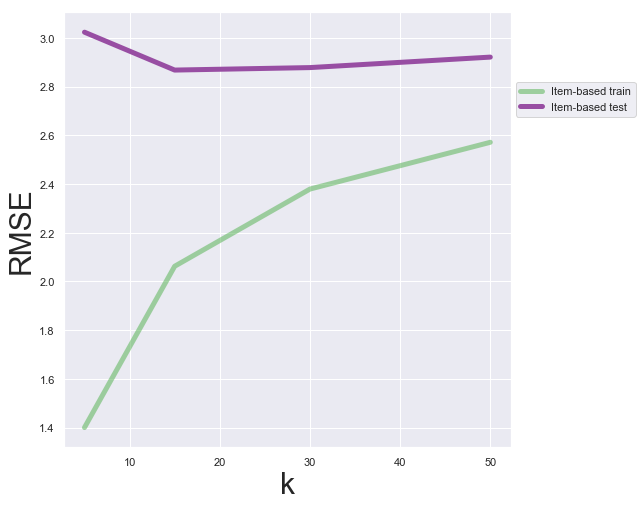

In [11]:
#Evaluation du modèle. 

k_array = [5, 15, 30, 50]
movie_test_rmse = []
movie_train_rmse = []
for k in tqdm(k_array):
    movie_pred = pred_movie(matrice_train, movie_similarity, k=k)      
    movie_train_rmse += [get_rmse(movie_pred, matrice_train) ]       
    movie_test_rmse +=  [get_rmse(movie_pred, matrice_test) ]


sns.set()
pal = sns.color_palette("Set1", 4)
plt.figure(figsize=(8, 8))
plt.plot(k_array, movie_train_rmse, c=pal[2], label='Item-based train', alpha=0.5, linewidth=5)
plt.plot(k_array, movie_test_rmse, c=pal[3], label='Item-based test', linewidth=5)
plt.legend(loc='best', fontsize=20)
plt.xlabel('k', fontsize=30);
plt.ylabel('RMSE', fontsize=30);
plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

#Dure 1heure pour s'executer. 15min par k 
#Pas mal, RMSE 2.85 pour k=15 pour test, 2.1 pour train

In [16]:
#Evaluation du modèle. 

k_array = [5, 15, 30, 50]
movie_test_rmse = []
movie_train_rmse = []
for k in tqdm(k_array):
    movie_pred = pred_movie(matrice_train, movie_similarity, k=k)      
    movie_train_rmse += [get_rmse(movie_pred, matrice_train) ]       
    movie_test_rmse +=  [get_rmse(movie_pred, matrice_test) ]


sns.set()
pal = sns.color_palette("Set1", 4)
plt.figure(figsize=(8, 8))
plt.plot(k_array, movie_train_rmse, c=pal[2], label='Item-based train', alpha=0.5, linewidth=5)
plt.plot(k_array, movie_test_rmse, c=pal[3], label='Item-based test', linewidth=5)
plt.legend(loc='best', fontsize=20)
plt.xlabel('k', fontsize=30);
plt.ylabel('RMSE', fontsize=30);
plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

#Dure 1heure pour s'executer. 15min par k 
#Pas mal, RMSE 2.85 pour k=15 pour test, 2.1 pour train

  0%|          | 0/3220 [00:00<?, ?it/s]



(22812, 3220)


IndexError: index 13101 is out of bounds for axis 1 with size 3220

user-based filtering

In [13]:
#Création des matrices de similarité
from sklearn.metrics.pairwise import cosine_similarity
user_similarity=cosine_similarity(matrice_train)
user_similarity.shape

(22812, 22812)

In [14]:
#Calcul des prédictions
def pred_user(ratings, user_similarity, k):    
    pred = np.zeros(ratings.shape)
    print(pred.shape)
    for u in tqdm(range(ratings.shape[0])):     
        top_k_users = np.argsort(user_similarity[:,u])[-1:-k-1:-1]  
        for i in tqdm(range(ratings.shape[1])):
            pred[u,i]=user_similarity[u,:][top_k_users].dot(ratings[:,i][top_k_users])
            pred[u,i]/=np.sum(np.abs(user_similarity[u,:][top_k_users]))+0.000001     
    return pred 


def get_rmse(pred, actual):
    pred = pred[actual.nonzero()].flatten() # Ignore nonzero terms.
    actual = actual[actual.nonzero()].flatten()
    return np.sqrt(mean_squared_error(pred, actual))

  0%|          | 0/3220 [00:00<?, ?it/s]

(22812, 3220)



  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  2%|▏         | 484/22812 [00:20<14:08, 26.31it/s]/s]


  3%|▎         | 643/22812 [00:26<13:46, 26.83it/s]t/s]


  4%|▎         | 802/22812 [00:32<13:54, 26.38it/s]/s]


  4%|▍         | 961/22812 [00:38<13:46, 26.45it/s]/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 102885.36it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  9%|▉         | 2076/22812 [01:21<13:48, 25.04it/s]s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 102610.21it/s]


100%|██████████| 3220/3220 [00:00<00:00, 93476.41it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 94378.51it/s]


100%|██████████| 3220/3220 [00:00<00:00, 96320.38it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 100549.88it/s]


100%|██████████| 3220/3220 [00:00<00:00, 102760.89it/s]


100%|██████████| 3220/3220 [00:00<00:00, 102557.23it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 94143.64it/s]


 27%|██▋       | 6066/22812 [03:57<10:40, 26.13it/s]s]


 27%|██▋       | 6225/22812 [04:03<10:30, 26.32it/s]/s]


 28%|██▊       | 6384/22812 [04:09<10:27, 26.19it/s]s]


 29%|██▊       | 6543/22812 [04:15<10:17, 26.35it/s]/s]


100%|██████████| 3220/3220 [00:00<00:00, 103417.15it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 97607.51it/s]


100%|██████████| 3220/3220 [00:00<00:00, 98374.65it/s]


 33%|███▎      | 7500/22812 [04:52<09:49, 25.96it/s]s]


 34%|███▎      | 7659/22812 [04:58<09:33, 26.44it/s]/s]


 34%|███▍      | 7818/22812 [05:04<09:46, 25.56it/s]/s]


100%|██████████| 3220/3220 [00:00<00:00, 92086.34it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 36%|███▌      | 8217/22812 [05:19<09:38, 25.21it/s]/s]


100%|██████████| 3220/3220 [00:00<00:00, 98715.47it/s]


100%|██████████| 3220/3220 [00:00<00:00, 86354.42it/s]


100%|██████████| 3220/3220 [00:00<00:00, 98981.71it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 83257.26it/s]


100%|██████████| 3220/3220 [00:00<00:00, 96464.17it/s]


100%|██████████| 3220/3220 [00:00<00:00, 85165.14it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101407.54it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 52%|█████▏    | 11799/22812 [07:37<07:21, 24.92it/s]]


 52%|█████▏    | 11958/22812 [07:43<07:10, 25.19it/s]]


 53%|█████▎    | 12117/22812 [07:49<06:44, 26.44it/s]s]


 54%|█████▍    | 12276/22812 [07:55<06:35, 26.66it/s]s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 102085.90it/s]


100%|██████████| 3220/3220 [00:00<00:00, 103864.12it/s]


100%|██████████| 3220/3220 [00:00<00:00, 90801.67it/s]


100%|██████████| 3220/3220 [00:00<00:00, 100261.01it/s]


100%|██████████| 3220/3220 [00:00<00:00, 97525.05it/s]


100%|██████████| 3220/3220 [00:00<00:00, 105806.41it/s]


100%|██████████| 3220/3220 [00:00<00:00, 103371.24it/s]


100%|██████████| 3220/3220 [00:00<00:00, 99478.21it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101966.44it/s]


100%|██████████| 3220/3220 [00:00<00:00, 102453.75it/s]


100%|██████████| 3220/3220 [00:00<00:00, 100521.44it/s]


100%|██████████| 3220/3220 [00:00<00:00, 104177.37it/s]


100%|██████████| 3220/3220 [00:00<00:00, 100710.34it/s]


100%|██████████| 3220/3220 [00:00<00:00, 107663.71it/s]


100%|██████████| 3220/3220 [00:00<00:00, 103497.19it/s]


100%|██████████| 3220/3220 [00:00<00:00, 104701.52it/s]


100%|██████████| 3220/3220 [00:00<00:00, 106169.89it/s]


100%|██████████| 3220/3220 [00:00<00:00, 96062.10it/s]


 68%|██████▊   | 15459/22812 [09:57<04:44, 25.84it/s]s]


 68%|██████▊   | 15618/22812 [10:03<04:29, 26.72it/s]s]


 69%|██████▉   | 15777/22812 [10:09<04:25, 26.53it/s]s]


 70%|██████▉   | 15936/22812 [10:15<04:20, 26.36it/s]]


 71%|███████   | 16095/22812 [10:21<04:18, 25.96it/s]]


 71%|███████▏  | 16254/22812 [10:27<04:11, 26.12it/s]s]


 72%|███████▏  | 16413/22812 [10:34<04:06, 25.99it/s]]


 73%|███████▎  | 16572/22812 [10:40<04:01, 25.79it/s]]


 73%|███████▎  | 16731/22812 [10:46<03:56, 25.69it/s]]


 74%|███████▍  | 16890/22812 [10:52<03:45, 26.27it/s]]


 75%|███████▍  | 17049/22812 [10:58<03:39, 26.31it/s]s]


 75%|███████▌  | 17208/22812 [11:04<03:33, 26.30it/s]]


 76%|███████▌  | 17367/22812 [11:10<03:30, 25.82it/s]s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101366.44it/s]


100%|██████████| 3220/3220 [00:00<00:00, 93737.87it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101778.94it/s]


100%|██████████| 3220/3220 [00:00<00:00, 99375.73it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 87%|████████▋ | 19836/22812 [12:45<01:54, 26.05it/s]s]


100%|██████████| 3220/3220 [00:00<00:00, 98649.86it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 92%|█████████▏| 20955/22812 [13:29<01:10, 26.36it/s]]


 93%|█████████▎| 21114/22812 [13:36<01:05, 26.10it/s]]


 93%|█████████▎| 21273/22812 [13:42<00:58, 26.23it/s]s]


 94%|█████████▍| 21432/22812 [13:48<00:54, 25.39it/s]]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 99079.74it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 99851.83it/s]


100%|██████████| 3220/3220 [00:00<00:00, 104319.00it/s]


100%|██████████| 3220/3220 [00:00<00:00, 90208.52it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]

(22812, 3220)



  1%|          | 165/22812 [00:06<14:46, 25.55it/s]t/s]


100%|██████████| 3220/3220 [00:00<00:00, 92531.13it/s]


100%|██████████| 3220/3220 [00:00<00:00, 96297.72it/s]


  3%|▎         | 645/22812 [00:25<14:00, 26.38it/s]t/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  6%|▌         | 1284/22812 [00:50<13:57, 25.70it/s]/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 93719.01it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 12%|█▏        | 2802/22812 [01:49<12:57, 25.75it/s]s]


100%|██████████| 3220/3220 [00:00<00:00, 98452.82it/s]


100%|██████████| 3220/3220 [00:00<00:00, 99435.00it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 86183.60it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 21%|██        | 4719/22812 [03:03<11:20, 26.58it/s]/s]


100%|██████████| 3220/3220 [00:00<00:00, 102242.01it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101896.43it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 98299.47it/s]


100%|██████████| 3220/3220 [00:00<00:00, 93290.45it/s]


100%|██████████| 3220/3220 [00:00<00:00, 95350.66it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101343.62it/s]


 30%|███       | 6876/22812 [04:27<10:18, 25.76it/s]/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 93984.45it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 41%|████      | 9273/22812 [06:00<08:45, 25.75it/s]/s]


100%|██████████| 3220/3220 [00:00<00:00, 95306.26it/s]


100%|██████████| 3220/3220 [00:00<00:00, 96246.25it/s]


 43%|████▎     | 9753/22812 [06:18<08:33, 25.43it/s]s]


100%|██████████| 3220/3220 [00:00<00:00, 100527.43it/s]


100%|██████████| 3220/3220 [00:00<00:00, 94064.96it/s]


 45%|████▍     | 10233/22812 [06:37<08:15, 25.39it/s]]


100%|██████████| 3220/3220 [00:00<00:00, 99897.62it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101590.61it/s]


 47%|████▋     | 10713/22812 [06:56<07:47, 25.88it/s]s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


 50%|████▉     | 11352/22812 [07:21<07:21, 25.94it/s]]


100%|██████████| 3220/3220 [00:00<00:00, 99638.20it/s]


100%|██████████| 3220/3220 [00:00<00:00, 101740.61it/s]


 52%|█████▏    | 11832/22812 [07:40<07:18, 25.04it/s]s]


100%|██████████| 3220/3220 [00:00<00:00, 102118.32it/s]


100%|██████████| 3220/3220 [00:00<00:00, 89186.88it/s]


 54%|█████▍    | 12312/22812 [07:59<06:47, 25.75it/s]s]


100%|██████████| 3220/3220 [00:00<00:00, 100814.83it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 3220/3220 [00:00<00:00, 98353.16it/s]


 57%|█████▋    | 13110/22812 [08:30<06:25, 25.20it/s]]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


(22812, 3220)


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]

(22812, 3220)



  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


  0%|          | 0/3220 [00:00<?, ?it/s]


100%|██████████| 22812/22812 [16:07<00:00, 23.54it/s]]


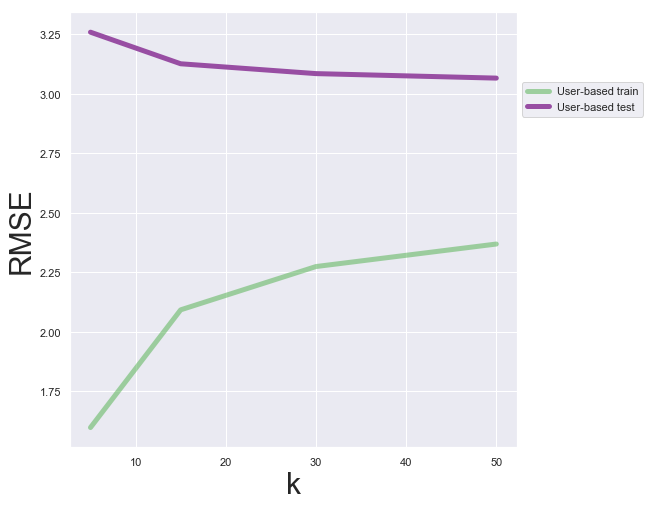

In [15]:
#Evaluation du modèle. 

k_array = [5, 15, 30, 50]
user_test_rmse = []
user_train_rmse = []
for k in k_array:
    user_pred = pred_user(matrice_train, user_similarity, k=k)      
    user_train_rmse += [get_rmse(user_pred, matrice_train) ]       
    user_test_rmse +=  [get_rmse(user_pred, matrice_test) ]


sns.set()
pal = sns.color_palette("Set1", 4)
plt.figure(figsize=(8, 8))
plt.plot(k_array, user_train_rmse, c=pal[2], label='User-based train', alpha=0.5, linewidth=5)
plt.plot(k_array, user_test_rmse, c=pal[3], label='User-based test', linewidth=5)
plt.legend(loc='best', fontsize=20)
plt.xlabel('k', fontsize=30);
plt.ylabel('RMSE', fontsize=30);
plt.legend(loc='center left', bbox_to_anchor=(1, 0.8))

#Dure 1heure pour s'executer. 15min par k 
#mouais.. score 3.1 pour k=30 pour test, score 2.25 pour train
#meilleur algo pour movie_based filtering